# Initialization

In [75]:
# ---- Patch 0: safer GPU config (run once, near the top) ----
import tensorflow as tf
tf.config.set_soft_device_placement(True)  # let TF fallback to CPU if needed

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPU(s) found and memory growth enabled: {gpus}")
    except Exception as e:
        print("Could not enable memory growth:", e)
else:
    print("No GPU detected; running on CPU.")


GPU(s) found and memory growth enabled: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [76]:
import glob
import numpy as np

npy_files = glob.glob('cached_np/*.npy')
data_arrays = {file.split('/')[-1].replace('.npy', ''): np.load(file) for file in npy_files}

print(f"Loaded {len(data_arrays)} variables from .npy files.")


Loaded 7 variables from .npy files.


# Preprocessing

In [77]:
vars_to_check = [
    'X_all',
    'Y_all',
    'wrench_all',
    'Z_all',
    'angles_all',
    'wrench_out_all',
    'currents_all'
]

for name in vars_to_check:
    if name in data_arrays:
        arr = np.array(data_arrays[name])
        print(f"{name}: shape={arr.shape}, dtype={arr.dtype}, "
              f"min={np.nanmin(arr):.6f}, max={np.nanmax(arr):.6f}, "
              f"NaNs={np.isnan(arr).sum()}")
    else:
        print(f"{name}: NOT FOUND in data_arrays")


X_all: shape=(1, 1411344), dtype=float64, min=-0.150000, max=0.150000, NaNs=0
Y_all: shape=(1, 1411344), dtype=float64, min=-0.150000, max=0.150000, NaNs=0
wrench_all: shape=(6, 1411344), dtype=float64, min=-71.323061, max=67.910946, NaNs=0
Z_all: shape=(1, 1411344), dtype=float64, min=0.005000, max=0.005000, NaNs=0
angles_all: shape=(3, 1411344), dtype=float64, min=-3.141593, max=3.141593, NaNs=0
wrench_out_all: shape=(6, 1411344), dtype=float64, min=-43712933.130251, max=36944979.677285, NaNs=0
currents_all: shape=(16, 1411344), dtype=float64, min=-5885.689556, max=16889.743946, NaNs=0


In [78]:
# Build ARR as [N,16] from whatever you loaded. Then re-run the previous analysis cell.

import numpy as np

def find_currents_matrix(dct):
    # 2D with 16 cols
    for v in dct.values():
        a = np.array(v)
        if a.ndim == 2 and a.shape[1] == 16:
            return a
    # 2D with 16 rows -> transpose
    for v in dct.values():
        a = np.array(v)
        if a.ndim == 2 and a.shape[0] == 16:
            return a.T
    # 1D or weird -> reshape by 16
    for v in dct.values():
        a = np.array(v).ravel()
        if a.size % 16 == 0 and a.size >= 16:
            return a.reshape(-1, 16)
    raise ValueError("No 16-current structure found in data_arrays.")

ARR = find_currents_matrix(data_arrays)
print("ARR shape:", ARR.shape)

ARR shape: (1411344, 16)


In [79]:
# Ensure shape is [N_samples, N_channels]
W = np.array(data_arrays['wrench_out_all'], dtype=float)
if W.shape[0] < W.shape[1]:
    W = W.T  # transpose to get samples as rows

print("Fixed wrench_out_all shape:", W.shape)  # should be (1895400, 6)

Fixed wrench_out_all shape: (1411344, 6)


In [80]:
import numpy as np

# Preprocess into sample-aligned arrays

def to_samples_first(arr):
    arr = np.array(arr, dtype=float)
    if arr.shape[0] < arr.shape[1]:
        arr = arr.T
    return arr

# Flatten small coordinate arrays
def flatten_coord(arr):
    return np.array(arr, dtype=float).ravel()

X_all = flatten_coord(data_arrays['X_all'])
Y_all = flatten_coord(data_arrays['Y_all'])
Z_all = flatten_coord(data_arrays['Z_all'])
angles_all = np.array(data_arrays['angles_all'], dtype=float)
if angles_all.shape[0] < angles_all.shape[1]:
    angles_all = angles_all.T  # now shape [N, 3]

wrench_all = to_samples_first(data_arrays['wrench_all'])          # [N, 6]
wrench_out_all = to_samples_first(data_arrays['wrench_out_all'])  # [N, 6]
currents_all = to_samples_first(data_arrays['currents_all'])      # [N, 16]

# Sanity check: all sample counts
N_samples = max(len(X_all), wrench_all.shape[0], currents_all.shape[0])
print("Sample counts:")
print(f"X_all:           {X_all.shape}")
print(f"Y_all:           {Y_all.shape}")
print(f"Z_all:           {Z_all.shape}")
print(f"angles_all:      {angles_all.shape}")
print(f"wrench_all:      {wrench_all.shape}")
print(f"wrench_out_all:  {wrench_out_all.shape}")
print(f"currents_all:    {currents_all.shape}")

# Verify alignment
if not (len(X_all) == len(Y_all) == len(Z_all) == angles_all.shape[0] == wrench_all.shape[0] == wrench_out_all.shape[0] == currents_all.shape[0]):
    print("WARNING: Arrays differ in length, need resampling or trimming.")
else:
    print("All arrays aligned to", N_samples, "samples.")


Sample counts:
X_all:           (1411344,)
Y_all:           (1411344,)
Z_all:           (1411344,)
angles_all:      (1411344, 3)
wrench_all:      (1411344, 6)
wrench_out_all:  (1411344, 6)
currents_all:    (1411344, 16)
All arrays aligned to 1411344 samples.


## Creating the Dataframe

In [81]:
import numpy as np
import pandas as pd


# Build dataframe
df = pd.DataFrame()

# Y, Z from data
df['X'] = X_all
df['Y'] = Y_all
df['Z'] = Z_all

# Angles
for i in range(angles_all.shape[1]):
    df[f'angle_{i+1}'] = angles_all[:, i]

# Wrench (input)
for i, name in enumerate(["Fx", "Fy", "Fz", "Tx", "Ty", "Tz"]):
    df[f'wrench_{name}'] = wrench_all[:, i]

# Wrench out
for i, name in enumerate(["Fx", "Fy", "Fz", "Tx", "Ty", "Tz"]):
    df[f'wrench_out_{name}'] = wrench_out_all[:, i]

# Currents
for i in range(currents_all.shape[1]):
    df[f'current_{i+1}'] = currents_all[:, i]

print("Final dataset shape:", df.shape)
print(df.head(10))


Final dataset shape: (1411344, 34)
          X     Y      Z   angle_1   angle_2   angle_3  wrench_Fx  wrench_Fy  \
0 -0.150000 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
1 -0.140625 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
2 -0.131250 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
3 -0.121875 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
4 -0.112500 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
5 -0.103125 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
6 -0.093750 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
7 -0.084375 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
8 -0.075000 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   
9 -0.065625 -0.15  0.005 -0.087266 -0.087266 -3.141593        1.0        0.0   

   wrench_Fz  wrench_Tx  ...  current_7  current_8  current_9  current_10  \
0      

# Data Analysis

## Wrench Investigation

Wrench summary:
  channel        min        p01       p25    median      mean        p75  \
0      Fx -71.762163 -35.896928 -7.649506 -0.000000 -2.004577   1.960230   
1      Fy -71.762163 -30.437419 -3.339252  0.022254  2.602734   8.828112   
2      Fz -71.762163 -68.943046 -2.149142  0.553492  6.656157  17.823183   
3      Tx -71.762163 -14.189055 -2.521515 -0.000000 -0.551370   1.014062   
4      Ty -66.109715 -13.550148 -0.965381  0.000000  0.083460   1.450946   
5      Tz -71.762163 -10.271214 -0.110946  0.341150  1.190018   2.892426   

         p99        max        std      skew       kurt  
0  28.626263  72.990359  13.312557 -0.141276   2.333586  
1  41.769258  72.990359  14.248236  0.500969   2.029865  
2  68.505280  72.990359  30.118061 -0.020711   0.486861  
3  13.673413  72.990359   4.541524 -0.022875   7.745742  
4  13.975309  72.990359   4.276740  0.062824  11.279306  
5  12.477598  72.990359   3.992579  0.552637  44.553678  


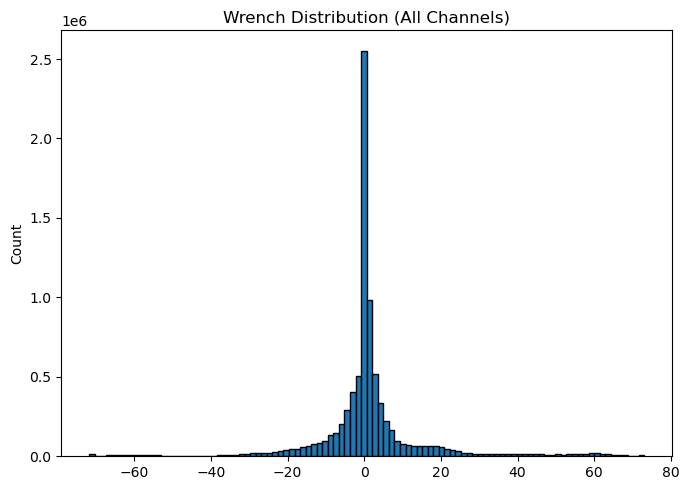

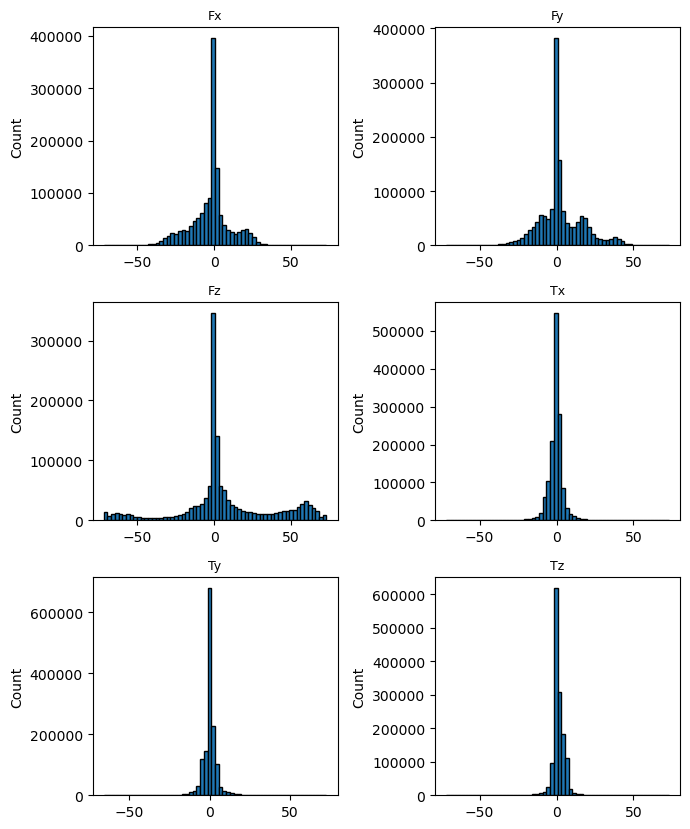

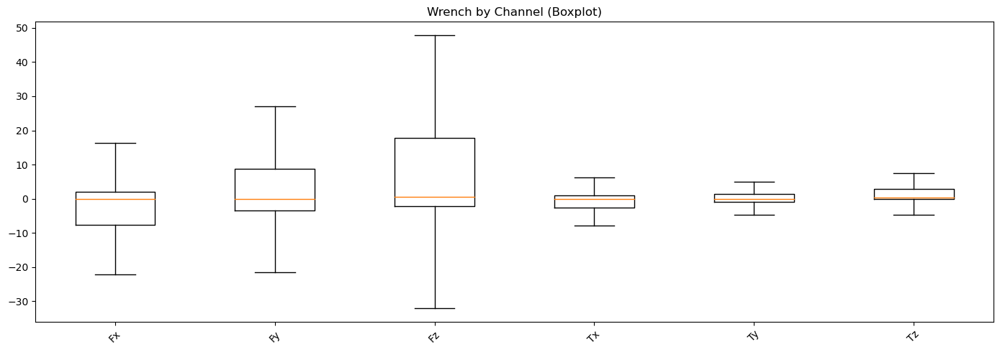

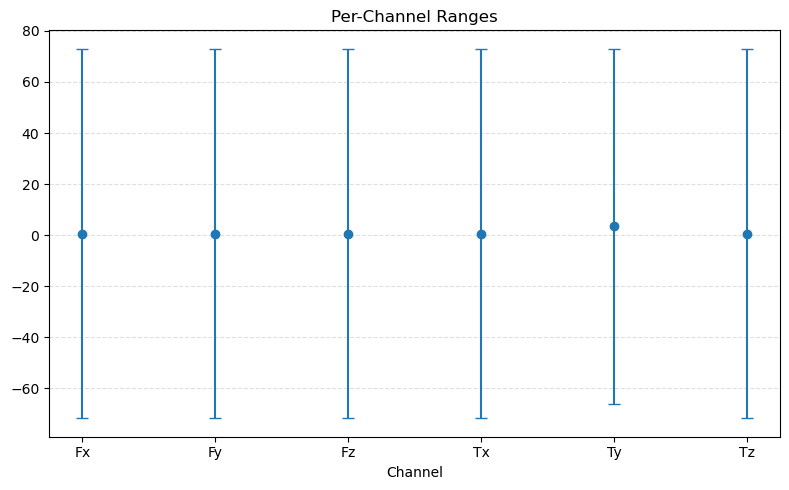

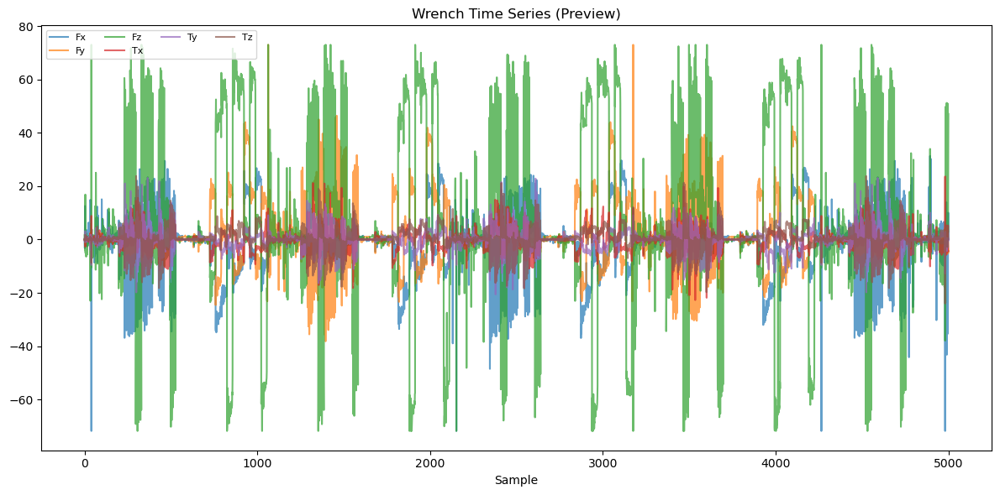

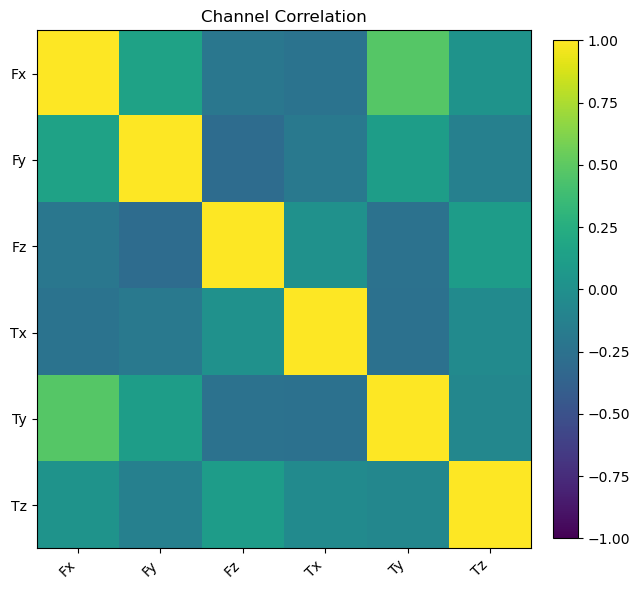

Saved wrench figures -> /home/alireza-linux/MLPM/ML_Project/analysis_plots_wrench


In [82]:
# Run full analysis for wrench_out_all (reuses same plotting style)

FS = None  # set if you know sampling rate
cols = W.shape[1]

# Channel names guess
if cols == 6:
    CH = ["Fx","Fy","Fz","Tx","Ty","Tz"]
elif cols == 12:
    CH = [f"F{i}" for i in range(1,7)] + [f"T{i}" for i in range(1,7)]
else:
    CH = [f"C{i:02d}" for i in range(1, cols+1)]

UNITS = ""          # leave blank if mixed units
SAVE_DIR = "analysis_plots_wrench"
CLIP_QUANTILES = (0.001, 0.999)
SMOOTH_WINDOW = 0

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy import signal, stats

X = np.array(W, dtype=float)
X[~np.isfinite(X)] = np.nan
mask_valid = ~np.all(np.isnan(X), axis=1)
X = X[mask_valid]

if CLIP_QUANTILES:
    lo, hi = np.nanquantile(X, CLIP_QUANTILES[0]), np.nanquantile(X, CLIP_QUANTILES[1])
    X = np.clip(X, lo, hi)

if SMOOTH_WINDOW and SMOOTH_WINDOW > 1:
    k = np.ones(SMOOTH_WINDOW)/SMOOTH_WINDOW
    X = np.apply_along_axis(lambda s: np.convolve(np.nan_to_num(s, nan=np.nanmean(s)), k, mode='same'), 0, X)

t = np.arange(X.shape[0]) if not FS else np.arange(X.shape[0])/float(FS)
txlabel = "Sample" if not FS else "Time (s)"

os.makedirs(SAVE_DIR, exist_ok=True)

# Summary
summary = pd.DataFrame({
    "channel": CH,
    "min":   np.nanmin(X, axis=0),
    "p01":   np.nanpercentile(X, 1, axis=0),
    "p25":   np.nanpercentile(X, 25, axis=0),
    "median":np.nanmedian(X, axis=0),
    "mean":  np.nanmean(X, axis=0),
    "p75":   np.nanpercentile(X, 75, axis=0),
    "p99":   np.nanpercentile(X, 99, axis=0),
    "max":   np.nanmax(X, axis=0),
    "std":   np.nanstd(X, axis=0, ddof=1),
    "skew":  [stats.skew(X[:,i], nan_policy='omit', bias=False) for i in range(cols)],
    "kurt":  [stats.kurtosis(X[:,i], nan_policy='omit', bias=False) for i in range(cols)],
})
print("Wrench summary:")
print(summary.round(6))

# Overall distribution
plt.figure(figsize=(7,5))
plt.hist(X.ravel(), bins=100, edgecolor='black')
plt.title("Wrench Distribution (All Channels)")
plt.xlabel(UNITS); plt.ylabel("Count")
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/hist_all.png", dpi=150); plt.show()

# Per-channel hist
r = int(np.ceil(np.sqrt(cols))); c = int(np.ceil(cols/r))
fig, axes = plt.subplots(r, c, figsize=(3.5*c, 2.8*r))
axes = np.array(axes).ravel()
for i in range(cols):
    axes[i].hist(X[:, i], bins=60, edgecolor='black')
    axes[i].set_title(CH[i], fontsize=9)
    axes[i].set_xlabel(UNITS); axes[i].set_ylabel("Count")
for j in range(cols, len(axes)):
    axes[j].axis('off')
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/hist_per_channel.png", dpi=180); plt.show()

# Boxplot
plt.figure(figsize=(min(16, 1.0*cols)+8, 5))
plt.boxplot([X[:,i] for i in range(cols)], showfliers=False, labels=CH)
plt.title("Wrench by Channel (Boxplot)")
plt.ylabel(UNITS); plt.xticks(rotation=45)
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/boxplot.png", dpi=150); plt.show()

# Ranges
mn, mx = np.nanmin(X,0), np.nanmax(X,0)
centers, half_rng = (mn+mx)/2, (mx-mn)/2
idx = np.arange(1, cols+1)
plt.figure(figsize=(max(8, 0.6*cols), 5))
plt.errorbar(idx, centers, yerr=half_rng, fmt='o', capsize=4)
plt.xticks(idx, CH, rotation=0)
plt.title("Per-Channel Ranges")
plt.xlabel("Channel"); plt.ylabel(UNITS)
plt.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/ranges.png", dpi=150); plt.show()

# Time preview
N_preview = min(X.shape[0], int(10*FS) if FS else 5000)
plt.figure(figsize=(12,6))
for i in range(cols):
    plt.plot(t[:N_preview], X[:N_preview, i], alpha=0.7, label=CH[i])
plt.title("Wrench Time Series (Preview)")
plt.xlabel(txlabel); plt.ylabel(UNITS)
plt.legend(ncol=min(4, cols), fontsize=8)
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/timeseries_preview.png", dpi=150); plt.show()

# Correlation
corr = np.corrcoef(X.T)
plt.figure(figsize=(6.5,6))
im = plt.imshow(corr, vmin=-1, vmax=1, aspect='auto')
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(np.arange(cols), CH, rotation=45, ha='right')
plt.yticks(np.arange(cols), CH)
plt.title("Channel Correlation")
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/corr_heatmap.png", dpi=150); plt.show()


print(f"Saved wrench figures -> {os.path.abspath(SAVE_DIR)}")


## Currents Investigation

### Statistical plots of the currents in the dataset

Summary:
   channel   min   p01        p25  median      mean        p75   p99   max  \
0      I01 -10.0 -10.0  -9.999998     0.0 -0.014177   9.999997  10.0  10.0   
1      I02 -10.0 -10.0 -10.000000     0.0 -0.009607  10.000000  10.0  10.0   
2      I03 -10.0 -10.0 -10.000000     0.0 -0.007018  10.000000  10.0  10.0   
3      I04 -10.0 -10.0  -9.999947     0.0 -0.004106   9.999942  10.0  10.0   
4      I05 -10.0 -10.0 -10.000000     0.0 -0.001412  10.000000  10.0  10.0   
5      I06 -10.0 -10.0 -10.000000     0.0  0.006206  10.000000  10.0  10.0   
6      I07 -10.0 -10.0 -10.000000     0.0  0.005911  10.000000  10.0  10.0   
7      I08 -10.0 -10.0  -9.676148     0.0 -0.003654   9.650259  10.0  10.0   
8      I09 -10.0 -10.0  -8.193575     0.0 -0.001812   8.162526  10.0  10.0   
9      I10 -10.0 -10.0  -8.487969     0.0  0.006065   8.543623  10.0  10.0   
10     I11 -10.0 -10.0  -6.750586     0.0  0.005555   6.812999  10.0  10.0   
11     I12 -10.0 -10.0  -5.005669     0.0 -0.003962   4

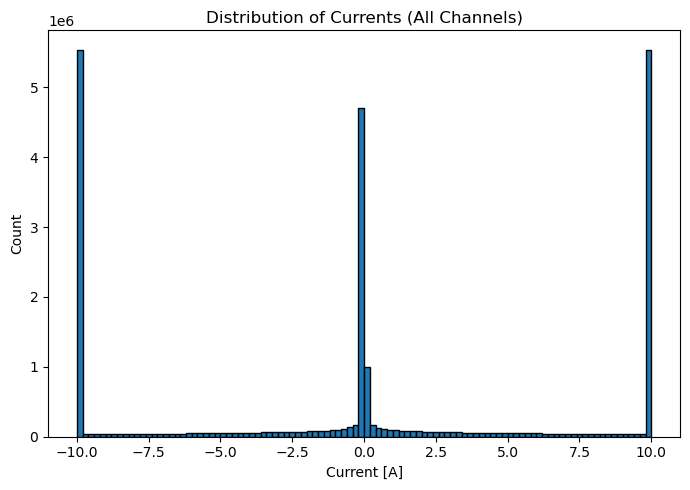

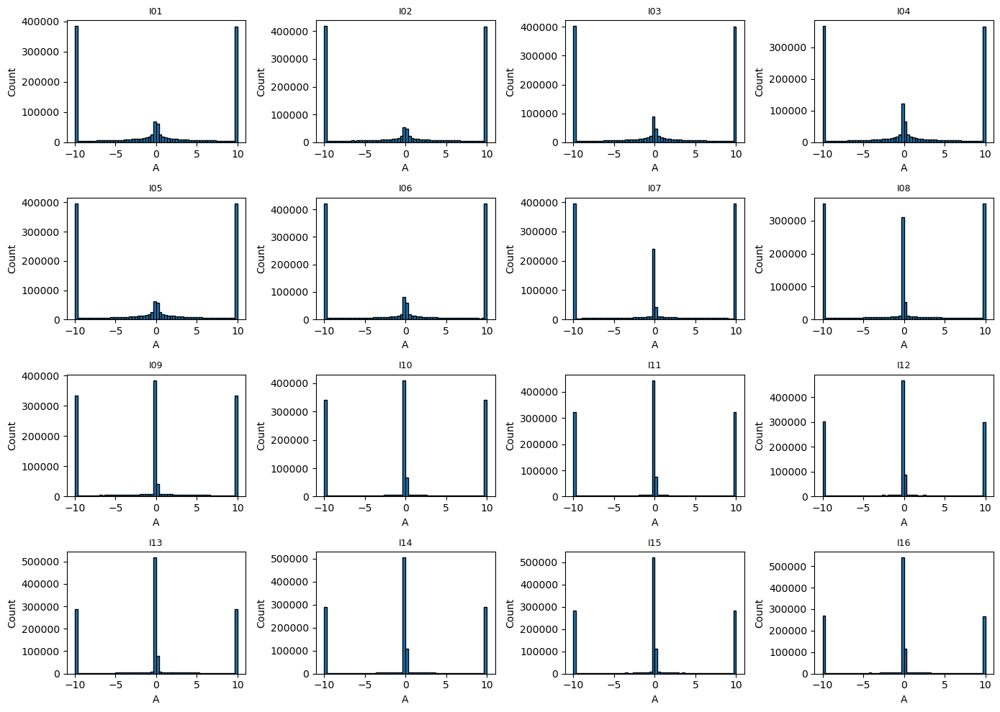

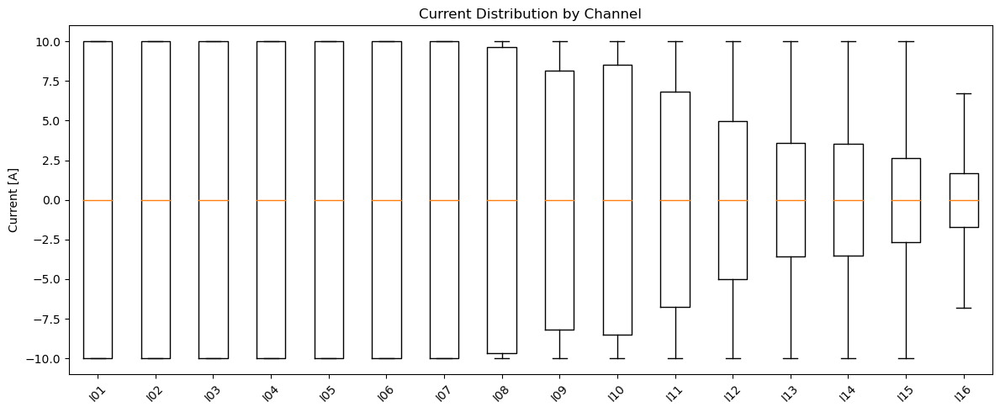

KeyboardInterrupt: 

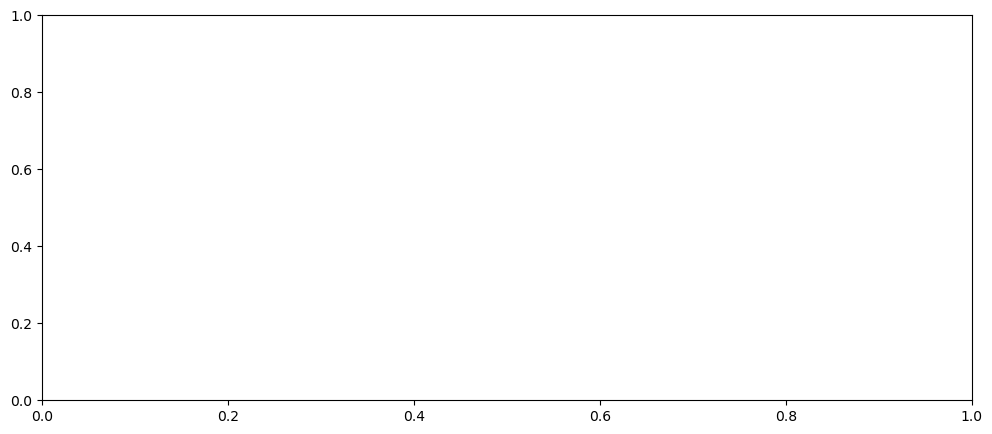

In [83]:
# Use existing ARR = [N,16] to run full analysis

# === CONFIG ===
FS = None          # sampling rate in Hz (None => x-axis in samples)
CHANNEL_NAMES = [f"I{i:02d}" for i in range(1,17)]
UNITS = "A"
CLIP_QUANTILES = (0.001, 0.999)  # None to disable
SMOOTH_WINDOW = 0                # 0/None to disable
SAVE_DIR = "analysis_plots"
# ==============

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy import signal, stats

assert ARR.ndim == 2 and ARR.shape[1] == 16, "ARR must be [N,16]"

# --- Preprocess ---
X = np.array(ARR, dtype=float)
X[~np.isfinite(X)] = np.nan
mask_valid = ~np.all(np.isnan(X), axis=1)
X = X[mask_valid]

if CLIP_QUANTILES:
    lo, hi = np.nanquantile(X, CLIP_QUANTILES[0]), np.nanquantile(X, CLIP_QUANTILES[1])
    X = np.clip(X, lo, hi)

if SMOOTH_WINDOW and SMOOTH_WINDOW > 1:
    k = np.ones(SMOOTH_WINDOW) / SMOOTH_WINDOW
    X = np.apply_along_axis(lambda s: np.convolve(np.nan_to_num(s, nan=np.nanmean(s)), k, mode='same'), 0, X)

t = np.arange(X.shape[0]) if not FS else np.arange(X.shape[0]) / float(FS)
txlabel = "Sample" if not FS else "Time (s)"

os.makedirs(SAVE_DIR, exist_ok=True)

# --- Summary stats ---
summary = pd.DataFrame({
    "channel": CHANNEL_NAMES,
    "min":   np.nanmin(X, axis=0),
    "p01":   np.nanpercentile(X, 1, axis=0),
    "p25":   np.nanpercentile(X, 25, axis=0),
    "median":np.nanmedian(X, axis=0),
    "mean":  np.nanmean(X, axis=0),
    "p75":   np.nanpercentile(X, 75, axis=0),
    "p99":   np.nanpercentile(X, 99, axis=0),
    "max":   np.nanmax(X, axis=0),
    "std":   np.nanstd(X, axis=0, ddof=1),
    "skew":  [stats.skew(X[:,i], nan_policy='omit', bias=False) for i in range(16)],
    "kurt":  [stats.kurtosis(X[:,i], nan_policy='omit', bias=False) for i in range(16)],
})
print("Summary:")
print(summary.round(6))

# --- Overall distribution ---
plt.figure(figsize=(7,5))
plt.hist(X.ravel(), bins=100, edgecolor='black')
plt.title("Distribution of Currents (All Channels)")
plt.xlabel(f"Current [{UNITS}]"); plt.ylabel("Count")
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/hist_all.png", dpi=150); plt.show()

# --- Per-channel hist (4x4) ---
fig, axes = plt.subplots(4,4, figsize=(14,10))
axes = axes.ravel()
for i in range(16):
    axes[i].hist(X[:, i], bins=60, edgecolor='black')
    axes[i].set_title(CHANNEL_NAMES[i], fontsize=9)
    axes[i].set_xlabel(UNITS); axes[i].set_ylabel("Count")
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/hist_per_channel.png", dpi=180); plt.show()

# --- Boxplot ---
plt.figure(figsize=(12,5))
plt.boxplot([X[:,i] for i in range(16)], showfliers=False, labels=CHANNEL_NAMES)
plt.title("Current Distribution by Channel")
plt.ylabel(f"Current [{UNITS}]"); plt.xticks(rotation=45)
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/boxplot_channels.png", dpi=150); plt.show()

# --- Violin ---
plt.figure(figsize=(12,5))
plt.violinplot([X[:,i] for i in range(16)], showmeans=True, showextrema=False)
plt.title("Current Distribution by Channel (Violin)")
plt.ylabel(f"Current [{UNITS}]")
plt.xticks(ticks=np.arange(1,17), labels=CHANNEL_NAMES, rotation=45)
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/violin_channels.png", dpi=150); plt.show()

# --- Range per channel ---
col_min, col_max = np.nanmin(X,0), np.nanmax(X,0)
centers, half_rng = (col_min+col_max)/2, (col_max-col_min)/2
x = np.arange(1,17)
plt.figure(figsize=(10,5))
plt.errorbar(x, centers, yerr=half_rng, fmt='o', capsize=4)
plt.xticks(x, CHANNEL_NAMES); plt.title("Per-Channel Current Ranges")
plt.xlabel("Channel"); plt.ylabel(f"Current [{UNITS}]")
plt.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/ranges_channels.png", dpi=150); plt.show()

# --- Correlation heatmap ---
corr = np.corrcoef(X.T)
plt.figure(figsize=(7,6))
im = plt.imshow(corr, vmin=-1, vmax=1, aspect='auto')
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(np.arange(16), CHANNEL_NAMES, rotation=45, ha='right')
plt.yticks(np.arange(16), CHANNEL_NAMES)
plt.title("Channel-Channel Correlation")
plt.tight_layout(); plt.savefig(f"{SAVE_DIR}/corr_heatmap.png", dpi=150); plt.show()



### Currents values over the plane at fixed orientation and input

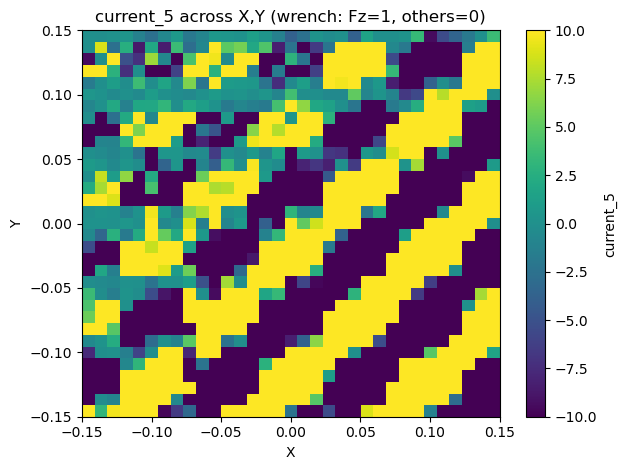

In [ ]:
# filter to the fixed input wrench: Fx=Fy=Tx=Ty=Tz=0, Fz=1
w_cols = ['wrench_Fx','wrench_Fy','wrench_Fz','wrench_Tx','wrench_Ty','wrench_Tz']
df_ = df[(df['wrench_Fx']==0)&(df['wrench_Fy']==0)&(df['wrench_Fz']==0)&
         (df['wrench_Tx']==0)&(df['wrench_Ty']==1)&(df['wrench_Tz']==0)].copy()

# drop/ignore wrench_out*
df_ = df_.drop(columns=[c for c in df_.columns if c.startswith('wrench_out_')], errors='ignore')

# keep other things fixed: pick one unique value for every non-(X,Y,current_*,wrench_*) column
fixed_candidates = [
    c for c in df_.columns
    if c not in ['X','Y','current_1'] and not c.startswith('current_') and not c.startswith('wrench_')
]
for c in fixed_candidates:
    vals = df_[c].dropna().unique()
    if len(vals) > 0:
        df_ = df_[df_[c] == vals[0]]

# make a grid of current_1 over X,Y
grid = df_.pivot_table(index='Y', columns='X', values='current_16', aggfunc='mean')
grid = grid.sort_index().sort_index(axis=1)

# plot
import matplotlib.pyplot as plt
plt.figure()
plt.imshow(
    grid.values, origin='lower', aspect='auto',
    extent=[grid.columns.min(), grid.columns.max(), grid.index.min(), grid.index.max()]
)
plt.colorbar(label='current_5')
plt.xlabel('X'); plt.ylabel('Y')
plt.title('current_5 across X,Y (wrench: Fz=1, others=0)')
plt.tight_layout()


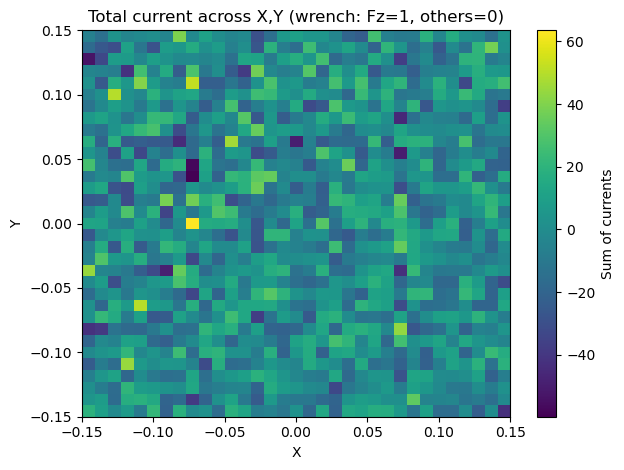

In [ ]:
# sum all currents
current_cols = [c for c in df_.columns if c.startswith('current_')]
df_['current_sum'] = df_[current_cols].sum(axis=1)

# make grid over X,Y for the sum
grid = df_.pivot_table(index='Y', columns='X', values='current_sum', aggfunc='mean')
grid = grid.sort_index().sort_index(axis=1)

# plot
import matplotlib.pyplot as plt
plt.figure()
plt.imshow(
    grid.values, origin='lower', aspect='auto',
    extent=[grid.columns.min(), grid.columns.max(), grid.index.min(), grid.index.max()]
)
plt.colorbar(label='Sum of currents')
plt.xlabel('X'); plt.ylabel('Y')
plt.title('Total current across X,Y (wrench: Fz=1, others=0)')
plt.tight_layout()

### Currents dependancy on angles analysis

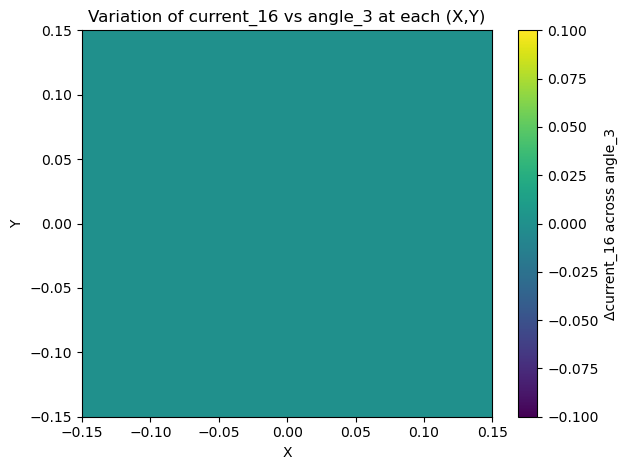

In [ ]:
# keep angle_3 free; fix everything else (angles 1&2 fixed)
fixed_cols = [
    c for c in df_.columns
    if c not in ['X','Y','angle_1'] and not c.startswith('current_') and not c.startswith('wrench_')
]
for c in fixed_cols:
    vals = df_[c].dropna().unique()
    if len(vals): df_ = df_[df_[c] == vals[0]]

# ---- choose what to measure ----
# (A) total current variation across angle_3
current_cols = [c for c in df_.columns if c.startswith('current_')]
df_['current_sum'] = df_[current_cols].sum(axis=1)
target = 'current_sum'

# # (B) single coil instead (uncomment to use)
target = 'current_16'

# range (max - min) over angle_3 at each (X,Y)
delta_xy = (df_.groupby(['X','Y'])[target]
              .agg(lambda s: s.max() - s.min())
              .reset_index(name='delta'))

# heatmap
grid = delta_xy.pivot(index='Y', columns='X', values='delta').sort_index().sort_index(axis=1)

import matplotlib.pyplot as plt
plt.figure()
plt.imshow(
    grid.values, origin='lower', aspect='auto',
    extent=[grid.columns.min(), grid.columns.max(), grid.index.min(), grid.index.max()]
)
plt.colorbar(label=f'Δ{target} across angle_3')
plt.xlabel('X'); plt.ylabel('Y')
plt.title(f'Variation of {target} vs angle_3 at each (X,Y)')
plt.tight_layout()


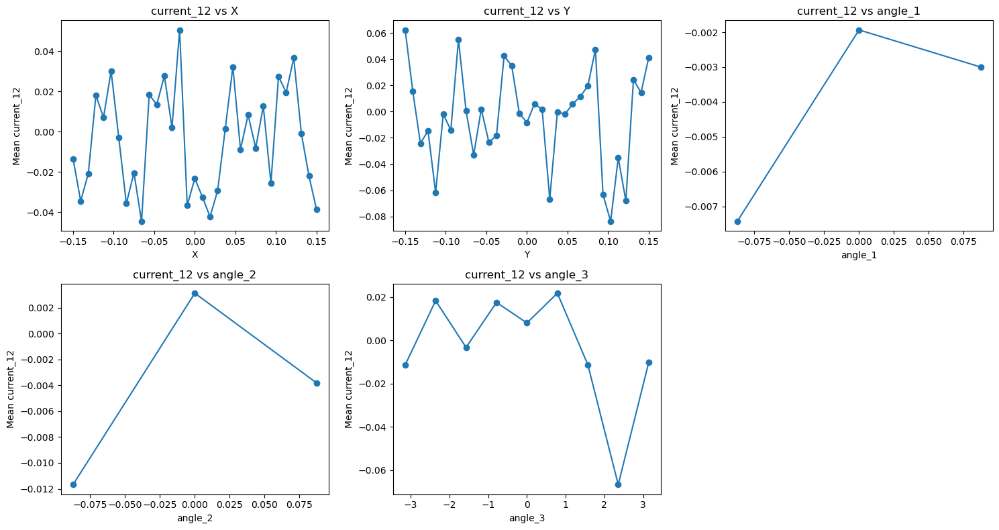

In [ ]:
import matplotlib.pyplot as plt

target = 'current_12'  # change to current_5 or others if you want

vars_to_check = ['X', 'Y', 'angle_1', 'angle_2', 'angle_3']

plt.figure(figsize=(15, 8))

for i, var in enumerate(vars_to_check, 1):
    mean_vals = df.groupby(var)[target].mean().reset_index()
    plt.subplot(2, 3, i)
    plt.plot(mean_vals[var], mean_vals[target], marker='o')
    plt.xlabel(var)
    plt.ylabel(f"Mean {target}")
    plt.title(f"{target} vs {var}")

plt.tight_layout()
plt.show()


### Current values over dataset samples

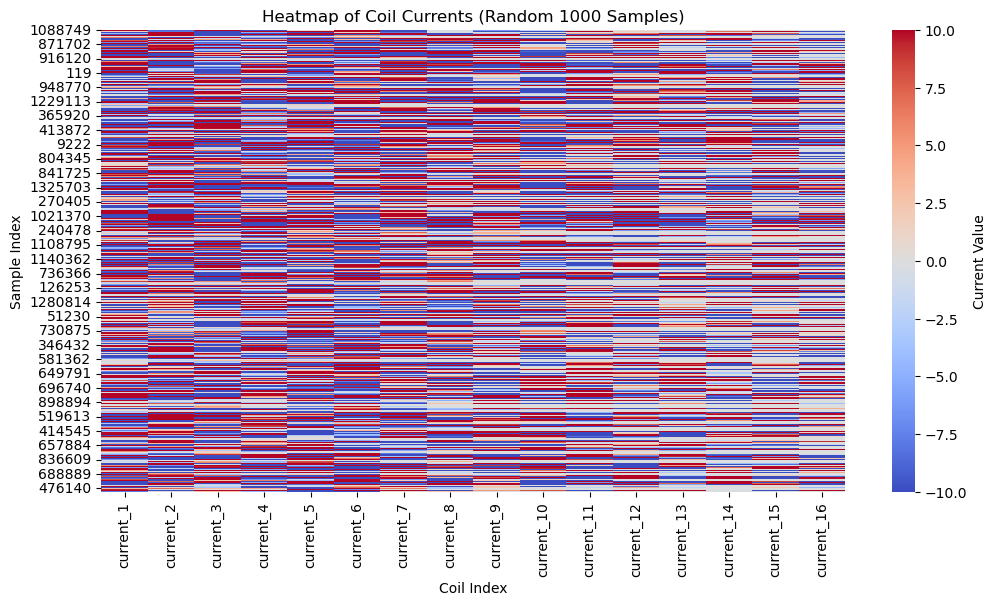

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Pick 1000 random samples
curr_cols = [c for c in df.columns if c.startswith('current_')]
rand_idx = np.random.choice(df.index, size=1000, replace=False)
currents_subset = df.loc[rand_idx, curr_cols]

plt.figure(figsize=(12, 6))
sns.heatmap(currents_subset, cmap='coolwarm', center=0, cbar_kws={'label': 'Current Value'})
plt.xlabel('Coil Index')
plt.ylabel('Sample Index')
plt.title('Heatmap of Coil Currents (Random 1000 Samples)')
plt.show()


### Frequency Analysis of currents over X-Y Plane

Visualize for one coil as an example

Dominant spatial frequency vector: (9.6970, -9.6970)
Dominant wavelength: 0.0729 units
Orientation of bands: -45.00 degrees


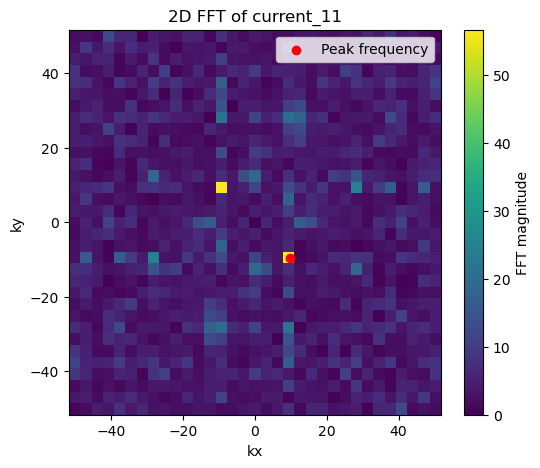

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

target = 'current_11'  # change if you want another coil

# Pivot into a 2D grid
grid = df.pivot_table(index='Y', columns='X', values=target, aggfunc='mean')
grid = grid.sort_index().sort_index(axis=1)  # sort axes

# Coordinates
X_coords = grid.columns.to_numpy()
Y_coords = grid.index.to_numpy()

# FFT
F = np.fft.fftshift(np.fft.fft2(grid.fillna(0).to_numpy()))
F_mag = np.abs(F)

# Find dominant frequency (ignore DC component)
center = tuple(np.array(F_mag.shape) // 2)
F_mag[center] = 0
peak_idx = np.unravel_index(np.argmax(F_mag), F_mag.shape)

# Frequency steps
dx = X_coords[1] - X_coords[0]
dy = Y_coords[1] - Y_coords[0]
kx = np.fft.fftshift(np.fft.fftfreq(len(X_coords), d=dx))
ky = np.fft.fftshift(np.fft.fftfreq(len(Y_coords), d=dy))

peak_kx = kx[peak_idx[1]]
peak_ky = ky[peak_idx[0]]

# Wavelength & orientation
wavelength = 1 / np.sqrt(peak_kx**2 + peak_ky**2)
orientation_deg = np.degrees(np.arctan2(peak_ky, peak_kx))

print(f"Dominant spatial frequency vector: ({peak_kx:.4f}, {peak_ky:.4f})")
print(f"Dominant wavelength: {wavelength:.4f} units")
print(f"Orientation of bands: {orientation_deg:.2f} degrees")

# Plot FFT magnitude
plt.figure(figsize=(6,5))
plt.imshow(F_mag, extent=[kx.min(), kx.max(), ky.min(), ky.max()], origin='lower', aspect='auto')
plt.colorbar(label='FFT magnitude')
plt.scatter([peak_kx], [peak_ky], color='red', label='Peak frequency')
plt.xlabel('kx')
plt.ylabel('ky')
plt.title(f'2D FFT of {target}')
plt.legend()
plt.show()


The report of FFt for all coils

In [ ]:
import numpy as np
import pandas as pd

def fft_xy_params_for_all_coils(df, current_prefix='current_'):
    results = []
    Xs = np.sort(df['X'].unique())
    Ys = np.sort(df['Y'].unique())
    dx = np.diff(Xs).mean()
    dy = np.diff(Ys).mean()
    kx = np.fft.fftshift(np.fft.fftfreq(len(Xs), d=dx))
    ky = np.fft.fftshift(np.fft.fftfreq(len(Ys), d=dy))

    for col in [c for c in df.columns if c.startswith(current_prefix)]:
        grid = (df.pivot_table(index='Y', columns='X', values=col, aggfunc='mean')
                  .reindex(index=Ys, columns=Xs))
        A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()

        F = np.fft.fftshift(np.fft.fft2(A))
        M = np.abs(F)
        cy, cx = np.array(M.shape)//2
        M[cy, cx] = 0  # drop DC
        py, px = np.unravel_index(np.argmax(M), M.shape)

        kx_peak = kx[px]
        ky_peak = ky[py]
        k_mag = np.hypot(kx_peak, ky_peak)
        wavelength = 1.0/k_mag if k_mag > 0 else np.nan

        k_angle_deg = np.degrees(np.arctan2(ky_peak, kx_peak))            # wavevector angle
        bands_angle_deg = (k_angle_deg + 90.0 + 180.0) % 180.0            # stripe orientation

        results.append({
            'coil': col,
            'kx': kx_peak,
            'ky': ky_peak,
            'k_mag': k_mag,
            'wavelength': wavelength,
            'k_angle_deg': k_angle_deg,
            'bands_angle_deg': bands_angle_deg
        })

    return pd.DataFrame(results).sort_values('coil').reset_index(drop=True)

# usage:
params_df = fft_xy_params_for_all_coils(df)
print(params_df)


/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()
/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()
/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()
/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or o

          coil         kx         ky      k_mag  wavelength  k_angle_deg  \
0    current_1   9.696970  -9.696970  13.713586    0.072920   -45.000000   
1   current_10   9.696970  -9.696970  13.713586    0.072920   -45.000000   
2   current_11   9.696970  -9.696970  13.713586    0.072920   -45.000000   
3   current_12   9.696970  -9.696970  13.713586    0.072920   -45.000000   
4   current_13  -9.696970  -9.696970  13.713586    0.072920  -135.000000   
5   current_14   9.696970  -9.696970  13.713586    0.072920   -45.000000   
6   current_15  -9.696970  -9.696970  13.713586    0.072920  -135.000000   
7   current_16  -9.696970  -9.696970  13.713586    0.072920  -135.000000   
8    current_2  -9.696970  -9.696970  13.713586    0.072920  -135.000000   
9    current_3  -9.696970  -9.696970  13.713586    0.072920  -135.000000   
10   current_4  -9.696970  -9.696970  13.713586    0.072920  -135.000000   
11   current_5 -42.020202 -51.717172  66.636051    0.015007  -129.093859   
12   current

/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()
/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()
/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  A = grid.interpolate(axis=0).interpolate(axis=1).fillna(method='ffill').fillna(method='bfill').to_numpy()
/tmp/ipykernel_5952/2115705781.py:16: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or o

# Feature Extraction

In [17]:
df.head()

,X,Y,Z,angle_1,angle_2,angle_3,wrench_Fx,wrench_Fy,wrench_Fz,wrench_Tx,...,current_7,current_8,current_9,current_10,current_11,current_12,current_13,current_14,current_15,current_16
0,-0.150000,-0.15,0.005,-0.087266,-0.087266,-3.141593,1.0,0.0,0.0,0.0,...,-10.000000,-4.312420,-10.000000,10.000000,9.380868,-10.000000,10.000000,-10.000000,10.000000,10.000000
1,-0.140625,-0.15,0.005,-0.087266,-0.087266,-3.141593,1.0,0.0,0.0,0.0,...,-10.000000,-6.186670,-10.000000,10.000000,5.427733,-10.000000,10.000000,-10.000000,3.694898,10.000000
2,-0.131250,-0.15,0.005,-0.087266,-0.087266,-3.141593,1.0,0.0,0.0,0.0,...,10.000000,9.186635,-5.858047,10.000000,-0.703584,-1.272686,-0.492354,0.891581,-1.653864,3.078829
3,-0.121875,-0.15,0.005,-0.087266,-0.087266,-3.141593,1.0,0.0,0.0,0.0,...,-10.000000,-10.000000,-10.000000,9.134971,10.000000,-1.060216,10.000000,-5.549140,-10.000000,3.863199
4,-0.112500,-0.15,0.005,-0.087266,-0.087266,-3.141593,1.0,0.0,0.0,0.0,...,1.232469,-2.340074,-10.000000,10.000000,10.000000,-10.000000,10.000000,-10.000000,5.231467,10.000000


In [18]:
df.columns

Index(['X', 'Y', 'Z', 'angle_1', 'angle_2', 'angle_3', 'wrench_Fx',
       'wrench_Fy', 'wrench_Fz', 'wrench_Tx', 'wrench_Ty', 'wrench_Tz',
       'wrench_out_Fx', 'wrench_out_Fy', 'wrench_out_Fz', 'wrench_out_Tx',
       'wrench_out_Ty', 'wrench_out_Tz', 'current_1', 'current_2', 'current_3',
       'current_4', 'current_5', 'current_6', 'current_7', 'current_8',
       'current_9', 'current_10', 'current_11', 'current_12', 'current_13',
       'current_14', 'current_15', 'current_16'],
      dtype='object')

## Phase1: 

### Drop unnecessary columns

drop wrench_out

In [19]:
# Drop columns containing 'wrench_out' in their name
df = df.drop(columns=[col for col in df.columns if 'wrench_out' in col])


In [20]:
df.columns

Index(['X', 'Y', 'Z', 'angle_1', 'angle_2', 'angle_3', 'wrench_Fx',
       'wrench_Fy', 'wrench_Fz', 'wrench_Tx', 'wrench_Ty', 'wrench_Tz',
       'current_1', 'current_2', 'current_3', 'current_4', 'current_5',
       'current_6', 'current_7', 'current_8', 'current_9', 'current_10',
       'current_11', 'current_12', 'current_13', 'current_14', 'current_15',
       'current_16'],
      dtype='object')

### change angles to sin/cos and defining r + dropping raw angles

In [21]:
# Step 2 — Feature creation: angle sin/cos + r_xyz
def create_features(df, angle_cols=("angle_1", "angle_2", "angle_3"), angle_in_degrees=True):
    import numpy as np  # remove if already imported

    # Work on a copy to avoid side-effects
    out = df.copy()

    # Angle encoding (sin/cos); drop raw angles
    if angle_cols:
        angles = out.loc[:, angle_cols].astype(float)
        if angle_in_degrees:
            angles = np.deg2rad(angles)
        for col in angle_cols:
            out[f"{col}_sin"] = np.sin(angles[col])
            out[f"{col}_cos"] = np.cos(angles[col])
        out.drop(columns=list(angle_cols), inplace=True, errors="ignore")

    # r = sqrt(X^2 + Y^2 + Z^2)
    out["r_xyz"] = np.sqrt(out["X"]**2 + out["Y"]**2 + out["Z"]**2)

    return out

# Apply
df = create_features(df, angle_cols=("angle_1", "angle_2", "angle_3"), angle_in_degrees=True)


In [22]:
df.columns

Index(['X', 'Y', 'Z', 'wrench_Fx', 'wrench_Fy', 'wrench_Fz', 'wrench_Tx',
       'wrench_Ty', 'wrench_Tz', 'current_1', 'current_2', 'current_3',
       'current_4', 'current_5', 'current_6', 'current_7', 'current_8',
       'current_9', 'current_10', 'current_11', 'current_12', 'current_13',
       'current_14', 'current_15', 'current_16', 'angle_1_sin', 'angle_1_cos',
       'angle_2_sin', 'angle_2_cos', 'angle_3_sin', 'angle_3_cos', 'r_xyz'],
      dtype='object')

### Add frequency features

In [23]:
# Step 3 — XY wave features (with high-frequency terms)
def add_xy_wave_features(df, w1=86.2, w2=200.0, use_high=True):
    import numpy as np  # remove if already imported

    out = df.copy()
    s45  = (out['X'] - out['Y']) / np.sqrt(2)
    s135 = (out['X'] + out['Y']) / np.sqrt(2)

    cols = {
        "sin_w1_s45":  np.sin(w1 * s45),
        "cos_w1_s45":  np.cos(w1 * s45),
        "sin_w1_s135": np.sin(w1 * s135),
        "cos_w1_s135": np.cos(w1 * s135),
        "bias":        np.ones(len(out)),
        "s45":         s45,
        "s135":        s135,
    }

    if use_high:
        cols.update({
            "sin_w2_s45":  np.sin(w2 * s45),
            "cos_w2_s45":  np.cos(w2 * s45),
            "sin_w2_s135": np.sin(w2 * s135),
            "cos_w2_s135": np.cos(w2 * s135),
        })

    for k, v in cols.items():
        out[k] = v

    return out

# Apply
df = add_xy_wave_features(df, w1=86.2, w2=200.0, use_high=True)


In [24]:
df.columns

Index(['X', 'Y', 'Z', 'wrench_Fx', 'wrench_Fy', 'wrench_Fz', 'wrench_Tx',
       'wrench_Ty', 'wrench_Tz', 'current_1', 'current_2', 'current_3',
       'current_4', 'current_5', 'current_6', 'current_7', 'current_8',
       'current_9', 'current_10', 'current_11', 'current_12', 'current_13',
       'current_14', 'current_15', 'current_16', 'angle_1_sin', 'angle_1_cos',
       'angle_2_sin', 'angle_2_cos', 'angle_3_sin', 'angle_3_cos', 'r_xyz',
       'sin_w1_s45', 'cos_w1_s45', 'sin_w1_s135', 'cos_w1_s135', 'bias', 's45',
       's135', 'sin_w2_s45', 'cos_w2_s45', 'sin_w2_s135', 'cos_w2_s135'],
      dtype='object')

### Drop current outliers

In [25]:
# Step 4 — Drop rows with any |current| > 10
def drop_current_outliers(df, current_cols, threshold=10.0):
    import pandas as pd  # remove if already imported

    abs_curr = df.loc[:, current_cols].apply(pd.to_numeric, errors="coerce").abs()
    too_big = abs_curr.gt(threshold).any(axis=1).fillna(False)
    dropped_mask = too_big.reindex(df.index, fill_value=False)
    df_clean = df.loc[~too_big].copy()

    return df_clean, dropped_mask

# Filter to existing current columns
valid_current_cols = [c for c in current_cols if c in df.columns]

df, dropped_mask = drop_current_outliers(
    df,
    current_cols=valid_current_cols,
    threshold=10.0
)


In [26]:
df.head

<bound method NDFrame.head of                 X     Y      Z  wrench_Fx  wrench_Fy  wrench_Fz  wrench_Tx  \
0       -0.150000 -0.15  0.005   1.000000    0.00000    0.00000   0.000000   
1       -0.140625 -0.15  0.005   1.000000    0.00000    0.00000   0.000000   
2       -0.131250 -0.15  0.005   1.000000    0.00000    0.00000   0.000000   
3       -0.121875 -0.15  0.005   1.000000    0.00000    0.00000   0.000000   
4       -0.112500 -0.15  0.005   1.000000    0.00000    0.00000   0.000000   
...           ...   ...    ...        ...        ...        ...        ...   
1411337  0.093750  0.15  0.005 -13.381404   16.33448  -62.27905  -4.121966   
1411339  0.112500  0.15  0.005 -13.381404   16.33448  -62.27905  -4.121966   
1411341  0.131250  0.15  0.005 -13.381404   16.33448  -62.27905  -4.121966   
1411342  0.140625  0.15  0.005 -13.381404   16.33448  -62.27905  -4.121966   
1411343  0.150000  0.15  0.005 -13.381404   16.33448  -62.27905  -4.121966   

         wrench_Ty  wrench_Tz  cu

     current_1  current_2  current_3  current_4  current_5  current_6  \
min      -10.0      -10.0      -10.0      -10.0      -10.0      -10.0   
max       10.0       10.0       10.0       10.0       10.0       10.0   

     current_7  current_8  current_9  current_10  current_11  current_12  \
min      -10.0      -10.0      -10.0       -10.0       -10.0       -10.0   
max       10.0       10.0       10.0        10.0        10.0        10.0   

     current_13  current_14  current_15  current_16  
min       -10.0       -10.0       -10.0       -10.0  
max        10.0        10.0        10.0        10.0  


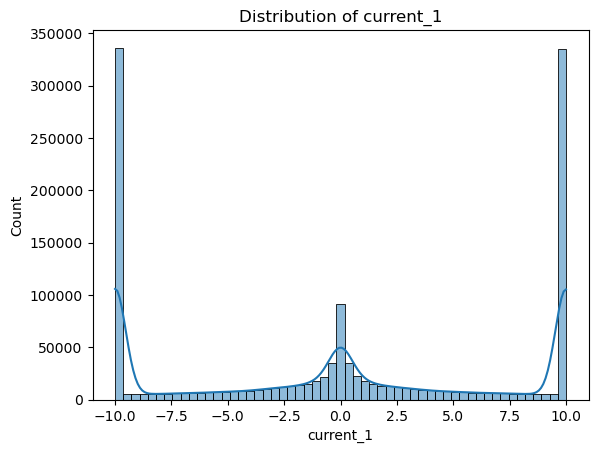

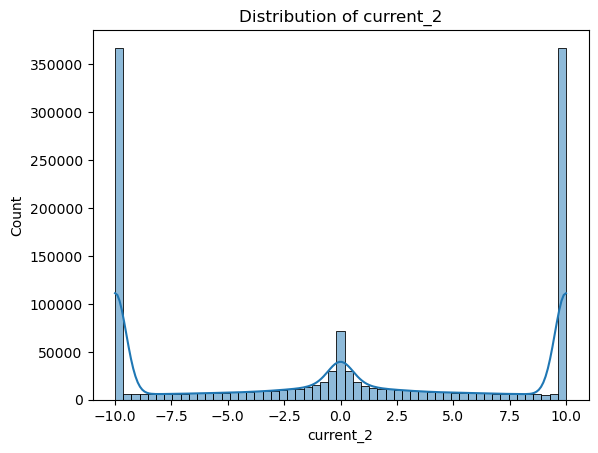

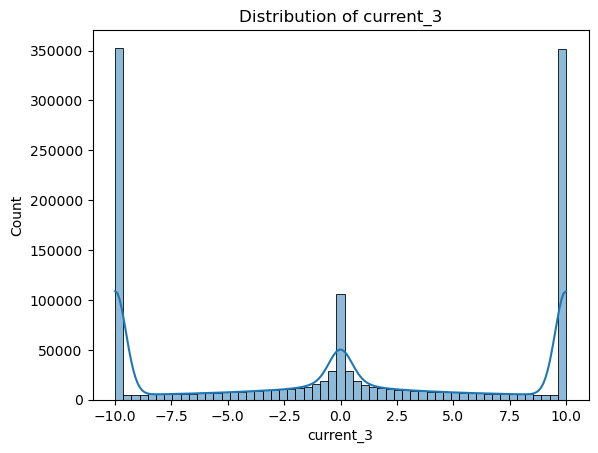

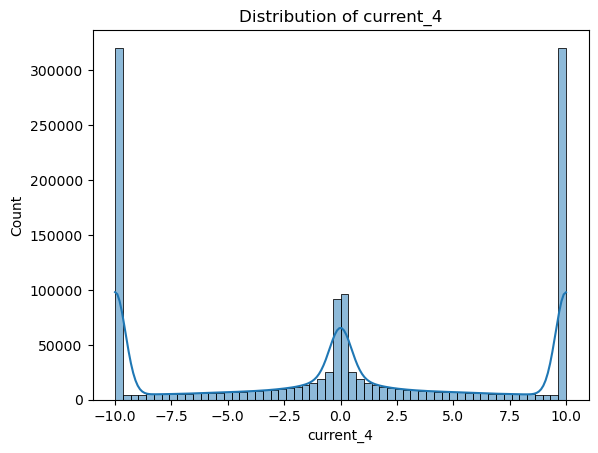

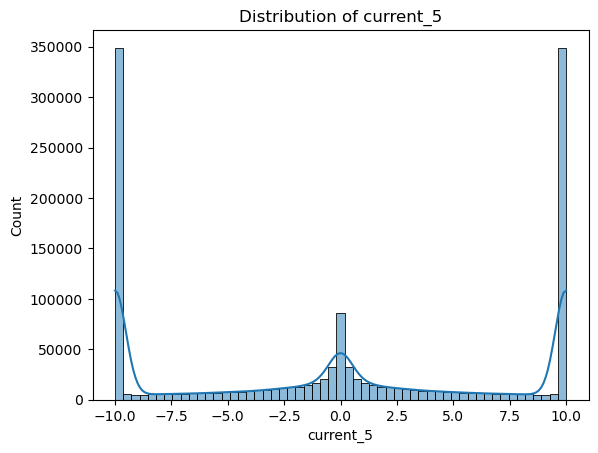

...

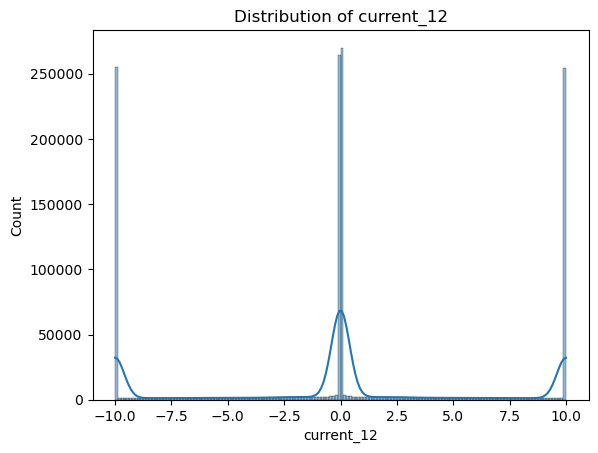

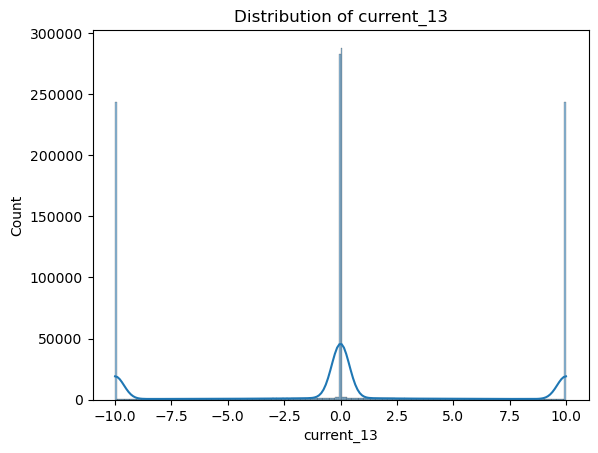

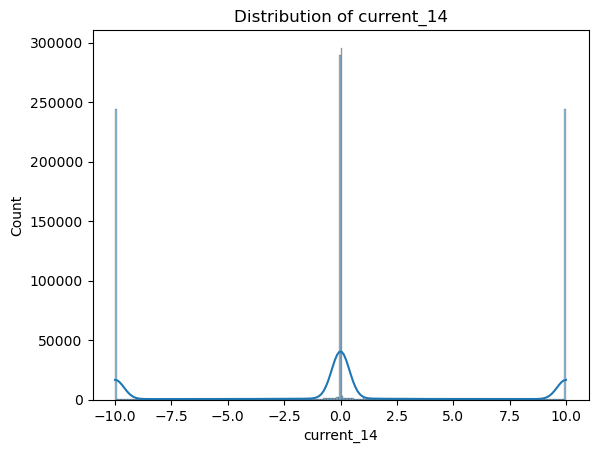

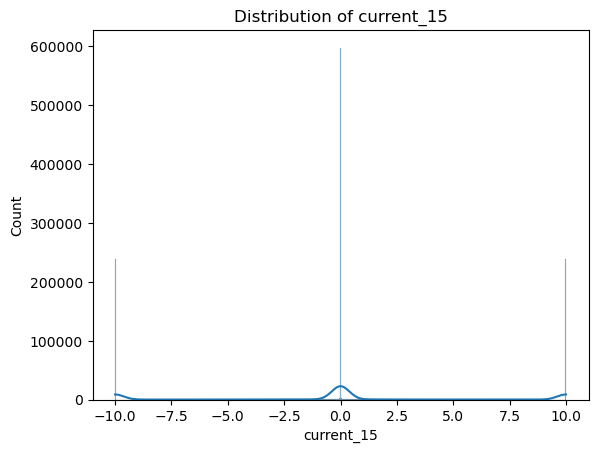

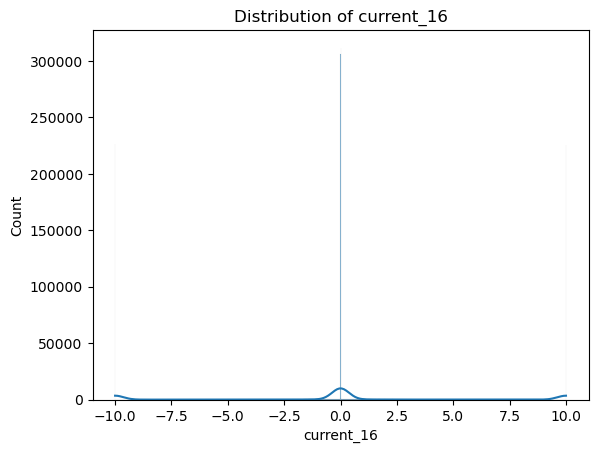

In [27]:
# Verify ranges and plot distributions of current columns
import seaborn as sns
import matplotlib.pyplot as plt

# Filter to current columns still present
valid_current_cols = [c for c in current_cols if c in df.columns]

# Ranges
ranges = df[valid_current_cols].agg(['min', 'max'])
print(ranges)

# Distplot for each current column
for col in valid_current_cols:
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()


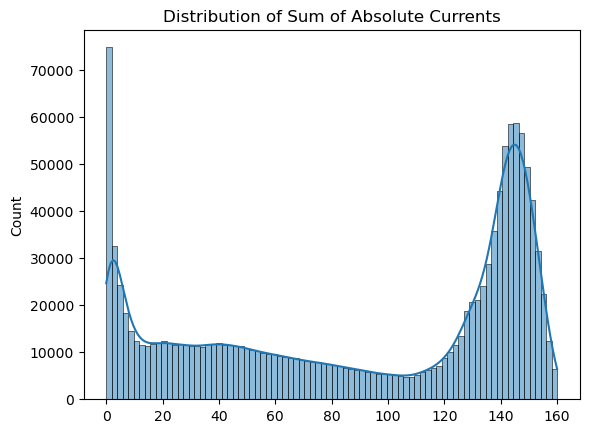

In [28]:
# Temporary: sum of absolute currents + distribution plot
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

valid_current_cols = [c for c in current_cols if c in df.columns]
abs_sum_currents = np.abs(df[valid_current_cols]).sum(axis=1)

# Distribution plot
sns.histplot(abs_sum_currents, kde=True)
plt.title("Distribution of Sum of Absolute Currents")
plt.show()


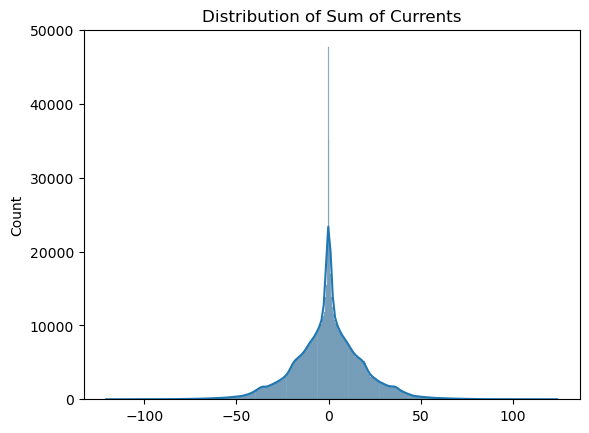

In [29]:
# Temporary: sum of absolute currents + distribution plot
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

valid_current_cols = [c for c in current_cols if c in df.columns]
abs_sum_currents = df[valid_current_cols].sum(axis=1)

# Distribution plot
sns.histplot(abs_sum_currents, kde=True)
plt.title("Distribution of Sum of Currents")
plt.show()


# Input-Target Definition

In [74]:
# Define mid-values for bins
mid_values = {
    0: -8,   # Far Reverse
    1: -4,   # Mid Reverse
    2:  0,   # Off
    3:  4,   # Mid Forward
    4:  8    # Far Forward
}

# Replace class labels with mid-values
for c in current_cols:
    x = pd.to_numeric(df[c], errors="coerce")
    vals = pd.Series(index=x.index, dtype="float")

    vals[x < -eps2] = mid_values[0]
    vals[(x >= -eps2) & (x < -eps1)] = mid_values[1]
    vals[(x >= -eps1) & (x <= eps1)] = mid_values[2]
    vals[(x > eps1) & (x <= eps2)] = mid_values[3]
    vals[x > eps2] = mid_values[4]

    df[f"{c}_val"] = vals.astype(float)

# Drop original continuous currents if not needed
df.drop(columns=current_cols, inplace=True)

# Track new value columns
value_cols = sorted(
    [c for c in df.columns if c.startswith("current_") and c.endswith("_val")],
    key=lambda x: int(re.search(r"\d+", x).group())
)


KeyError: 'current_1'

## data balancing

In [30]:
import re

# Detect current columns
current_cols = sorted(
    [c for c in df.columns if c.startswith("current_") and re.search(r"\d+$", c)],
    key=lambda x: int(re.search(r"\d+", x).group())
)

# Deadband thresholds
eps1, eps2 = 2, 6

# Add class columns directly to df (no full copy)
for c in current_cols:
    x = pd.to_numeric(df[c], errors="coerce")
    cls = pd.Series(index=x.index, dtype="Int64")
    cls[x < -eps2] = 0
    cls[(x >= -eps2) & (x < -eps1)] = 1
    cls[(x >= -eps1) & (x <= eps1)] = 2
    cls[(x >  eps1) & (x <= eps2)] = 3
    cls[x >  eps2] = 4
    df[f"{c}_cls"] = cls.astype(int)

# Drop continuous current cols if you don’t need them anymore
df.drop(columns=current_cols, inplace=True)

# Track class columns
class_cols = sorted(
    [c for c in df.columns if c.startswith("current_") and c.endswith("_cls")],
    key=lambda x: int(re.search(r"\d+", x).group())
)



In [31]:
df.head()

,X,Y,Z,wrench_Fx,wrench_Fy,wrench_Fz,wrench_Tx,wrench_Ty,wrench_Tz,angle_1_sin,...,current_7_cls,current_8_cls,current_9_cls,current_10_cls,current_11_cls,current_12_cls,current_13_cls,current_14_cls,current_15_cls,current_16_cls
0,-0.150000,-0.15,0.005,1.0,0.0,0.0,0.0,0.0,0.0,-0.001523,...,0,1,0,4,4,0,4,0,4,4
1,-0.140625,-0.15,0.005,1.0,0.0,0.0,0.0,0.0,0.0,-0.001523,...,0,0,0,4,3,0,4,0,3,4
2,-0.131250,-0.15,0.005,1.0,0.0,0.0,0.0,0.0,0.0,-0.001523,...,4,4,1,4,2,2,2,2,2,3
3,-0.121875,-0.15,0.005,1.0,0.0,0.0,0.0,0.0,0.0,-0.001523,...,0,0,0,4,4,2,4,1,0,3
4,-0.112500,-0.15,0.005,1.0,0.0,0.0,0.0,0.0,0.0,-0.001523,...,2,1,0,4,4,0,4,0,3,4


In [32]:
import numpy as np

def oversample_mid_per_coil(df_in, class_cols, mid_classes=(1, 3), ratio=0.9, random_state=42):
    """
    For each coil class column, oversample rows of the mid classes (1,3)
    up to target = ratio * (max class count for that coil). Keeps all original rows.
    Returns a shuffled concatenated DataFrame.
    """
    rng = np.random.default_rng(random_state)
    extras = []

    for ccol in class_cols:
        counts = df_in[ccol].value_counts(dropna=False)
        majority = int(counts.max()) if len(counts) else 0
        target = int(ratio * majority)

        for m in mid_classes:
            n = int(counts.get(m, 0))
            need = max(0, target - n)
            if need > 0:
                pool = df_in[df_in[ccol] == m]
                if not pool.empty:
                    take_idx = rng.choice(pool.index.to_numpy(), size=need, replace=True)
                    extras.append(df_in.loc[take_idx])

    if extras:
        df_out = pd.concat([df_in] + extras, axis=0, ignore_index=True)
        df_out = df_out.sample(frac=1.0, random_state=random_state).reset_index(drop=True)
    else:
        df_out = df_in.copy()

    return df_out

# === CALL ===
df_bal = oversample_mid_per_coil(df_cls, class_cols, mid_classes=(1, 3), ratio=0.9, random_state=42)

# Quick sanity check: show per-coil counts (optional peek)
{c: df_bal[c].value_counts().to_dict() for c in class_cols[:3]}


NameError: name 'df_cls' is not defined

## Previous

In [30]:
df.columns

Index(['X', 'Y', 'Z', 'wrench_Fx', 'wrench_Fy', 'wrench_Fz', 'wrench_Tx',
       'wrench_Ty', 'wrench_Tz', 'current_1', 'current_2', 'current_3',
       'current_4', 'current_5', 'current_6', 'current_7', 'current_8',
       'current_9', 'current_10', 'current_11', 'current_12', 'current_13',
       'current_14', 'current_15', 'current_16', 'angle_1_sin', 'angle_1_cos',
       'angle_2_sin', 'angle_2_cos', 'angle_3_sin', 'angle_3_cos', 'r_xyz',
       'sin_w1_s45', 'cos_w1_s45', 'sin_w1_s135', 'cos_w1_s135', 'bias', 's45',
       's135', 'sin_w2_s45', 'cos_w2_s45', 'sin_w2_s135', 'cos_w2_s135'],
      dtype='object')

In [30]:
df = df.sample(frac=1, random_state=42).reset_index(drop=True)


In [31]:
# Build input/target blocks for the "Gamma^{-1}(features) @ W -> I" setup

import re
import pandas as pd

# 1) Define canonical column sets
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]

# Current cols in numeric order
current_cols = sorted(
    [c for c in df.columns if c.startswith("current_")],
    key=lambda x: int(re.search(r"\d+", x).group())
)

# 2) Feature columns: everything that's not a wrench or current
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

# 3) Build frames (no mutation of df)
X_feat = df.loc[:, feature_cols].apply(pd.to_numeric).copy()
W = df.loc[:, WRENCH_COLS].apply(pd.to_numeric, errors="coerce").copy()
I = df.loc[:, current_cols].apply(pd.to_numeric, errors="coerce").copy()




In [33]:
X_feat.describe()

,X,Y,Z,angle_1_sin,angle_1_cos,angle_2_sin,angle_2_cos,angle_3_sin,angle_3_cos,r_xyz,...,cos_w1_s45,sin_w1_s135,cos_w1_s135,bias,s45,s135,sin_w2_s45,cos_w2_s45,sin_w2_s135,cos_w2_s135
count,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,...,1.287658e+06,1.287658e+06,1.287658e+06,1287658.0,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06
mean,2.101927e-05,-9.624304e-05,5.000000e-03,-1.019840e-05,9.999992e-01,6.368382e-06,9.999992e-01,-3.927008e-06,9.993820e-01,1.182911e-01,...,4.844322e-05,8.421903e-05,8.283367e-05,1.0,8.291697e-05,-5.319124e-05,2.150546e-04,-4.751743e-04,3.131855e-04,2.690876e-04
std,8.917721e-02,8.914123e-02,3.469448e-18,1.235443e-03,5.502319e-07,1.236135e-03,5.499570e-07,3.514757e-02,5.430675e-04,4.394266e-02,...,7.069386e-01,7.071163e-01,7.070979e-01,0.0,8.915681e-02,8.916163e-02,7.070258e-01,7.071881e-01,7.070376e-01,7.071764e-01
min,-1.500000e-01,-1.500000e-01,5.000000e-03,-1.523087e-03,9.999988e-01,-1.523087e-03,9.999988e-01,-5.480367e-02,9.984971e-01,5.000000e-03,...,-9.612389e-01,-9.907880e-01,-9.612389e-01,1.0,-2.121320e-01,-2.121320e-01,-9.998889e-01,-9.962988e-01,-9.998889e-01,-9.962988e-01
25%,-7.500000e-02,-7.500000e-02,5.000000e-03,-1.523087e-03,9.999988e-01,-1.523087e-03,9.999988e-01,-2.741213e-02,9.991546e-01,8.657773e-02,...,-6.555618e-01,-7.534661e-01,-6.555618e-01,1.0,-6.629126e-02,-6.629126e-02,-7.018171e-01,-6.705229e-01,-7.018171e-01,-6.705229e-01
50%,0.000000e+00,0.000000e+00,5.000000e-03,0.000000e+00,9.999988e-01,0.000000e+00,9.999988e-01,0.000000e+00,9.996242e-01,1.223373e-01,...,-1.404775e-01,0.000000e+00,-1.404775e-01,1.0,0.000000e+00,0.000000e+00,0.000000e+00,-4.301852e-02,0.000000e+00,-4.301852e-02
75%,7.500000e-02,7.500000e-02,5.000000e-03,1.523087e-03,1.000000e+00,1.523087e-03,1.000000e+00,2.741213e-02,9.999060e-01,1.512500e-01,...,8.397451e-01,7.534661e-01,8.397451e-01,1.0,6.629126e-02,6.629126e-02,7.018171e-01,7.700470e-01,7.018171e-01,7.700470e-01
max,1.500000e-01,1.500000e-01,5.000000e-03,1.523087e-03,1.000000e+00,1.523087e-03,1.000000e+00,5.480367e-02,1.000000e+00,2.121910e-01,...,1.000000e+00,9.907880e-01,1.000000e+00,1.0,2.121320e-01,2.121320e-01,9.998889e-01,1.000000e+00,9.998889e-01,1.000000e+00


In [34]:
W.describe()

,wrench_Fx,wrench_Fy,wrench_Fz,wrench_Tx,wrench_Ty,wrench_Tz
count,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06
mean,-3.588283e+00,4.353786e+00,1.054874e+01,-1.138089e+00,5.140336e-02,1.717521e+00
std,1.326432e+01,1.491032e+01,4.046822e+01,3.094458e+00,2.415097e+00,2.660243e+00
min,-3.111482e+01,-1.877068e+01,-7.132306e+01,-8.784565e+00,-4.956699e+00,-2.565989e+00
25%,-8.912334e+00,0.000000e+00,0.000000e+00,-2.517007e+00,-4.233964e-02,0.000000e+00
50%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.427414e-02
75%,0.000000e+00,1.633448e+01,5.074172e+01,6.004669e-01,1.000000e+00,3.140987e+00
max,2.519888e+01,4.176926e+01,6.791095e+01,3.060779e+00,4.450079e+00,7.497163e+00


In [35]:
I.describe()

,current_1,current_2,current_3,current_4,current_5,current_6,current_7,current_8,current_9,current_10,current_11,current_12,current_13,current_14,current_15,current_16
count,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06
mean,-1.363491e-02,-4.005976e-03,-9.721311e-03,-6.405448e-03,-1.913089e-03,7.643466e-03,6.663060e-03,-3.698598e-03,3.674838e-04,5.529176e-04,7.847217e-03,-4.474751e-03,-1.110435e-03,-2.037147e-03,-4.716866e-03,-4.390712e-03
std,7.754680e+00,8.070662e+00,7.904775e+00,7.569230e+00,7.876455e+00,8.056786e+00,7.742967e+00,7.334417e+00,7.119082e+00,7.097665e+00,6.900556e+00,6.681077e+00,6.507181e+00,6.519975e+00,6.425603e+00,6.260852e+00
min,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01
25%,-9.999810e+00,-1.000000e+01,-9.999997e+00,-9.565709e+00,-9.999994e+00,-1.000000e+01,-9.999996e+00,-8.347975e+00,-6.797068e+00,-6.705540e+00,-4.963749e+00,-3.434121e+00,-2.072660e+00,-1.812129e+00,-9.947497e-01,-4.141004e-01
50%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,9.999524e+00,9.999999e+00,9.999997e+00,9.514990e+00,9.999994e+00,1.000000e+01,9.999996e+00,8.296010e+00,6.770985e+00,6.712163e+00,5.036799e+00,3.381108e+00,2.055374e+00,1.774930e+00,9.386791e-01,3.835209e-01
max,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01


In [44]:
import numpy as np
import pandas as pd

# Deadband threshold (adjust as needed)
eps = 1

# Convert to class matrix
I_class = pd.DataFrame(index=I.index, columns=I.columns)
I_class[I < -eps] = 0   # Reverse
I_class[(I >= -eps) & (I <= eps)] = 1  # Off
I_class[I > eps] = 2   # Forward

I_class = I_class.astype(int)


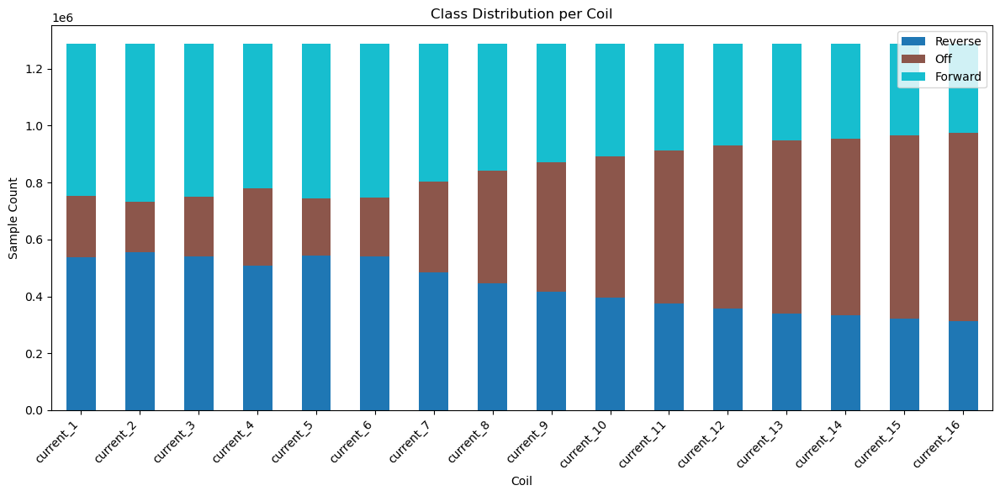

In [45]:
import matplotlib.pyplot as plt

counts = I_class.apply(pd.Series.value_counts).T.fillna(0).astype(int)
counts.columns = ["Reverse", "Off", "Forward"]

ax = counts.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="tab10")
ax.set_ylabel("Sample Count")
ax.set_xlabel("Coil")
ax.set_title("Class Distribution per Coil")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [32]:
# Deadband thresholds
eps1 = 2
eps2 = 6

I_class = pd.DataFrame(index=I.index, columns=I.columns)

# Far reverse
I_class[I < -eps2] = 0
# Mid reverse
I_class[(I >= -eps2) & (I < -eps1)] = 1
# Off (deadband)
I_class[(I >= -eps1) & (I <= eps1)] = 2
# Mid forward
I_class[(I > eps1) & (I <= eps2)] = 3
# Far forward
I_class[I > eps2] = 4

I_class = I_class.astype(int)


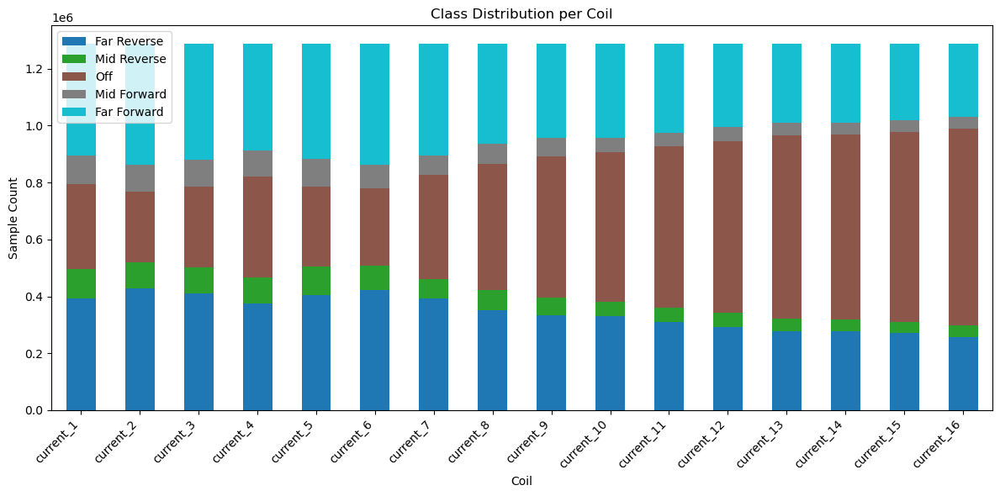

In [33]:
import matplotlib.pyplot as plt

counts = I_class.apply(pd.Series.value_counts).T.fillna(0).astype(int)
counts = counts.sort_index(axis=1)  # ensure columns in order 0→4

# Map class IDs to names
class_labels = {
    0: "Far Reverse",
    1: "Mid Reverse",
    2: "Off",
    3: "Mid Forward",
    4: "Far Forward"
}
counts.columns = [class_labels[c] for c in counts.columns]

ax = counts.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="tab10")
ax.set_ylabel("Sample Count")
ax.set_xlabel("Coil")
ax.set_title("Class Distribution per Coil")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


In [36]:
# Pick which coil to color by (0-based)
COIL_ID = 12

from sklearn.preprocessing import StandardScaler
import numpy as np

# Build input space: concatenate features and wrench
X_in = X_feat.values

# Standardize for PCA/t-SNE/UMAP
scaler = StandardScaler()
X_std = scaler.fit_transform(X_in)

# Labels for chosen coil
coil_name = I_class.columns[COIL_ID]
y = I_class[coil_name].to_numpy()

# Class names for legend
class_names = {
    0: "Far Reverse",
    1: "Mid Reverse",
    2: "Off",
    3: "Mid Forward",
    4: "Far Forward"
}


/tmp/ipykernel_19513/4037688976.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/alireza-linux/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


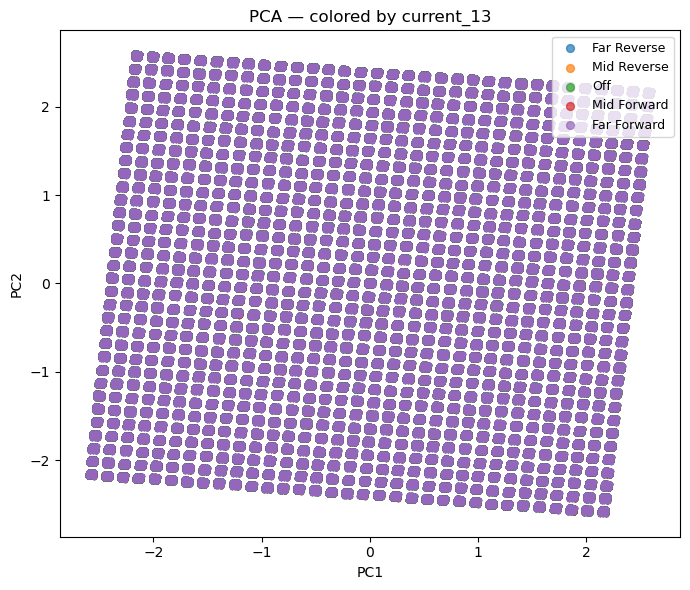

In [37]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=42)
Z_pca = pca.fit_transform(X_std)

plt.figure(figsize=(7,6))
for k in sorted(np.unique(y)):
    mask = (y == k)
    plt.scatter(Z_pca[mask,0], Z_pca[mask,1], s=8, label=class_names.get(k, str(k)), alpha=0.7)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title(f"PCA — colored by {coil_name}")
plt.legend(markerscale=2, fontsize=9)
plt.tight_layout()
plt.show()


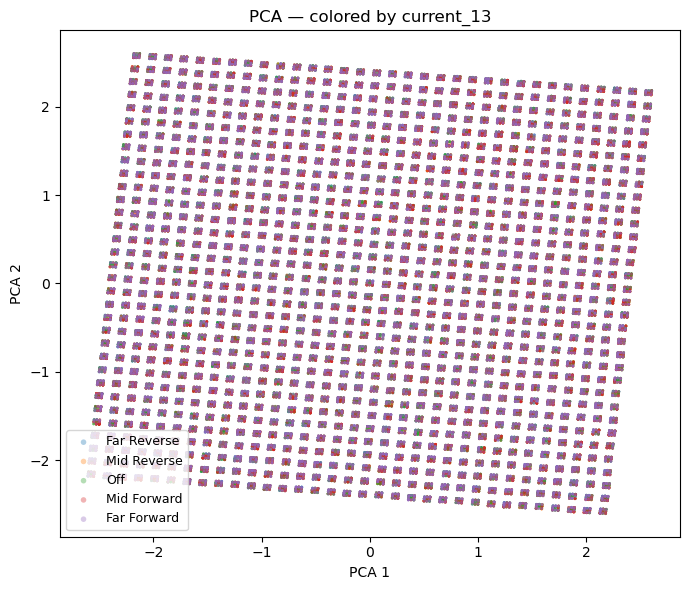

NameError: name 'Z_tsne' is not defined

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# helper: cleaner scatter for huge datasets
def plot_embed(Z, y, title, class_names, per_class=30000):
    """
    Z: (n,2) embedding
    y: (n,) int labels
    per_class: max points per class for plotting (stratified). Set None to plot all.
    """
    uniq = np.sort(np.unique(y))
    idx_all = []
    rng = np.random.default_rng(42)
    for k in uniq:
        idx_k = np.where(y == k)[0]
        if per_class is not None and len(idx_k) > per_class:
            idx_k = rng.choice(idx_k, size=per_class, replace=False)
        idx_all.append(idx_k)
    idx = np.concatenate(idx_all)

    Zp, yp = Z[idx], y[idx]

    # plot majority first, minority last so small classes stay visible
    order = sorted(np.unique(yp), key=lambda k: np.sum(yp == k), reverse=True)

    plt.figure(figsize=(7, 6))
    for k in order:
        m = (yp == k)
        plt.scatter(
            Zp[m, 0], Zp[m, 1],
            s=4, alpha=0.35, edgecolors="none", linewidths=0, rasterized=True,
            label=class_names.get(k, str(k))
        )
    plt.title(title)
    plt.xlabel(title.split("—")[0].strip() + " 1")
    plt.ylabel(title.split("—")[0].strip() + " 2")
    plt.legend(markerscale=2, fontsize=9, frameon=True)
    plt.tight_layout()
    plt.show()

# === CALLS ===
plot_embed(Z_pca,  y, f"PCA — colored by {coil_name}",  class_names, per_class=30000)



In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, learning_rate="auto", init="pca", random_state=42)
Z_tsne = tsne.fit_transform(X_std)

plt.figure(figsize=(7,6))
for k in sorted(np.unique(y)):
    mask = (y == k)
    plt.scatter(Z_tsne[mask,0], Z_tsne[mask,1], s=8, label=class_names.get(k, str(k)), alpha=0.7)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title(f"t-SNE — colored by {coil_name}")
plt.legend(markerscale=2, fontsize=9)
plt.tight_layout()
plt.show()


/home/alireza-linux/.local/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/tmp/ipykernel_19513/2029351190.py:17: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/alireza-linux/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


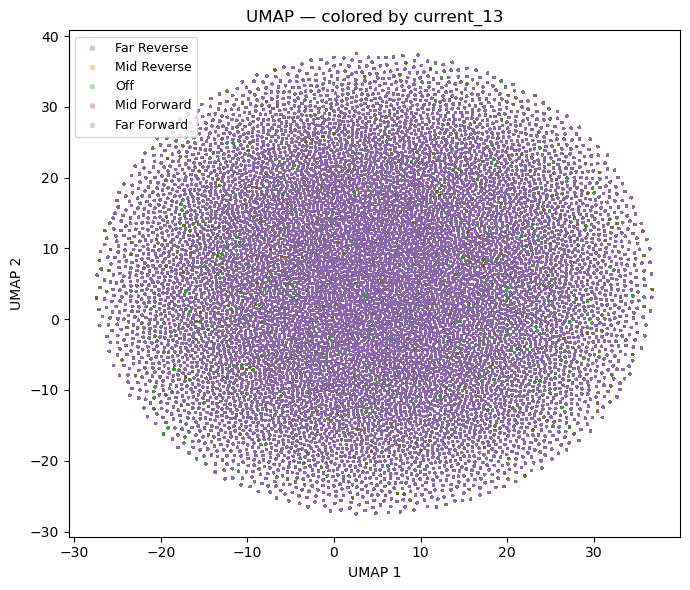

In [45]:
import umap.umap_ as umap

um = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.1,
          metric="euclidean", random_state=42)
Z_umap = um.fit_transform(X_std)

plt.figure(figsize=(7,6))
for k in sorted(np.unique(y)):
    mask = (y == k)
    plt.scatter(Z_umap[mask, 0], Z_umap[mask, 1],
                s=4, alpha=0.35, edgecolors="none",
                label=class_names.get(k, str(k)))
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.title(f"UMAP — colored by {coil_name}")
plt.legend(markerscale=2, fontsize=9)
plt.tight_layout()
plt.show()



In [46]:
COIL_ID = 12  # 0-based; change as needed
coil_name = I_class.columns[COIL_ID]
y = I_class[coil_name].to_numpy()

vals, cnts = np.unique(y, return_counts=True)
total = cnts.sum()
print(coil_name, dict(zip(vals, cnts)))
print("majority share:", cnts.max() / total)


current_13 {0: 276895, 1: 46024, 2: 642048, 3: 46017, 4: 276674}
majority share: 0.49861686876484285


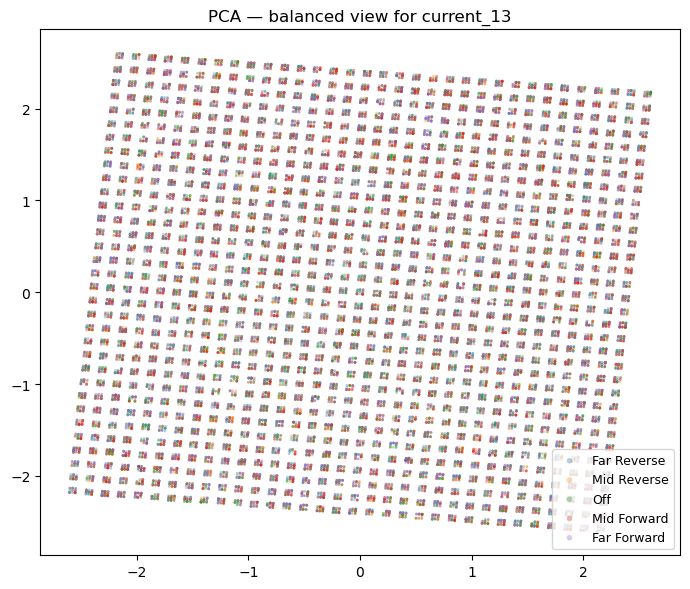

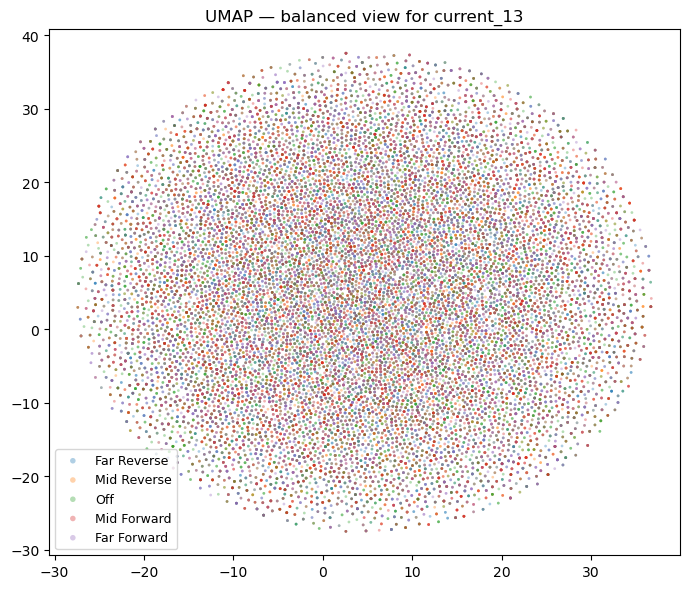

In [47]:
# pick equal samples per class for visualization
per_class = 8000  # drop if too slow
rng = np.random.default_rng(42)
keep_idx = []
for k in np.unique(y):
    idx = np.where(y == k)[0]
    take = idx if len(idx) <= per_class else rng.choice(idx, per_class, replace=False)
    keep_idx.append(take)
keep_idx = np.concatenate(keep_idx)

# subset embeddings (assuming you already computed Z_pca, Z_umap)
Zp_pca  = Z_pca[keep_idx]
Zp_umap = Z_umap[keep_idx]
yp      = y[keep_idx]

labels = {0:"Far Reverse",1:"Mid Reverse",2:"Off",3:"Mid Forward",4:"Far Forward"}

def quick_scatter(Z, y, title):
    plt.figure(figsize=(7,6))
    for k in sorted(np.unique(y)):
        m = (y == k)
        plt.scatter(Z[m,0], Z[m,1], s=4, alpha=0.35, edgecolors="none", label=labels[k], rasterized=True)
    plt.title(title); plt.legend(markerscale=2, fontsize=9)
    plt.tight_layout(); plt.show()

quick_scatter(Zp_pca,  yp, f"PCA — balanced view for {coil_name}")
quick_scatter(Zp_umap, yp, f"UMAP — balanced view for {coil_name}")


In [50]:
# Oversample rare classes to be nearly balanced (match the largest minority, keep majority as-is)
# y_tr can be int labels (0..4) or one-hot; returns oversampled X_tr/W_tr/Y_tr

import numpy as np

def oversample_near_balance(X_tr, W_tr, Y_tr, n_classes=5, random_state=42):
    rng = np.random.default_rng(random_state)
    y_int = np.argmax(Y_tr, axis=1) if Y_tr.ndim == 2 else Y_tr

    counts = np.bincount(y_int, minlength=n_classes)
    majority = counts.argmax()
    target = counts[np.arange(n_classes) != majority].max()  # largest minority size

    idx_chunks = []
    for c in range(n_classes):
        c_idx = np.where(y_int == c)[0]
        if c == majority:
            idx_chunks.append(c_idx)  # no undersampling
        else:
            need = target - len(c_idx)
            if need > 0:
                extra = rng.choice(c_idx, size=need, replace=True)
                c_idx = np.concatenate([c_idx, extra])
            idx_chunks.append(c_idx)

    new_idx = np.concatenate(idx_chunks)
    rng.shuffle(new_idx)

    X_os = X_tr[new_idx]
    W_os = W_tr[new_idx] if W_tr is not None else None
    Y_os = (np.eye(n_classes)[y_int[new_idx]] if Y_tr.ndim == 1 else Y_tr[new_idx])
    return X_os, W_os, Y_os


In [ ]:
X_tr_os, W_tr_os, Y_tr_os = oversample_near_balance(X_tr, W_tr, Y_tr, n_classes=5)


In [55]:
I.describe()

,current_1,current_2,current_3,current_4,current_5,current_6,current_7,current_8,current_9,current_10,current_11,current_12,current_13,current_14,current_15,current_16
count,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06,1.287658e+06
mean,-1.363491e-02,-4.005976e-03,-9.721311e-03,-6.405448e-03,-1.913089e-03,7.643466e-03,6.663060e-03,-3.698598e-03,3.674838e-04,5.529176e-04,7.847217e-03,-4.474751e-03,-1.110435e-03,-2.037147e-03,-4.716866e-03,-4.390712e-03
std,7.754680e+00,8.070662e+00,7.904775e+00,7.569230e+00,7.876455e+00,8.056786e+00,7.742967e+00,7.334417e+00,7.119082e+00,7.097665e+00,6.900556e+00,6.681077e+00,6.507181e+00,6.519975e+00,6.425603e+00,6.260852e+00
min,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01,-1.000000e+01
25%,-9.999810e+00,-1.000000e+01,-9.999997e+00,-9.565709e+00,-9.999994e+00,-1.000000e+01,-9.999996e+00,-8.347975e+00,-6.797068e+00,-6.705540e+00,-4.963749e+00,-3.434121e+00,-2.072660e+00,-1.812129e+00,-9.947497e-01,-4.141004e-01
50%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,9.999524e+00,9.999999e+00,9.999997e+00,9.514990e+00,9.999994e+00,1.000000e+01,9.999996e+00,8.296010e+00,6.770985e+00,6.712163e+00,5.036799e+00,3.381108e+00,2.055374e+00,1.774930e+00,9.386791e-01,3.835209e-01
max,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01,1.000000e+01


# Classification Model

## Multi Coil Model

In [33]:
import re
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Wrench columns
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]

# Current class cols
class_cols = sorted(
    [c for c in df.columns if c.startswith("current_") and c.endswith("_cls")],
    key=lambda x: int(re.search(r"\d+", x).group())
)

# Features = wrenches + positions (exclude class cols)
exclude = set(WRENCH_COLS + class_cols)
feature_cols = [c for c in df.columns if c not in exclude]

X_in = df[WRENCH_COLS + feature_cols].to_numpy(dtype=np.float32)
Y_out = [df[c].to_numpy(dtype=np.int32) for c in class_cols]  # list of 16 arrays

# Standardize inputs
scaler = StandardScaler()
X_in = scaler.fit_transform(X_in)

# Train/test split
X_tr, X_te, Y_tr, Y_te = train_test_split(X_in, list(zip(*Y_out)), test_size=0.2, random_state=42, shuffle=True)

# zip(*Y_out) turned the list-of-arrays into list-of-tuples; split back per coil
Y_tr = [np.array([row[i] for row in Y_tr]) for i in range(len(class_cols))]
Y_te = [np.array([row[i] for row in Y_te]) for i in range(len(class_cols))]


In [36]:
import tensorflow as tf
from tensorflow.keras import layers, Model

inputs = layers.Input(shape=(X_tr.shape[1],), name="features")

x = layers.Dense(128, activation="relu")(inputs)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.3)(x)

# 16 outputs, each 5-class softmax
outputs = []
for i, cname in enumerate(class_cols):
    out = layers.Dense(5, activation="softmax", name=f"{cname}_out")(x)
    outputs.append(out)

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss=["sparse_categorical_crossentropy"] * len(outputs),
    metrics=[["accuracy"]] * len(outputs)   # wrap it in another list
)


model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ features            │ (None, 27)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 128)       │      3,584 │ features[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 128)       │     16,512 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_1_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_2_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_3_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_4_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_5_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_6_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_7_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_8_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_9_cls_out   │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_10_cls_out  │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_11_cls_out  │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_12_cls_out  │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_13_cls_out  │ (None, 5)         │        645 │ dropout_1[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ current_14_cls_out  │ (None, 5)         │        645 │ dropout_1[0][0] 

 Total params: 30,416 (118.81 KB)

 Trainable params: 30,416 (118.81 KB)

 Non-trainable params: 0 (0.00 B)

In [37]:
history = model.fit(
    X_tr, Y_tr,
    validation_data=(X_te, Y_te),
    epochs=20,
    batch_size=256,
    verbose=2
)


Epoch 1/20


I0000 00:00:1755347449.872282    6679 service.cc:152] XLA service 0x76071c00ad40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1755347449.872297    6679 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2025-08-16 16:00:49.954586: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1755347450.367035    6679 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-08-16 16:00:51.017309: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_935', 8 bytes spill stores, 8 bytes spill loads

2025-08-16 16:00:51.147705: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_d

4024/4024 - 31s - 8ms/step - current_10_cls_out_accuracy: 0.5618 - current_10_cls_out_loss: 1.0119 - current_11_cls_out_accuracy: 0.5807 - current_11_cls_out_loss: 0.9816 - current_12_cls_out_accuracy: 0.5979 - current_12_cls_out_loss: 0.9525 - current_13_cls_out_accuracy: 0.6204 - current_13_cls_out_loss: 0.9118 - current_14_cls_out_accuracy: 0.6249 - current_14_cls_out_loss: 0.8919 - current_15_cls_out_accuracy: 0.6343 - current_15_cls_out_loss: 0.8683 - current_16_cls_out_accuracy: 0.6441 - current_16_cls_out_loss: 0.8589 - current_1_cls_out_accuracy: 0.4509 - current_1_cls_out_loss: 1.2328 - current_2_cls_out_accuracy: 0.4403 - current_2_cls_out_loss: 1.2299 - current_3_cls_out_accuracy: 0.4491 - current_3_cls_out_loss: 1.2251 - current_4_cls_out_accuracy: 0.4687 - current_4_cls_out_loss: 1.2029 - current_5_cls_out_accuracy: 0.4432 - current_5_cls_out_loss: 1.2428 - current_6_cls_out_accuracy: 0.4487 - current_6_cls_out_loss: 1.2213 - current_7_cls_out_accuracy: 0.4888 - current_7_

In [38]:
import numpy as np

# Get predictions
Y_pred = model.predict(X_te, batch_size=512, verbose=1)

# Convert to int class labels
Y_pred_int = [np.argmax(yhat, axis=1) for yhat in Y_pred]


2025-08-16 16:06:09.885802: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-08-16 16:06:09.980773: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 128 bytes spill stores, 128 bytes spill loads

2025-08-16 16:06:10.551599: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 8 bytes spill stores, 8 bytes spill loads

2025-08-16 16:06:10.691152: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 104 bytes spill stores, 104 bytes spill loads



437/503 ━━━━━━━━━━━━━━━━━━━━ 0s 695us/step

2025-08-16 16:06:12.632419: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 164 bytes spill stores, 168 bytes spill loads

2025-08-16 16:06:12.708795: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 104 bytes spill stores, 116 bytes spill loads

2025-08-16 16:06:13.139060: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 152 bytes spill stores, 152 bytes spill loads

2025-08-16 16:06:13.147349: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_14', 124 bytes spill stores, 124 bytes spill loads

2025-08-16 16:06:13.234808: I external/l

503/503 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step


Coil: current_1_cls
              precision    recall  f1-score   support

 Far Reverse      0.503     0.744     0.600     78912
 Mid Reverse      0.385     0.006     0.012     20503
         Off      0.644     0.789     0.709     59395
 Mid Forward      0.441     0.007     0.013     20199
 Far Forward      0.556     0.478     0.514     78523

    accuracy                          0.557    257532
   macro avg      0.506     0.405     0.370    257532
weighted avg      0.538     0.557     0.506    257532



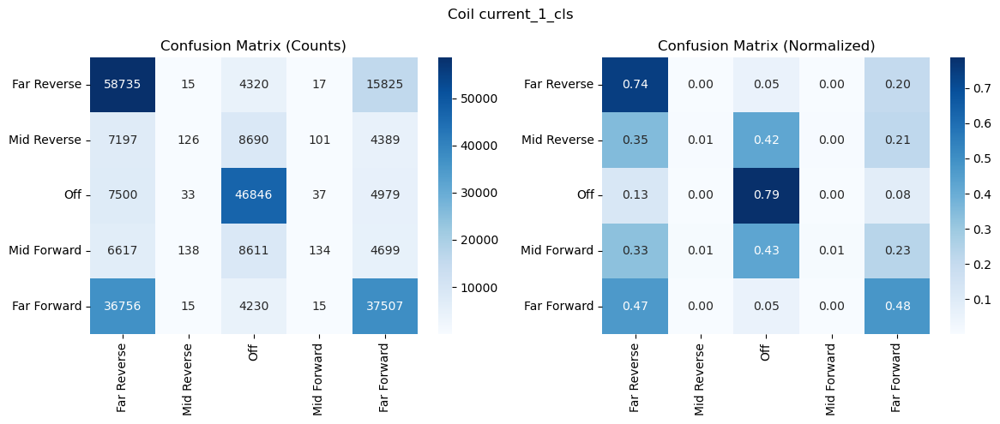

Coil: current_2_cls
              precision    recall  f1-score   support

 Far Reverse      0.477     0.600     0.532     85370
 Mid Reverse      0.462     0.000     0.001     18803
         Off      0.650     0.723     0.685     49337
 Mid Forward      0.198     0.001     0.002     18645
 Far Forward      0.530     0.592     0.559     85377

    accuracy                          0.534    257532
   macro avg      0.463     0.383     0.356    257532
weighted avg      0.507     0.534     0.493    257532



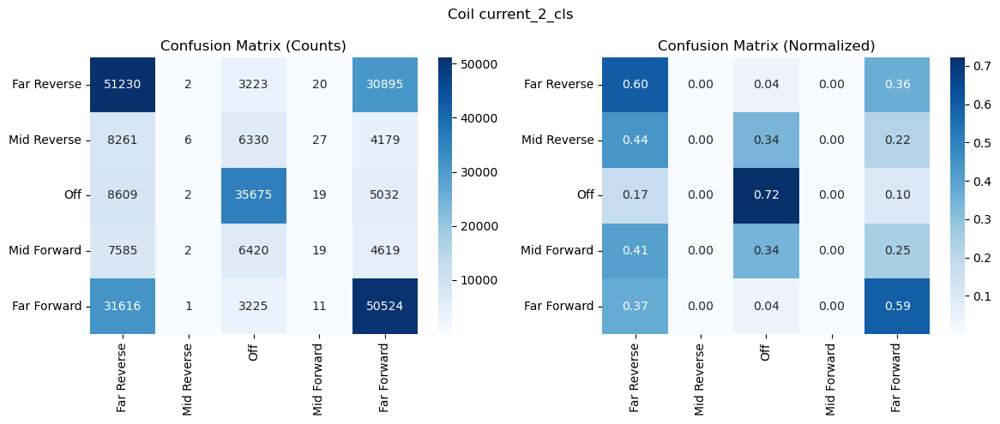

Coil: current_3_cls
              precision    recall  f1-score   support

 Far Reverse      0.505     0.575     0.538     81624
 Mid Reverse      0.727     0.000     0.001     18424
         Off      0.669     0.748     0.706     56858
 Mid Forward      0.800     0.001     0.002     18786
 Far Forward      0.501     0.617     0.553     81840

    accuracy                          0.544    257532
   macro avg      0.640     0.388     0.360    257532
weighted avg      0.577     0.544     0.502    257532



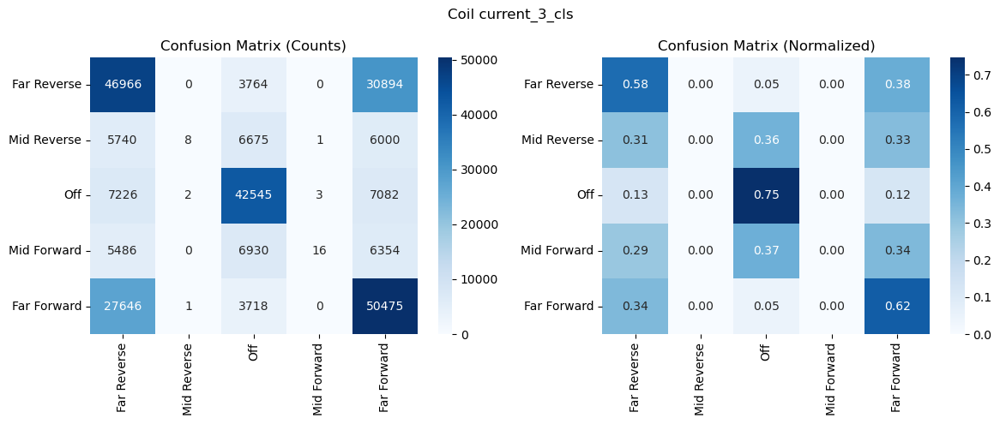

Coil: current_4_cls
              precision    recall  f1-score   support

 Far Reverse      0.485     0.787     0.600     75032
 Mid Reverse      0.333     0.000     0.000     18576
         Off      0.675     0.818     0.740     70362
 Mid Forward      1.000     0.000     0.000     18645
 Far Forward      0.620     0.418     0.499     74917

    accuracy                          0.574    257532
   macro avg      0.623     0.405     0.368    257532
weighted avg      0.602     0.574     0.522    257532



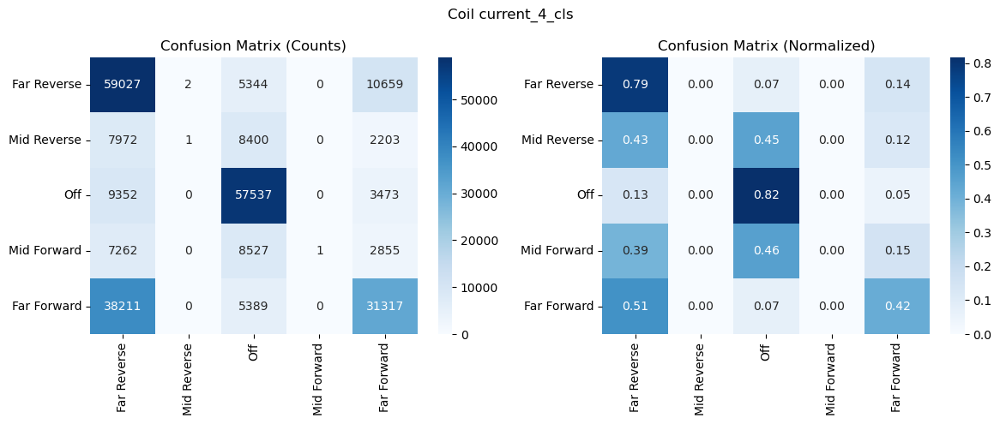

Coil: current_5_cls
              precision    recall  f1-score   support

 Far Reverse      0.473     0.668     0.554     81188
 Mid Reverse      0.000     0.000     0.000     19788
         Off      0.640     0.752     0.692     56044
 Mid Forward      0.125     0.000     0.001     19681
 Far Forward      0.542     0.517     0.529     80831

    accuracy                          0.537    257532
   macro avg      0.356     0.387     0.355    257532
weighted avg      0.468     0.537     0.491    257532



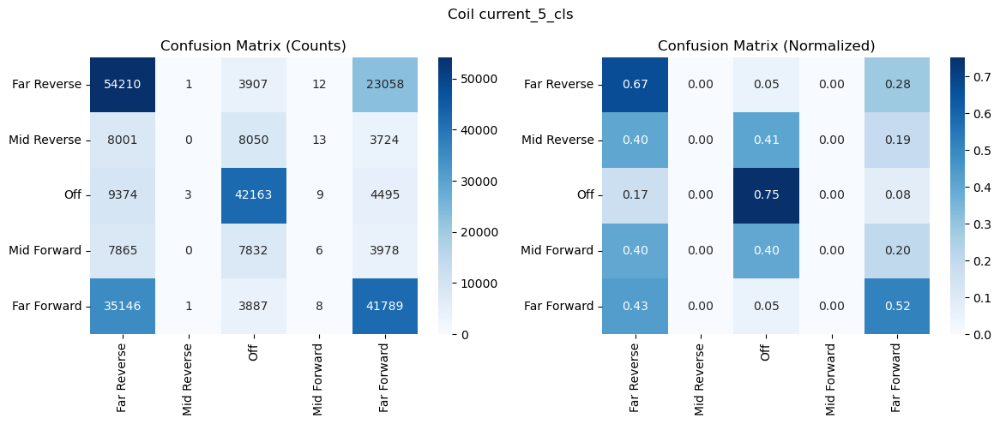

Coil: current_6_cls
              precision    recall  f1-score   support

 Far Reverse      0.518     0.549     0.533     84654
 Mid Reverse      0.120     0.001     0.001     16593
         Off      0.703     0.725     0.714     54647
 Mid Forward      0.264     0.007     0.014     16785
 Far Forward      0.500     0.654     0.567     84853

    accuracy                          0.550    257532
   macro avg      0.421     0.387     0.366    257532
weighted avg      0.509     0.550     0.514    257532



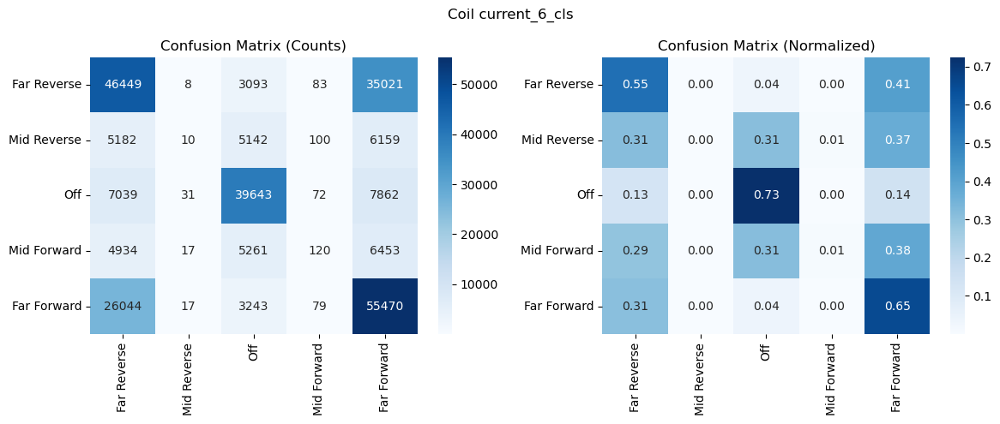

Coil: current_7_cls
              precision    recall  f1-score   support

 Far Reverse      0.499     0.588     0.540     78526
 Mid Reverse      0.000     0.000     0.000     13598
         Off      0.793     0.811     0.802     73288
 Mid Forward      0.000     0.000     0.000     13666
 Far Forward      0.527     0.605     0.563     78454

    accuracy                          0.594    257532
   macro avg      0.364     0.401     0.381    257532
weighted avg      0.538     0.594     0.564    257532



/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

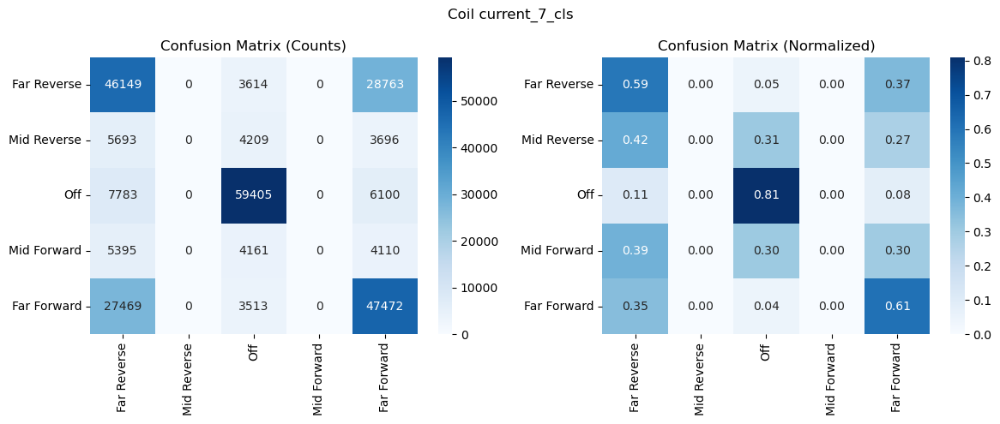

Coil: current_8_cls
              precision    recall  f1-score   support

 Far Reverse      0.502     0.627     0.558     70661
 Mid Reverse      0.000     0.000     0.000     13936
         Off      0.791     0.860     0.824     88442
 Mid Forward      0.000     0.000     0.000     14043
 Far Forward      0.527     0.547     0.537     70450

    accuracy                          0.617    257532
   macro avg      0.364     0.407     0.384    257532
weighted avg      0.554     0.617     0.583    257532



/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

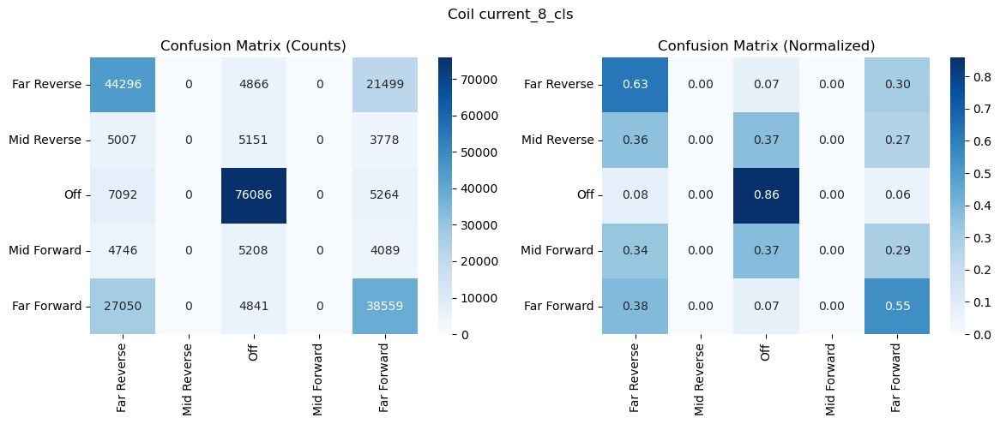

Coil: current_9_cls
              precision    recall  f1-score   support

 Far Reverse      0.531     0.534     0.533     66186
 Mid Reverse      0.600     0.000     0.001     12858
         Off      0.831     0.889     0.859     98854
 Mid Forward      0.900     0.001     0.001     12875
 Far Forward      0.531     0.678     0.596     66759

    accuracy                          0.654    257532
   macro avg      0.679     0.420     0.398    257532
weighted avg      0.668     0.654     0.621    257532



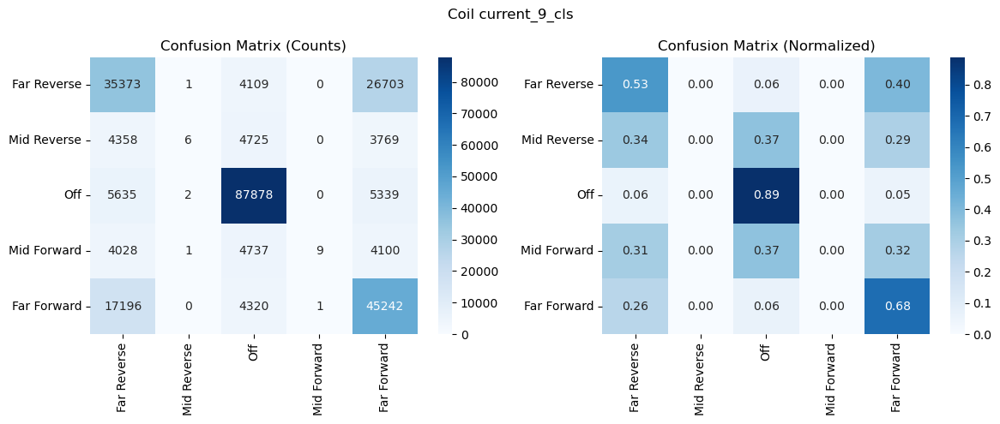

Coil: current_10_cls
              precision    recall  f1-score   support

 Far Reverse      0.526     0.704     0.602     65865
 Mid Reverse      0.000     0.000     0.000     10105
         Off      0.855     0.900     0.877    105363
 Mid Forward      0.000     0.000     0.000     10155
 Far Forward      0.570     0.505     0.536     66044

    accuracy                          0.678    257532
   macro avg      0.390     0.422     0.403    257532
weighted avg      0.631     0.678     0.650    257532



/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

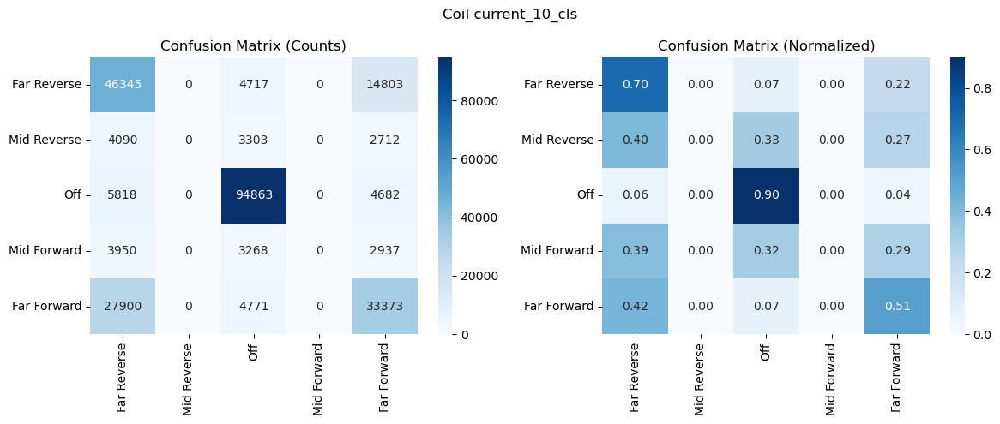

Coil: current_11_cls
              precision    recall  f1-score   support

 Far Reverse      0.538     0.624     0.578     62267
 Mid Reverse      0.333     0.000     0.000      9596
         Off      0.869     0.912     0.890    113384
 Mid Forward      0.000     0.000     0.000      9664
 Far Forward      0.572     0.605     0.588     62621

    accuracy                          0.700    257532
   macro avg      0.462     0.428     0.411    257532
weighted avg      0.664     0.700     0.675    257532



/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

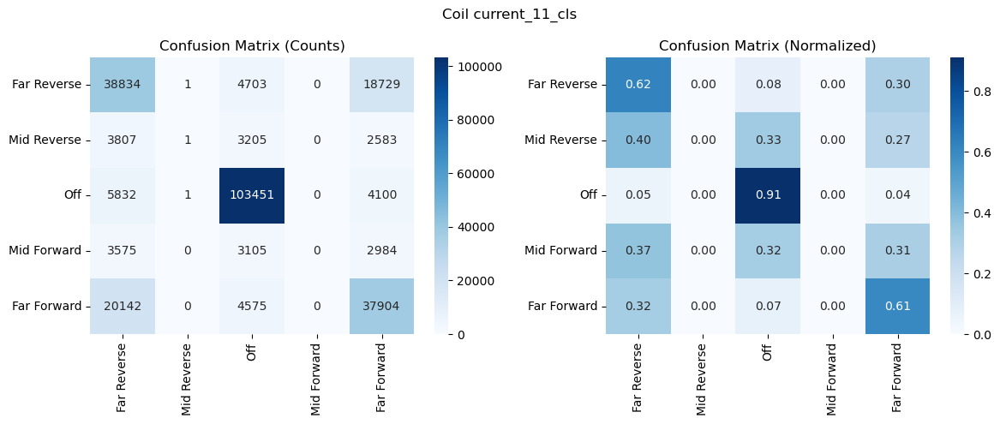

Coil: current_12_cls
              precision    recall  f1-score   support

 Far Reverse      0.559     0.578     0.568     58870
 Mid Reverse      0.486     0.002     0.003      9839
         Off      0.879     0.923     0.901    120330
 Mid Forward      0.378     0.001     0.003     10048
 Far Forward      0.547     0.659     0.598     58445

    accuracy                          0.713    257532
   macro avg      0.570     0.432     0.415    257532
weighted avg      0.696     0.713     0.687    257532



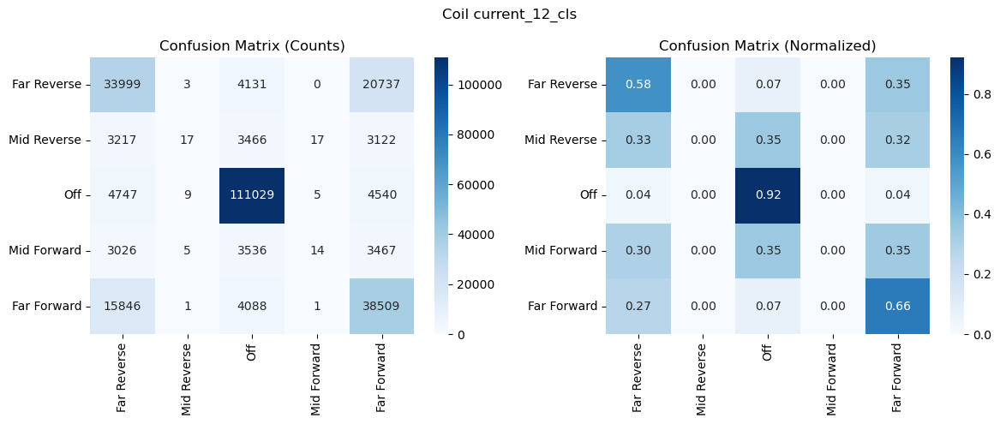

Coil: current_13_cls
              precision    recall  f1-score   support

 Far Reverse      0.578     0.674     0.622     55370
 Mid Reverse      0.000     0.000     0.000      9243
         Off      0.891     0.929     0.910    128327
 Mid Forward      0.000     0.000     0.000      9110
 Far Forward      0.573     0.610     0.591     55482

    accuracy                          0.739    257532
   macro avg      0.408     0.443     0.425    257532
weighted avg      0.692     0.739     0.714    257532



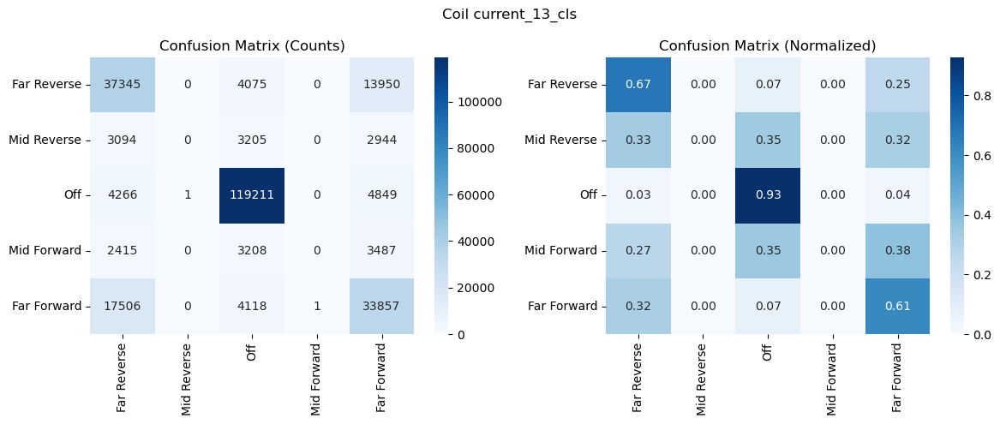

Coil: current_14_cls
              precision    recall  f1-score   support

 Far Reverse      0.551     0.620     0.583     55912
 Mid Reverse      0.000     0.000     0.000      8169
         Off      0.904     0.934     0.919    129581
 Mid Forward      0.000     0.000     0.000      8171
 Far Forward      0.570     0.621     0.594     55699

    accuracy                          0.739    257532
   macro avg      0.405     0.435     0.419    257532
weighted avg      0.698     0.739     0.718    257532



/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

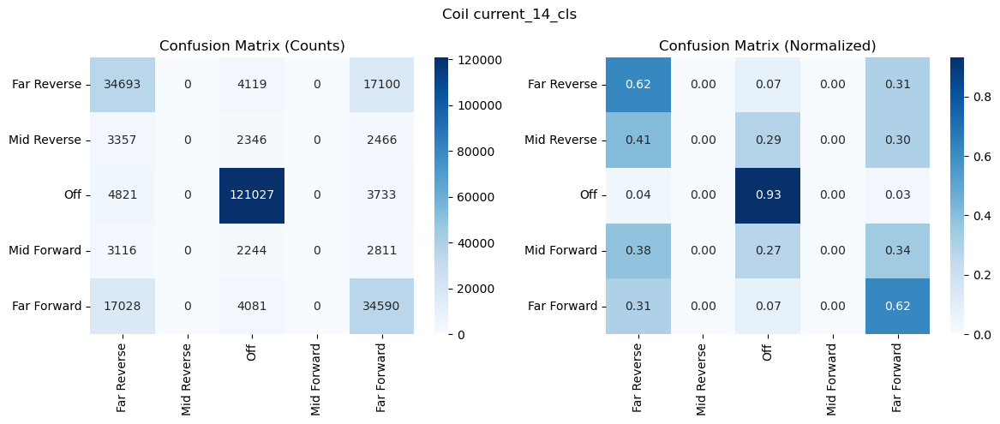

Coil: current_15_cls
              precision    recall  f1-score   support

 Far Reverse      0.560     0.687     0.617     54048
 Mid Reverse      0.000     0.000     0.000      8001
         Off      0.914     0.939     0.926    133533
 Mid Forward      0.429     0.000     0.001      7932
 Far Forward      0.599     0.600     0.600     54018

    accuracy                          0.757    257532
   macro avg      0.500     0.445     0.429    257532
weighted avg      0.730     0.757     0.736    257532



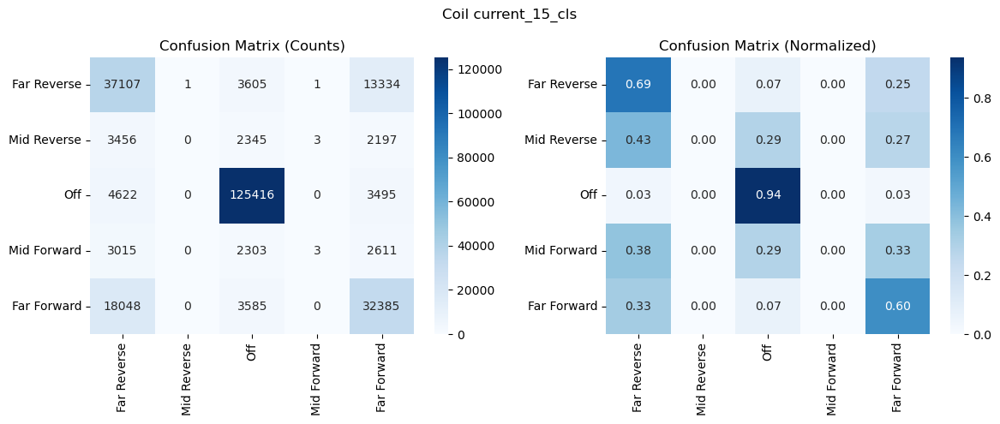

Coil: current_16_cls
              precision    recall  f1-score   support

 Far Reverse      0.539     0.790     0.641     51359
 Mid Reverse      0.642     0.008     0.016      8327
         Off      0.913     0.943     0.928    138369
 Mid Forward      0.527     0.013     0.025      8340
 Far Forward      0.672     0.512     0.581     51137

    accuracy                          0.767    257532
   macro avg      0.658     0.453     0.438    257532
weighted avg      0.769     0.767     0.743    257532



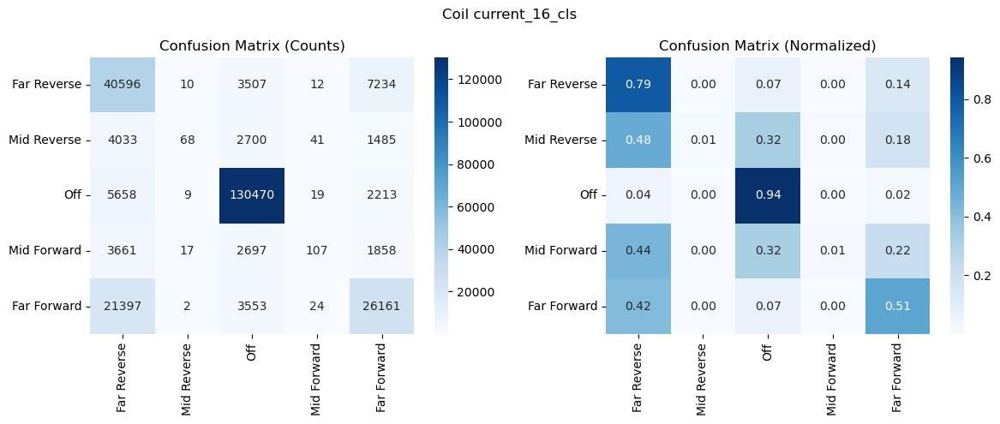

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

labels = ["Far Reverse", "Mid Reverse", "Off", "Mid Forward", "Far Forward"]

for i, cname in enumerate(class_cols):
    y_true = Y_te[i]
    y_pred = Y_pred_int[i]

    print("="*50)
    print(f"Coil: {cname}")
    print(classification_report(y_true, y_pred, target_names=labels, digits=3))

    cm = confusion_matrix(y_true, y_pred, labels=range(5))
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=labels, yticklabels=labels, ax=axes[0])
    axes[0].set_title("Confusion Matrix (Counts)")

    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
                xticklabels=labels, yticklabels=labels, ax=axes[1])
    axes[1].set_title("Confusion Matrix (Normalized)")

    plt.suptitle(f"Coil {cname}")
    plt.tight_layout()
    plt.show()


## Weighted Model

In [40]:
from sklearn.utils.class_weight import compute_class_weight

class_weights = []
for i, cname in enumerate(class_cols):
    y = Y_tr[i]
    weights = compute_class_weight(
        class_weight="balanced",
        classes=np.unique(y),
        y=y
    )
    cw = {cls: w for cls, w in zip(np.unique(y), weights)}
    class_weights.append(cw)

# sanity check one
print(class_cols[0], class_weights[0])


current_1_cls {0: 0.65429335433591, 1: 2.527327371533017, 2: 0.8633558644445655, 3: 2.52835088236016, 4: 0.6569555429424182}


In [67]:
from tensorflow.keras import layers, Model, Input

inputs = Input(shape=(X_tr.shape[1],), name="features")
x = layers.Dense(128, activation="relu")(inputs)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dense(256, activation="relu")(x)

x = layers.Dropout(0.3)(x)

outputs = []
for i, cname in enumerate(class_cols):
    out = layers.Dense(5, activation="softmax", name=cname)(x)
    outputs.append(out)

model = Model(inputs=inputs, outputs=outputs)



In [68]:
import numpy as np

# Y dicts
Y_tr_dict = {name: Y_tr[i] for i, name in enumerate(model.output_names)}
Y_te_dict = {name: Y_te[i] for i, name in enumerate(model.output_names)}

# Sample weights as dict of float32 arrays
sample_weights = {}
for i, name in enumerate(model.output_names):
    y = Y_tr[i]
    classes, counts = np.unique(y, return_counts=True)
    weights = {c: len(y) / (len(classes) * cnt) for c, cnt in zip(classes, counts)}
    sw = np.array([weights[val] for val in y], dtype=np.float32)
    sample_weights[name] = sw

# Sanity check
for name in model.output_names:
    print(name, Y_tr_dict[name].shape, sample_weights[name].shape)


current_1_cls (1030126,) (1030126,)
current_2_cls (1030126,) (1030126,)
current_3_cls (1030126,) (1030126,)
current_4_cls (1030126,) (1030126,)
current_5_cls (1030126,) (1030126,)
current_6_cls (1030126,) (1030126,)
current_7_cls (1030126,) (1030126,)
current_8_cls (1030126,) (1030126,)
current_9_cls (1030126,) (1030126,)
current_10_cls (1030126,) (1030126,)
current_11_cls (1030126,) (1030126,)
current_12_cls (1030126,) (1030126,)
current_13_cls (1030126,) (1030126,)
current_14_cls (1030126,) (1030126,)
current_15_cls (1030126,) (1030126,)
current_16_cls (1030126,) (1030126,)


In [69]:
import tensorflow as tf

def make_weighted_loss(weights_dict):
    weights = tf.constant([weights_dict[c] for c in sorted(weights_dict.keys())], dtype=tf.float32)
    def loss_fn(y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        ce = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
        sw = tf.gather(weights, y_true)
        return ce * sw
    return loss_fn

# Build per-output loss dict
losses = {}
for i, name in enumerate(model.output_names):
    y = Y_tr[i]
    classes, counts = np.unique(y, return_counts=True)
    weights = {c: len(y) / (len(classes) * cnt) for c, cnt in zip(classes, counts)}
    losses[name] = make_weighted_loss(weights)

model.compile(
    optimizer="adam",
    loss=losses,
    metrics={name: ["accuracy"] for name in model.output_names}
)


In [70]:
history = model.fit(
    X_tr,
    Y_tr_dict,
    validation_data=(X_te, Y_te_dict),
    epochs=20,
    batch_size=256,
    verbose=2
)


Epoch 1/20


2025-08-16 17:04:38.373864: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1040', 8 bytes spill stores, 8 bytes spill loads

2025-08-16 17:04:38.617675: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4630_0', 472 bytes spill stores, 472 bytes spill loads

2025-08-16 17:04:38.722136: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1040', 104 bytes spill stores, 104 bytes spill loads

2025-08-16 17:04:39.192680: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4630', 84 bytes spill stores, 84 bytes spill loads

2025-08-16 17:04:39.197910: I extern

4024/4024 - 33s - 8ms/step - current_10_cls_accuracy: 0.4941 - current_10_cls_loss: 1.3235 - current_11_cls_accuracy: 0.5118 - current_11_cls_loss: 1.3211 - current_12_cls_accuracy: 0.5276 - current_12_cls_loss: 1.2944 - current_13_cls_accuracy: 0.5434 - current_13_cls_loss: 1.2831 - current_14_cls_accuracy: 0.5464 - current_14_cls_loss: 1.2846 - current_15_cls_accuracy: 0.5544 - current_15_cls_loss: 1.2771 - current_16_cls_accuracy: 0.5623 - current_16_cls_loss: 1.2707 - current_1_cls_accuracy: 0.4062 - current_1_cls_loss: 1.3700 - current_2_cls_accuracy: 0.3995 - current_2_cls_loss: 1.3886 - current_3_cls_accuracy: 0.4056 - current_3_cls_loss: 1.3808 - current_4_cls_accuracy: 0.4214 - current_4_cls_loss: 1.3659 - current_5_cls_accuracy: 0.4010 - current_5_cls_loss: 1.3854 - current_6_cls_accuracy: 0.4054 - current_6_cls_loss: 1.4004 - current_7_cls_accuracy: 0.4351 - current_7_cls_loss: 1.3529 - current_8_cls_accuracy: 0.4543 - current_8_cls_loss: 1.3241 - current_9_cls_accuracy: 0.4

In [71]:
# 1) Predict
Y_pred_list = model.predict(X_te, batch_size=256, verbose=0)

# 2) Convert predictions to integer classes per coil
Y_pred_int = {c: Y_pred_list[i].argmax(axis=1) for i, c in enumerate(class_cols)}


Coil: current_1_cls
              precision    recall  f1-score   support

 Far Reverse      0.648     0.655     0.652     78912
 Mid Reverse      0.199     0.353     0.255     20503
         Off      0.838     0.627     0.717     59395
 Mid Forward      0.200     0.362     0.257     20199
 Far Forward      0.722     0.555     0.627     78523

    accuracy                          0.571    257532
   macro avg      0.521     0.510     0.502    257532
weighted avg      0.644     0.571     0.597    257532



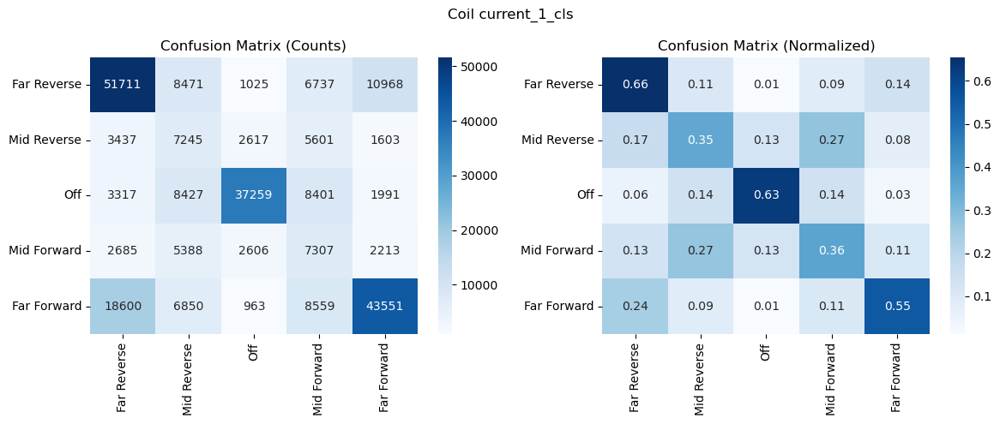

Coil: current_2_cls
              precision    recall  f1-score   support

 Far Reverse      0.677     0.555     0.610     85370
 Mid Reverse      0.162     0.355     0.222     18803
         Off      0.795     0.632     0.704     49337
 Mid Forward      0.174     0.236     0.200     18645
 Far Forward      0.635     0.608     0.621     85377

    accuracy                          0.549    257532
   macro avg      0.488     0.477     0.471    257532
weighted avg      0.612     0.549     0.574    257532



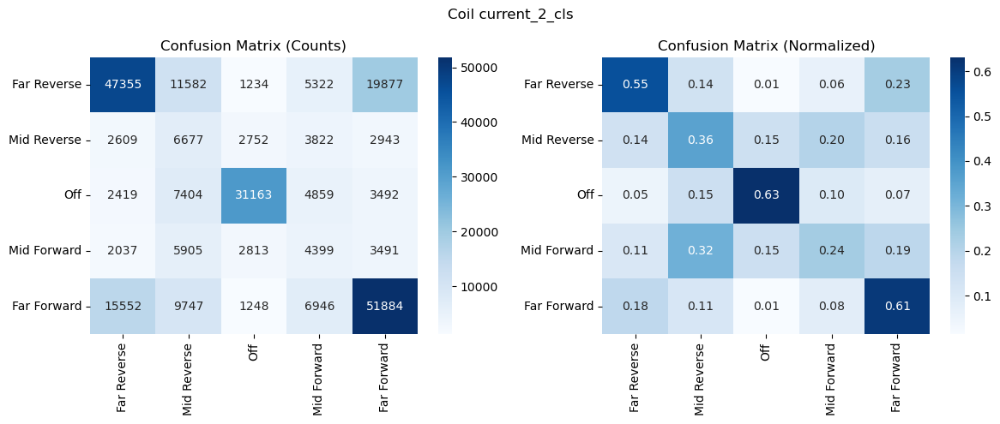

Coil: current_3_cls
              precision    recall  f1-score   support

 Far Reverse      0.624     0.635     0.630     81624
 Mid Reverse      0.157     0.489     0.237     18424
         Off      0.814     0.631     0.711     56858
 Mid Forward      0.159     0.106     0.127     18786
 Far Forward      0.703     0.518     0.597     81840

    accuracy                          0.548    257532
   macro avg      0.491     0.476     0.460    257532
weighted avg      0.624     0.548     0.572    257532



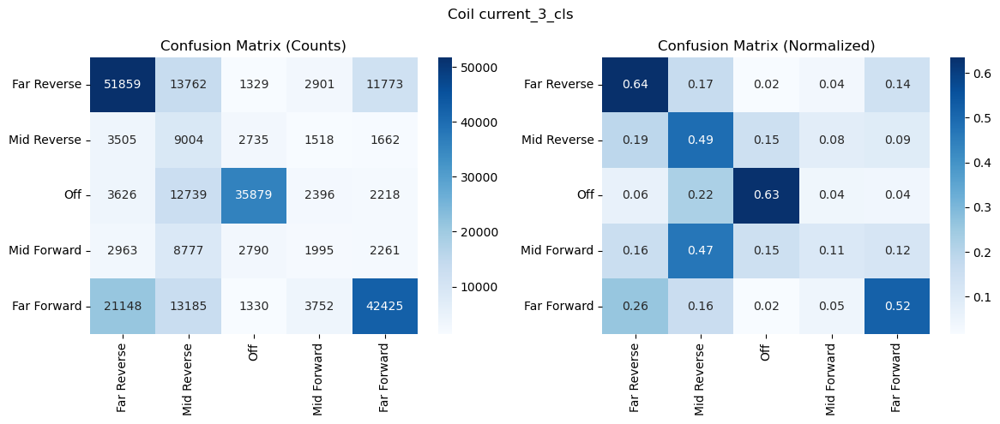

Coil: current_4_cls
              precision    recall  f1-score   support

 Far Reverse      0.655     0.637     0.646     75032
 Mid Reverse      0.167     0.221     0.190     18576
         Off      0.850     0.662     0.744     70362
 Mid Forward      0.173     0.440     0.248     18645
 Far Forward      0.714     0.551     0.622     74917

    accuracy                          0.574    257532
   macro avg      0.512     0.502     0.490    257532
weighted avg      0.656     0.574     0.604    257532



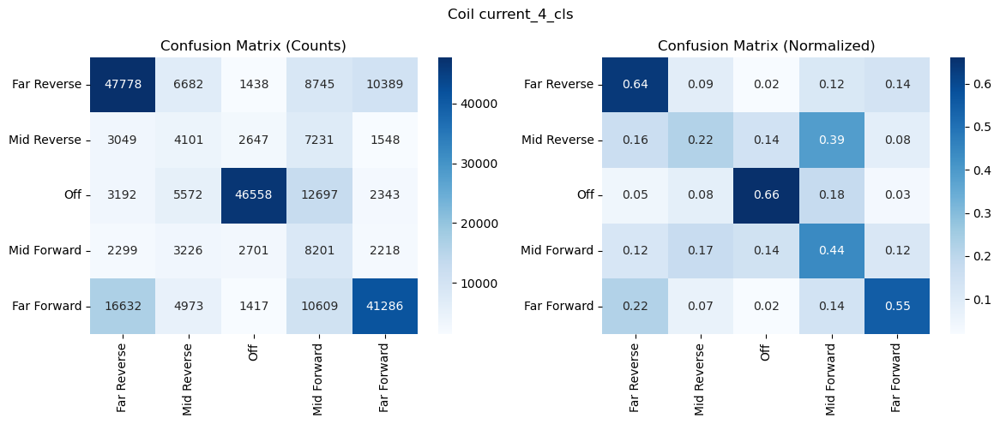

Coil: current_5_cls
              precision    recall  f1-score   support

 Far Reverse      0.645     0.601     0.622     81188
 Mid Reverse      0.171     0.368     0.234     19788
         Off      0.811     0.630     0.709     56044
 Mid Forward      0.186     0.237     0.208     19681
 Far Forward      0.659     0.578     0.616     80831

    accuracy                          0.554    257532
   macro avg      0.495     0.483     0.478    257532
weighted avg      0.614     0.554     0.578    257532



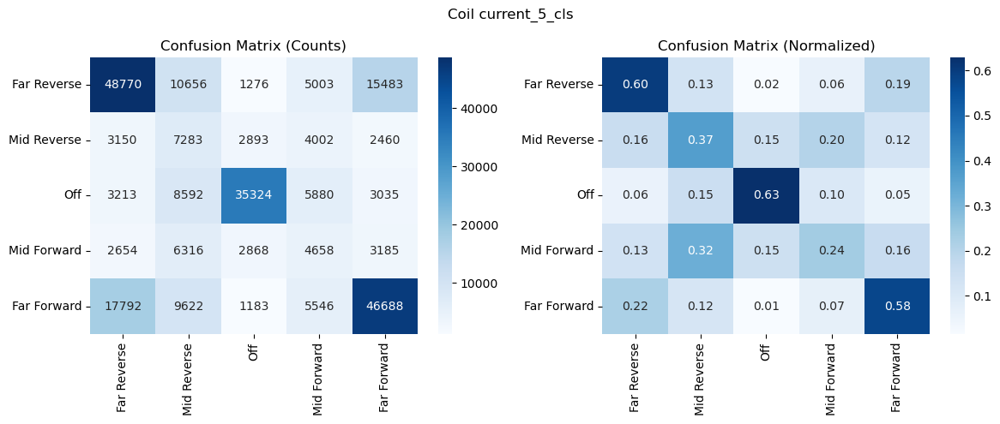

Coil: current_6_cls
              precision    recall  f1-score   support

 Far Reverse      0.612     0.604     0.608     84654
 Mid Reverse      0.140     0.425     0.211     16593
         Off      0.818     0.646     0.722     54647
 Mid Forward      0.142     0.122     0.132     16785
 Far Forward      0.668     0.520     0.585     84853

    accuracy                          0.542    257532
   macro avg      0.476     0.463     0.451    257532
weighted avg      0.613     0.542     0.568    257532



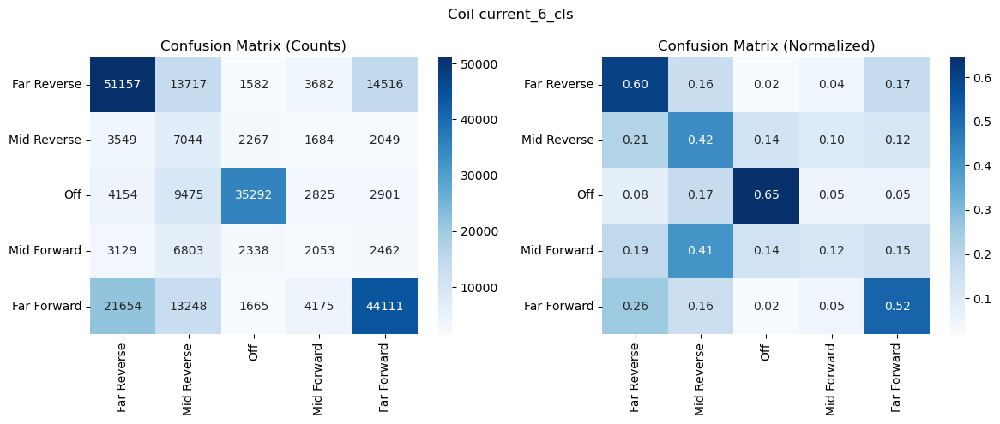

Coil: current_7_cls
              precision    recall  f1-score   support

 Far Reverse      0.688     0.550     0.612     78526
 Mid Reverse      0.122     0.267     0.167     13598
         Off      0.925     0.702     0.798     73288
 Mid Forward      0.123     0.325     0.179     13666
 Far Forward      0.644     0.601     0.622     78454

    accuracy                          0.582    257532
   macro avg      0.500     0.489     0.476    257532
weighted avg      0.682     0.582     0.621    257532



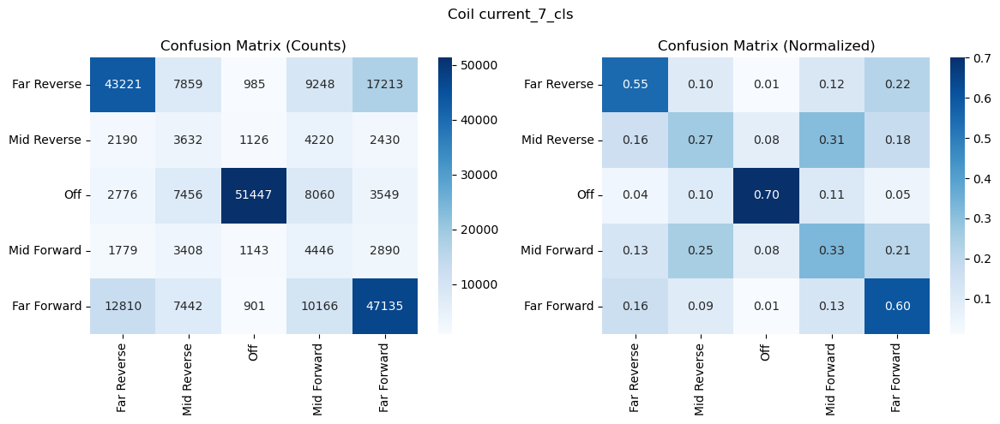

Coil: current_8_cls
              precision    recall  f1-score   support

 Far Reverse      0.714     0.555     0.625     70661
 Mid Reverse      0.138     0.352     0.198     13936
         Off      0.943     0.729     0.822     88442
 Mid Forward      0.135     0.324     0.191     14043
 Far Forward      0.668     0.617     0.641     70450

    accuracy                          0.608    257532
   macro avg      0.520     0.515     0.496    257532
weighted avg      0.717     0.608     0.650    257532



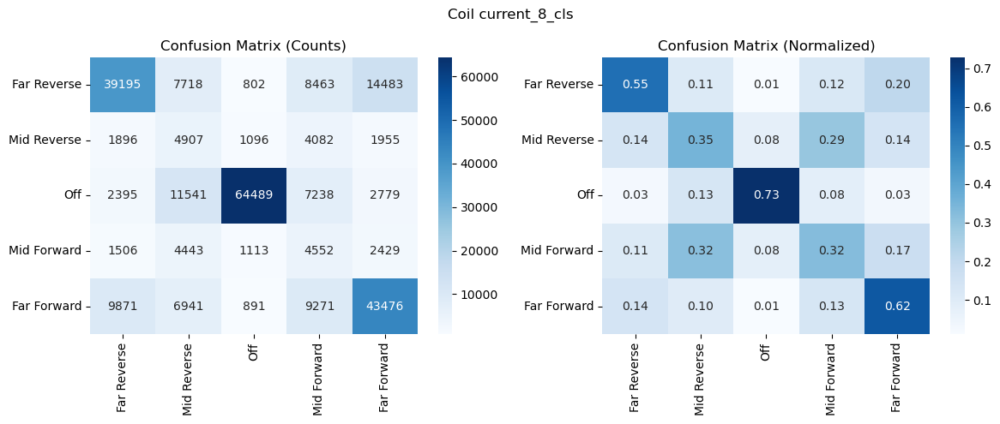

Coil: current_9_cls
              precision    recall  f1-score   support

 Far Reverse      0.682     0.630     0.655     66186
 Mid Reverse      0.135     0.210     0.165     12858
         Off      0.960     0.759     0.848     98854
 Mid Forward      0.139     0.475     0.216     12875
 Far Forward      0.714     0.583     0.642     66759

    accuracy                          0.638    257532
   macro avg      0.526     0.531     0.505    257532
weighted avg      0.743     0.638     0.679    257532



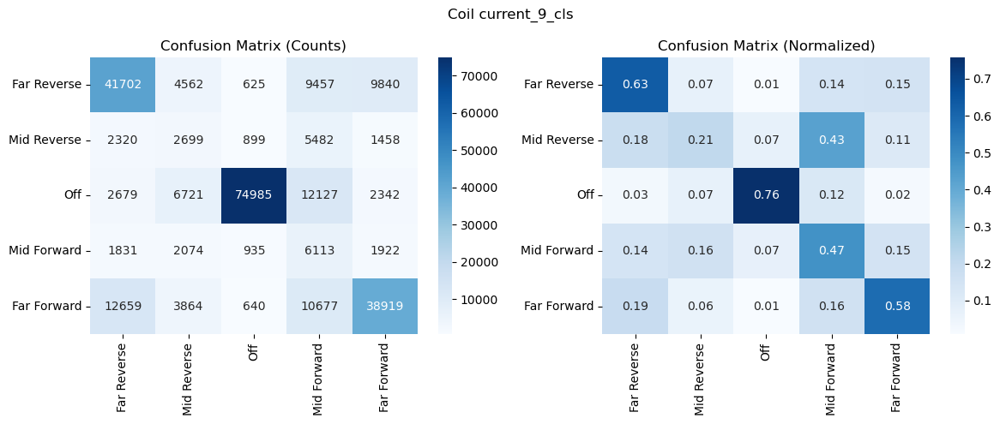

Coil: current_10_cls
              precision    recall  f1-score   support

 Far Reverse      0.719     0.561     0.630     65865
 Mid Reverse      0.101     0.494     0.168     10105
         Off      0.965     0.775     0.860    105363
 Mid Forward      0.100     0.173     0.126     10155
 Far Forward      0.703     0.580     0.636     66044

    accuracy                          0.636    257532
   macro avg      0.518     0.517     0.484    257532
weighted avg      0.767     0.636     0.688    257532



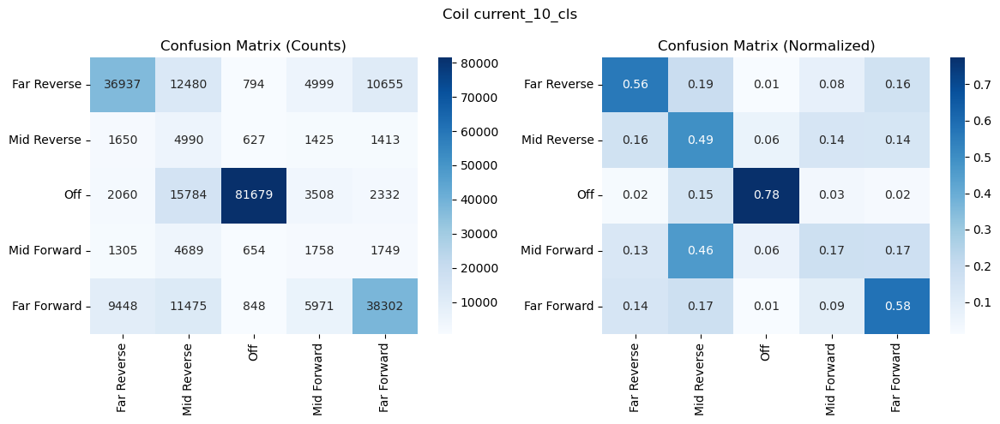

Coil: current_11_cls
              precision    recall  f1-score   support

 Far Reverse      0.695     0.617     0.653     62267
 Mid Reverse      0.109     0.399     0.172      9596
         Off      0.971     0.798     0.876    113384
 Mid Forward      0.110     0.285     0.159      9664
 Far Forward      0.733     0.574     0.644     62621

    accuracy                          0.666    257532
   macro avg      0.524     0.535     0.501    257532
weighted avg      0.782     0.666     0.713    257532



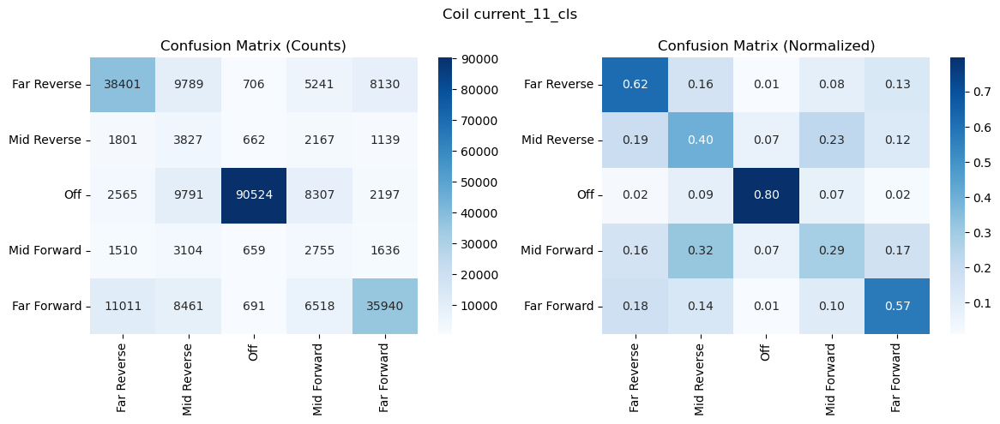

Coil: current_12_cls
              precision    recall  f1-score   support

 Far Reverse      0.718     0.646     0.680     58870
 Mid Reverse      0.121     0.309     0.174      9839
         Off      0.976     0.817     0.889    120330
 Mid Forward      0.135     0.396     0.202     10048
 Far Forward      0.734     0.617     0.670     58445

    accuracy                          0.697    257532
   macro avg      0.537     0.557     0.523    257532
weighted avg      0.797     0.697     0.738    257532



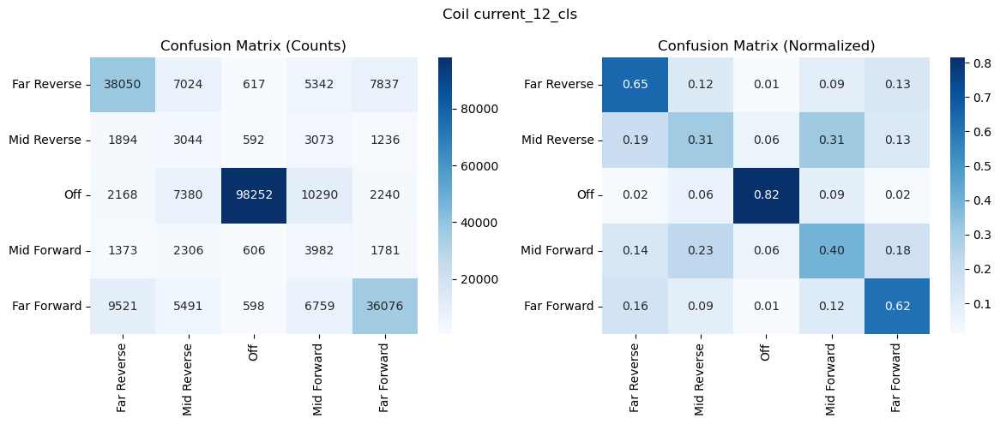

Coil: current_13_cls
              precision    recall  f1-score   support

 Far Reverse      0.755     0.665     0.707     55370
 Mid Reverse      0.158     0.274     0.200      9243
         Off      0.980     0.820     0.893    128327
 Mid Forward      0.124     0.528     0.200      9110
 Far Forward      0.771     0.645     0.702     55482

    accuracy                          0.719    257532
   macro avg      0.557     0.587     0.541    257532
weighted avg      0.827     0.719     0.763    257532



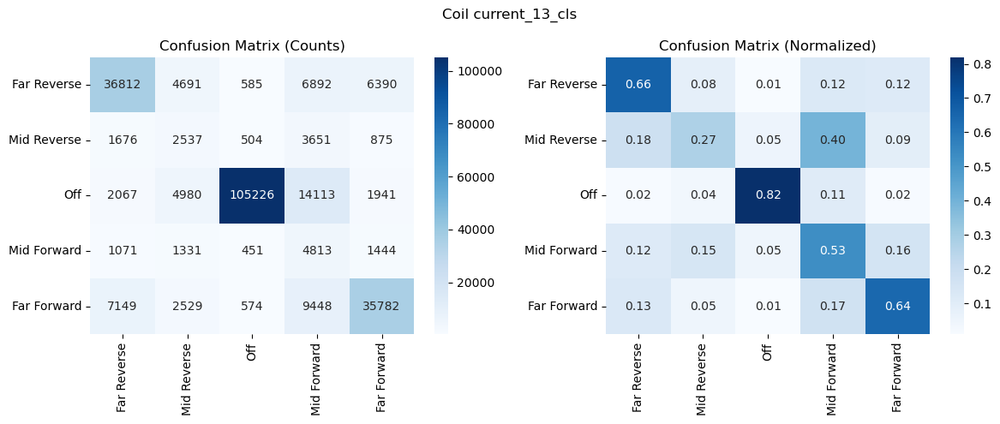

Coil: current_14_cls
              precision    recall  f1-score   support

 Far Reverse      0.761     0.597     0.669     55912
 Mid Reverse      0.110     0.359     0.169      8169
         Off      0.983     0.834     0.902    129581
 Mid Forward      0.101     0.415     0.163      8171
 Far Forward      0.766     0.600     0.673     55699

    accuracy                          0.704    257532
   macro avg      0.544     0.561     0.515    257532
weighted avg      0.832     0.704     0.755    257532



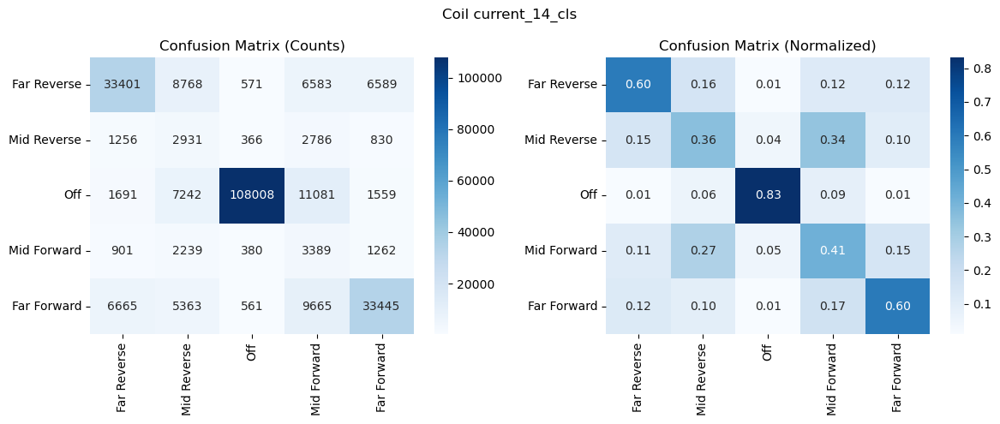

Coil: current_15_cls
              precision    recall  f1-score   support

 Far Reverse      0.777     0.620     0.690     54048
 Mid Reverse      0.118     0.432     0.186      8001
         Off      0.986     0.838     0.906    133533
 Mid Forward      0.111     0.382     0.172      7932
 Far Forward      0.766     0.629     0.691     54018

    accuracy                          0.722    257532
   macro avg      0.552     0.580     0.529    257532
weighted avg      0.842     0.722     0.770    257532



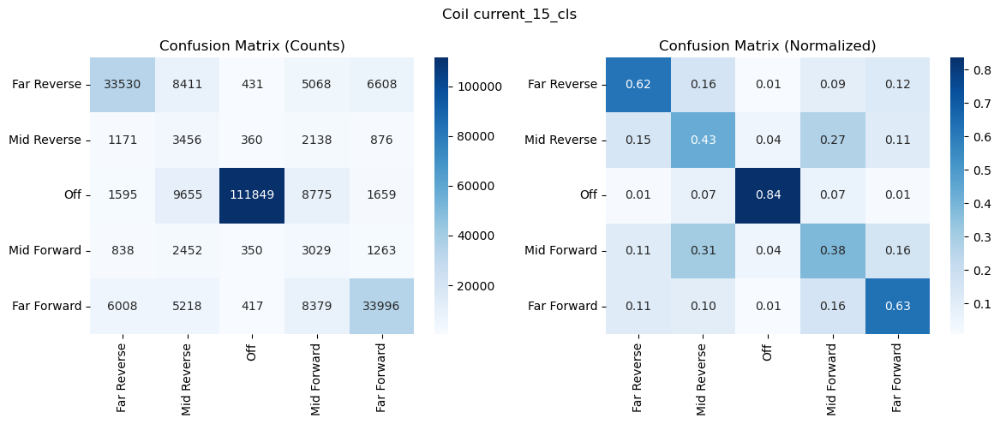

Coil: current_16_cls
              precision    recall  f1-score   support

 Far Reverse      0.798     0.633     0.706     51359
 Mid Reverse      0.134     0.527     0.214      8327
         Off      0.987     0.845     0.910    138369
 Mid Forward      0.160     0.364     0.222      8340
 Far Forward      0.752     0.685     0.717     51137

    accuracy                          0.745    257532
   macro avg      0.566     0.611     0.554    257532
weighted avg      0.848     0.745     0.786    257532



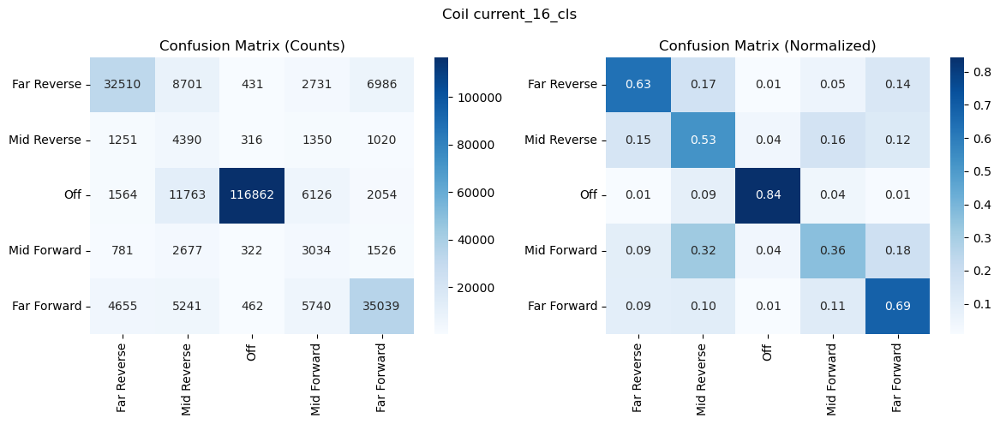

In [72]:
for i, cname in enumerate(class_cols):
    y_true = Y_te[i]              # true labels for this coil
    y_pred = Y_pred_int[cname]    # predicted labels for this coil

    print("="*60)
    print(f"Coil: {cname}")
    print(classification_report(y_true, y_pred, target_names=labels, digits=3))

    cm = confusion_matrix(y_true, y_pred, labels=range(5))
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=labels, yticklabels=labels, ax=axes[0])
    axes[0].set_title("Confusion Matrix (Counts)")

    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
                xticklabels=labels, yticklabels=labels, ax=axes[1])
    axes[1].set_title("Confusion Matrix (Normalized)")

    plt.suptitle(f"Coil {cname}")
    plt.tight_layout()
    plt.show()

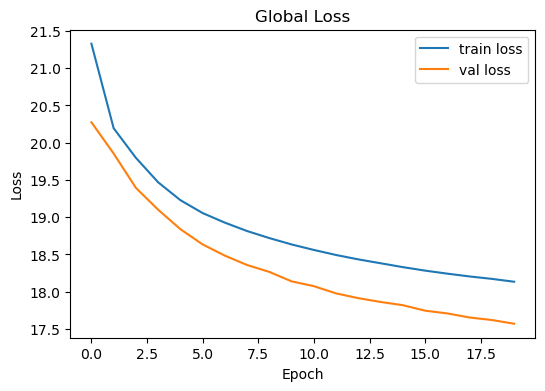

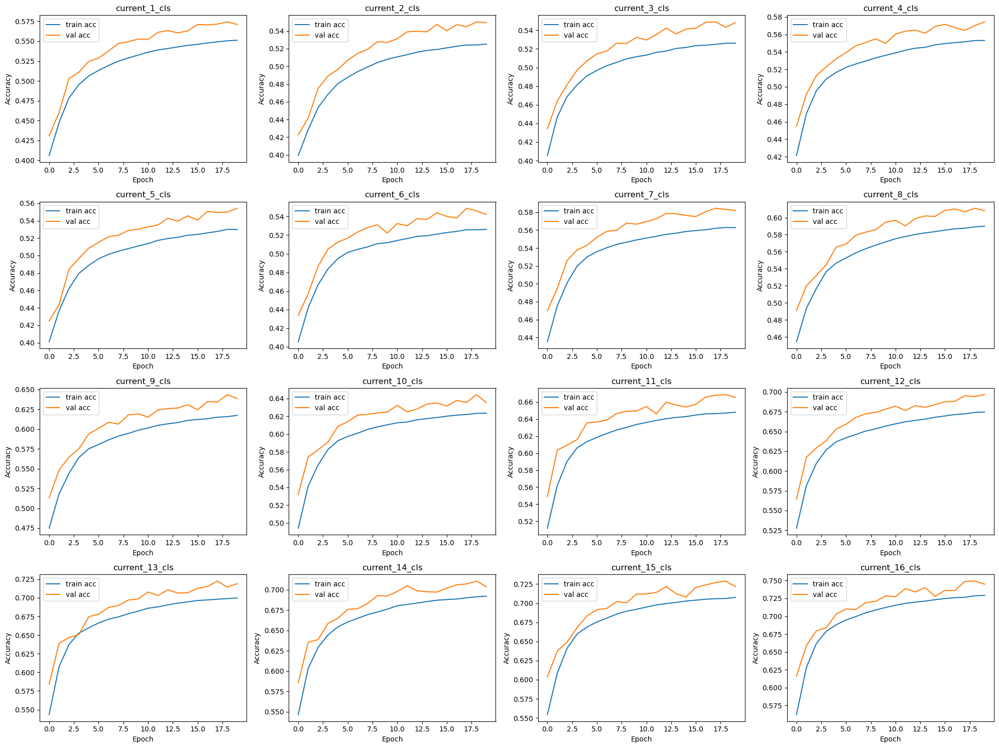

In [73]:
import matplotlib.pyplot as plt

# --- Global loss ---
plt.figure(figsize=(6,4))
plt.plot(history.history["loss"], label="train loss")
plt.plot(history.history["val_loss"], label="val loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Global Loss")
plt.legend()
plt.show()

# --- Per-coil accuracy ---
n = len(class_cols)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,15))  # 16 coils → 4x4 grid
axes = axes.ravel()

for i, cname in enumerate(class_cols):
    acc_key = f"{cname}_accuracy"
    val_acc_key = f"val_{cname}_accuracy"
    if acc_key in history.history:  # safeguard
        axes[i].plot(history.history[acc_key], label="train acc")
        axes[i].plot(history.history[val_acc_key], label="val acc")
        axes[i].set_title(cname)
        axes[i].set_xlabel("Epoch")
        axes[i].set_ylabel("Accuracy")
        axes[i].legend()

plt.tight_layout()
plt.show()

Coil: current_1_cls
              precision    recall  f1-score   support

 Far Reverse      0.528     0.680     0.595     78912
 Mid Reverse      0.169     0.275     0.209     20503
         Off      0.826     0.632     0.716     59395
 Mid Forward      0.174     0.320     0.226     20199
 Far Forward      0.667     0.341     0.451     78523

    accuracy                          0.505    257532
   macro avg      0.473     0.449     0.439    257532
weighted avg      0.583     0.505     0.519    257532



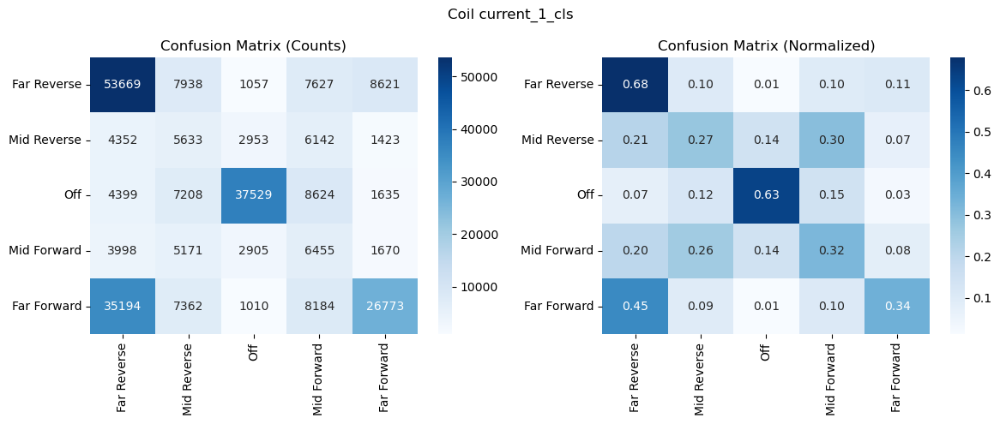

Coil: current_2_cls
              precision    recall  f1-score   support

 Far Reverse      0.563     0.374     0.449     85370
 Mid Reverse      0.163     0.371     0.227     18803
         Off      0.783     0.614     0.688     49337
 Mid Forward      0.136     0.163     0.148     18645
 Far Forward      0.516     0.586     0.548     85377

    accuracy                          0.475    257532
   macro avg      0.432     0.422     0.412    257532
weighted avg      0.529     0.475     0.490    257532



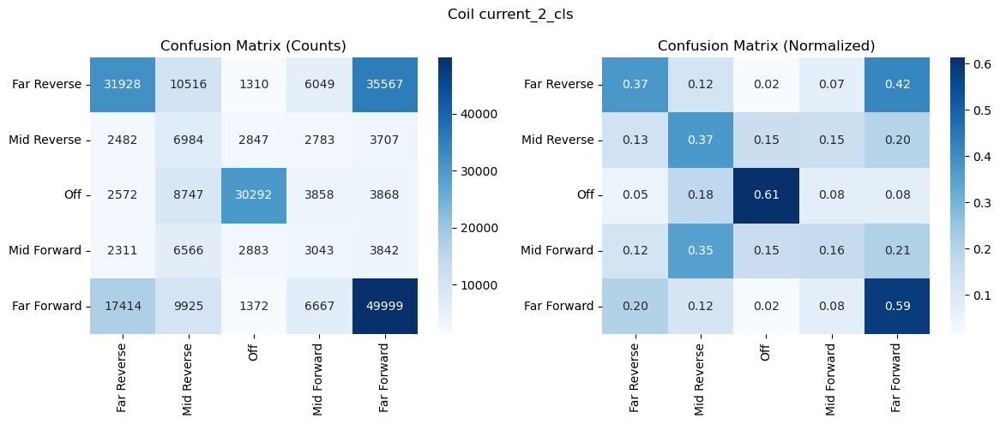

Coil: current_3_cls
              precision    recall  f1-score   support

 Far Reverse      0.532     0.563     0.547     81624
 Mid Reverse      0.157     0.219     0.183     18424
         Off      0.793     0.638     0.707     56858
 Mid Forward      0.157     0.319     0.210     18786
 Far Forward      0.575     0.431     0.493     81840

    accuracy                          0.495    257532
   macro avg      0.443     0.434     0.428    257532
weighted avg      0.549     0.495     0.515    257532



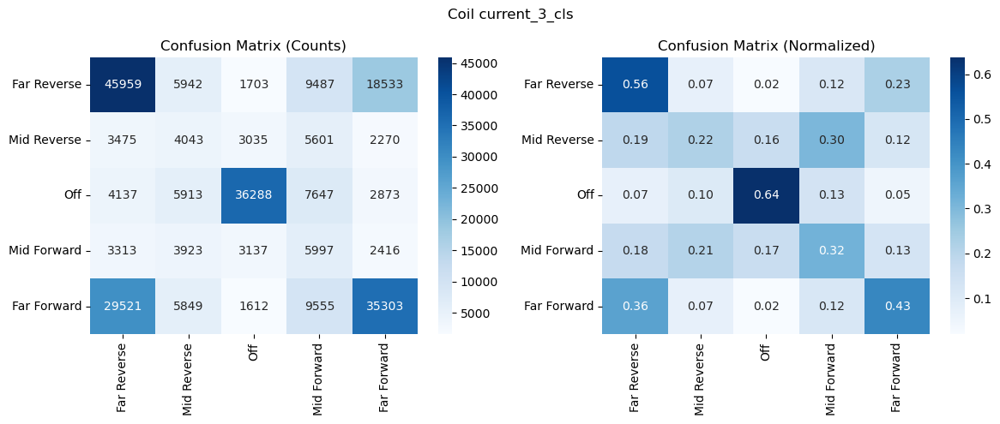

Coil: current_4_cls
              precision    recall  f1-score   support

 Far Reverse      0.613     0.445     0.516     75032
 Mid Reverse      0.149     0.244     0.185     18576
         Off      0.838     0.661     0.739     70362
 Mid Forward      0.163     0.315     0.215     18645
 Far Forward      0.550     0.595     0.572     74917

    accuracy                          0.524    257532
   macro avg      0.463     0.452     0.445    257532
weighted avg      0.590     0.524     0.547    257532



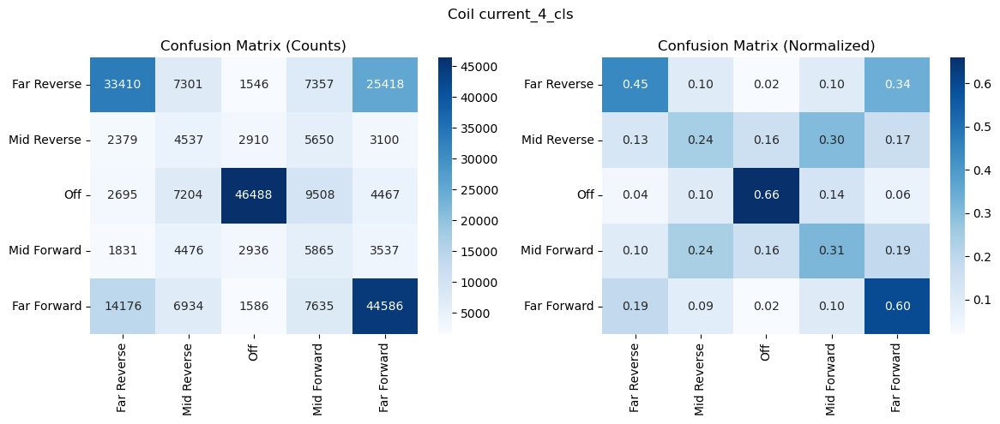

Coil: current_5_cls
              precision    recall  f1-score   support

 Far Reverse      0.575     0.418     0.484     81188
 Mid Reverse      0.154     0.367     0.217     19788
         Off      0.818     0.600     0.692     56044
 Mid Forward      0.169     0.198     0.182     19681
 Far Forward      0.525     0.567     0.545     80831

    accuracy                          0.484    257532
   macro avg      0.448     0.430     0.424    257532
weighted avg      0.549     0.484     0.505    257532



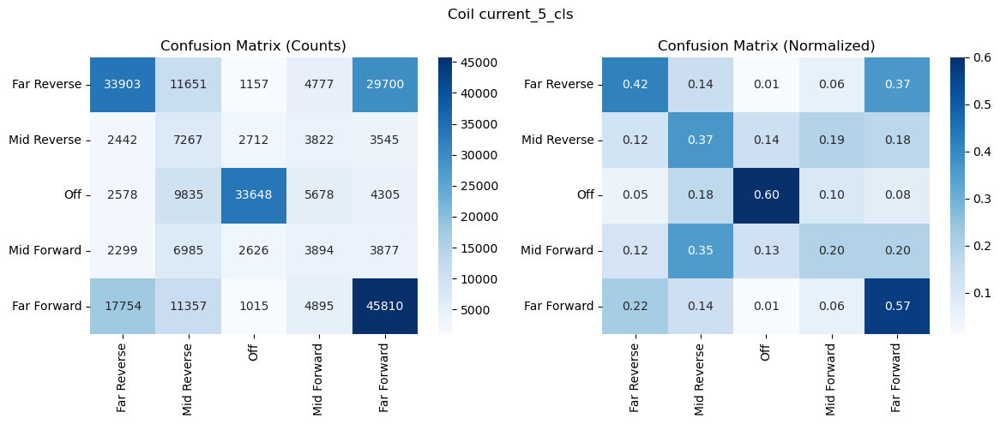

Coil: current_6_cls
              precision    recall  f1-score   support

 Far Reverse      0.585     0.344     0.433     84654
 Mid Reverse      0.137     0.145     0.141     16593
         Off      0.798     0.647     0.714     54647
 Mid Forward      0.150     0.334     0.207     16785
 Far Forward      0.493     0.630     0.553     84853

    accuracy                          0.489    257532
   macro avg      0.432     0.420     0.410    257532
weighted avg      0.542     0.489     0.499    257532



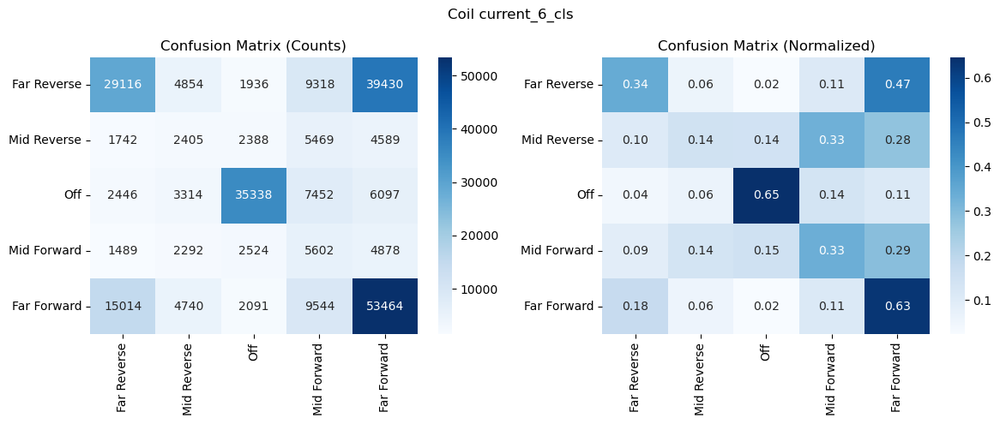

Coil: current_7_cls
              precision    recall  f1-score   support

 Far Reverse      0.514     0.600     0.553     78526
 Mid Reverse      0.110     0.201     0.142     13598
         Off      0.911     0.704     0.794     73288
 Mid Forward      0.129     0.320     0.183     13666
 Far Forward      0.583     0.374     0.455     78454

    accuracy                          0.525    257532
   macro avg      0.449     0.440     0.426    257532
weighted avg      0.606     0.525     0.551    257532



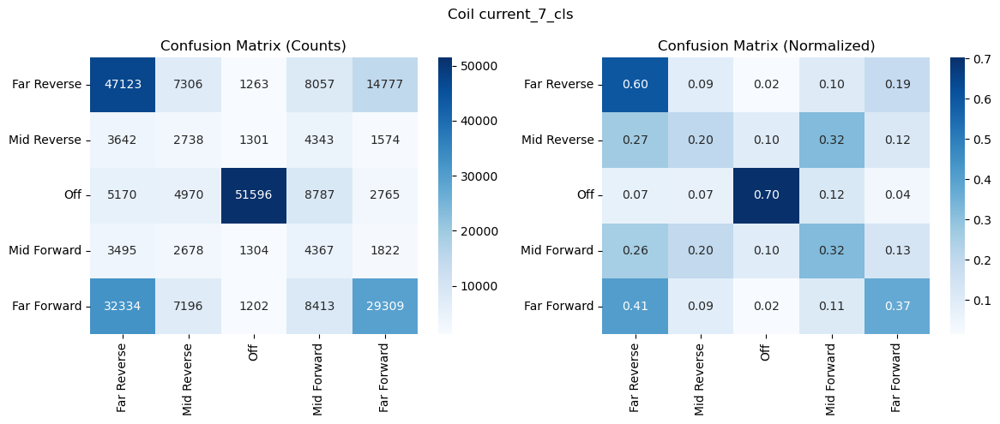

Coil: current_8_cls
              precision    recall  f1-score   support

 Far Reverse      0.582     0.421     0.489     70661
 Mid Reverse      0.122     0.119     0.120     13936
         Off      0.931     0.729     0.817     88442
 Mid Forward      0.128     0.465     0.201     14043
 Far Forward      0.539     0.554     0.546     70450

    accuracy                          0.549    257532
   macro avg      0.460     0.458     0.435    257532
weighted avg      0.640     0.549     0.582    257532



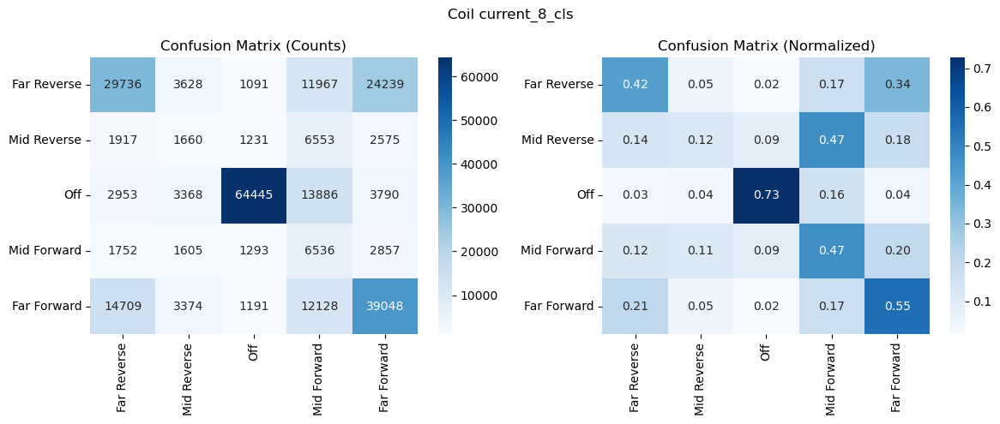

Coil: current_9_cls
              precision    recall  f1-score   support

 Far Reverse      0.560     0.480     0.517     66186
 Mid Reverse      0.126     0.293     0.176     12858
         Off      0.951     0.761     0.845     98854
 Mid Forward      0.128     0.324     0.183     12875
 Far Forward      0.564     0.499     0.529     66759

    accuracy                          0.576    257532
   macro avg      0.466     0.471     0.450    257532
weighted avg      0.668     0.576     0.612    257532



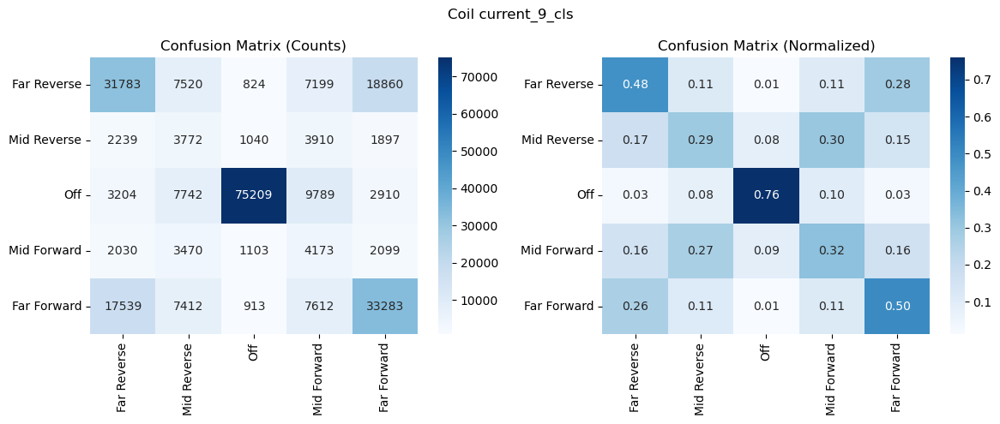

Coil: current_10_cls
              precision    recall  f1-score   support

 Far Reverse      0.523     0.606     0.561     65865
 Mid Reverse      0.099     0.442     0.162     10105
         Off      0.958     0.778     0.859    105363
 Mid Forward      0.089     0.121     0.103     10155
 Far Forward      0.621     0.349     0.447     66044

    accuracy                          0.585    257532
   macro avg      0.458     0.459     0.426    257532
weighted avg      0.692     0.585     0.620    257532



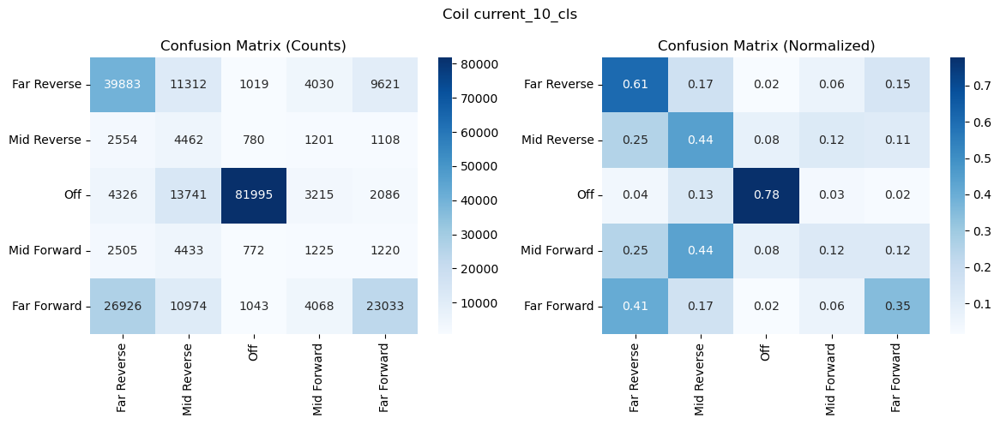

Coil: current_11_cls
              precision    recall  f1-score   support

 Far Reverse      0.613     0.397     0.482     62267
 Mid Reverse      0.099     0.130     0.112      9596
         Off      0.966     0.797     0.873    113384
 Mid Forward      0.097     0.470     0.160      9664
 Far Forward      0.550     0.562     0.556     62621

    accuracy                          0.606    257532
   macro avg      0.465     0.471     0.437    257532
weighted avg      0.714     0.606     0.646    257532



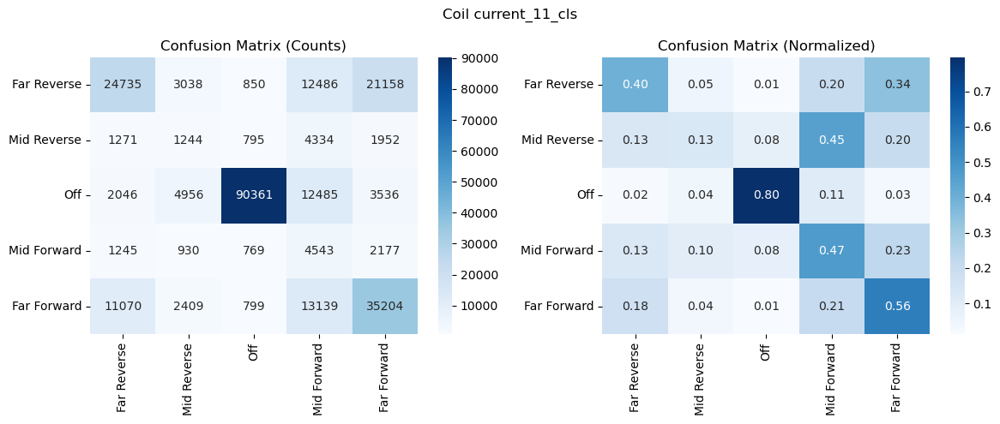

Coil: current_12_cls
              precision    recall  f1-score   support

 Far Reverse      0.623     0.430     0.509     58870
 Mid Reverse      0.098     0.148     0.118      9839
         Off      0.973     0.811     0.885    120330
 Mid Forward      0.112     0.422     0.177     10048
 Far Forward      0.544     0.594     0.568     58445

    accuracy                          0.634    257532
   macro avg      0.470     0.481     0.451    257532
weighted avg      0.729     0.634     0.670    257532



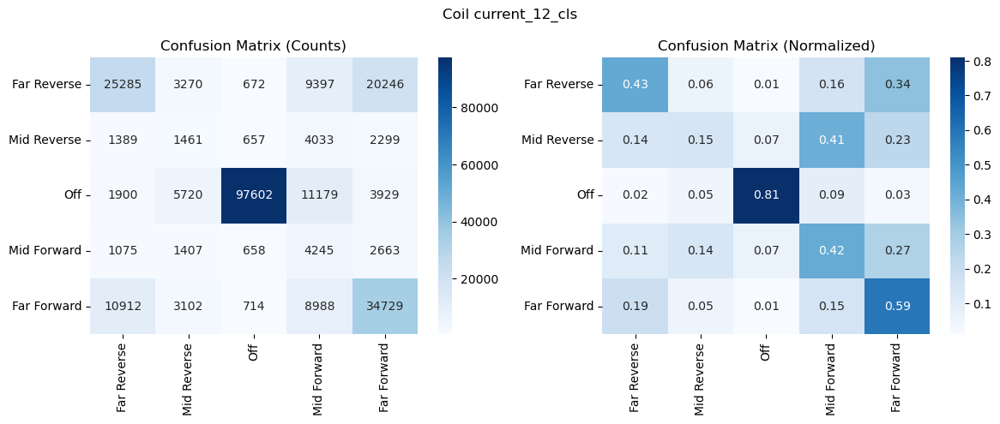

Coil: current_13_cls
              precision    recall  f1-score   support

 Far Reverse      0.616     0.560     0.587     55370
 Mid Reverse      0.113     0.413     0.178      9243
         Off      0.978     0.813     0.888    128327
 Mid Forward      0.101     0.226     0.140      9110
 Far Forward      0.632     0.529     0.576     55482

    accuracy                          0.662    257532
   macro avg      0.488     0.508     0.474    257532
weighted avg      0.764     0.662     0.704    257532



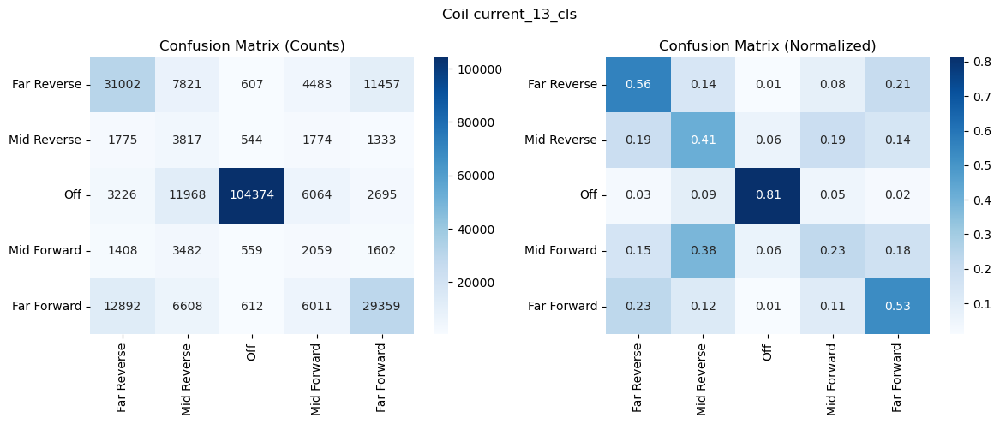

Coil: current_14_cls
              precision    recall  f1-score   support

 Far Reverse      0.656     0.409     0.504     55912
 Mid Reverse      0.095     0.403     0.154      8169
         Off      0.979     0.831     0.899    129581
 Mid Forward      0.085     0.248     0.127      8171
 Far Forward      0.578     0.565     0.571     55699

    accuracy                          0.650    257532
   macro avg      0.479     0.491     0.451    257532
weighted avg      0.766     0.650     0.694    257532



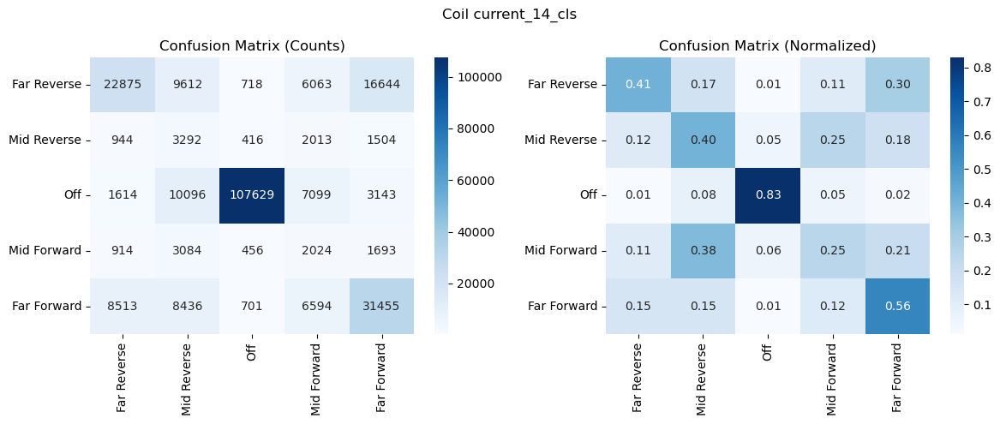

Coil: current_15_cls
              precision    recall  f1-score   support

 Far Reverse      0.589     0.535     0.560     54048
 Mid Reverse      0.096     0.414     0.156      8001
         Off      0.984     0.832     0.901    133533
 Mid Forward      0.092     0.259     0.135      7932
 Far Forward      0.628     0.447     0.523     54018

    accuracy                          0.658    257532
   macro avg      0.478     0.497     0.455    257532
weighted avg      0.771     0.658     0.704    257532



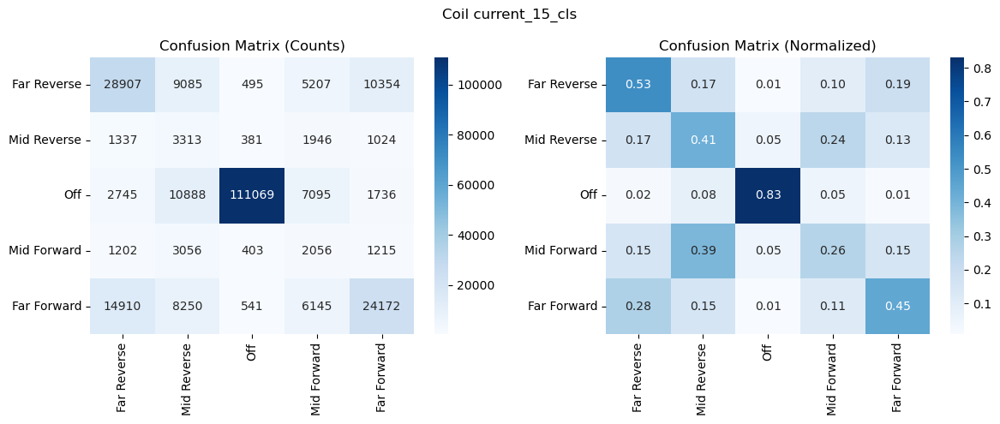

Coil: current_16_cls
              precision    recall  f1-score   support

 Far Reverse      0.584     0.630     0.606     51359
 Mid Reverse      0.111     0.183     0.138      8327
         Off      0.986     0.840     0.907    138369
 Mid Forward      0.102     0.462     0.167      8340
 Far Forward      0.673     0.430     0.525     51137

    accuracy                          0.683    257532
   macro avg      0.491     0.509     0.469    257532
weighted avg      0.787     0.683     0.722    257532



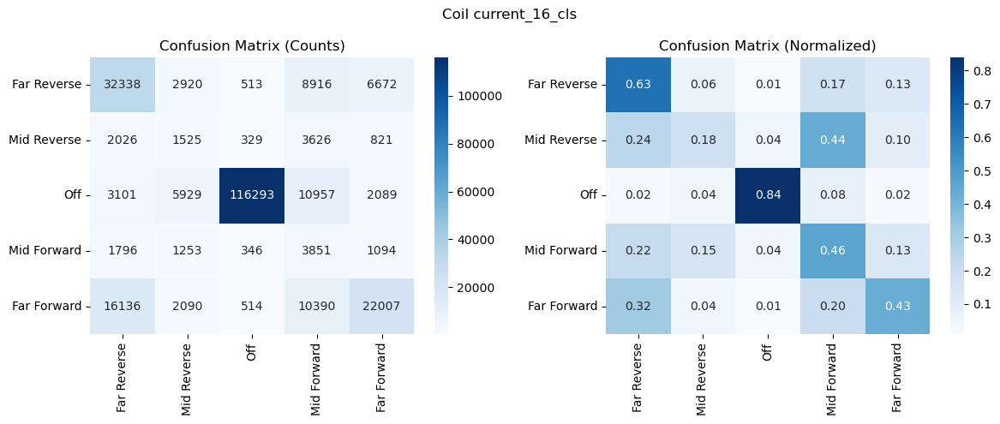

In [65]:
for i, cname in enumerate(class_cols):
    y_true = Y_te[i]              # true labels for this coil
    y_pred = Y_pred_int[cname]    # predicted labels for this coil

    print("="*60)
    print(f"Coil: {cname}")
    print(classification_report(y_true, y_pred, target_names=labels, digits=3))

    cm = confusion_matrix(y_true, y_pred, labels=range(5))
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=labels, yticklabels=labels, ax=axes[0])
    axes[0].set_title("Confusion Matrix (Counts)")

    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
                xticklabels=labels, yticklabels=labels, ax=axes[1])
    axes[1].set_title("Confusion Matrix (Normalized)")

    plt.suptitle(f"Coil {cname}")
    plt.tight_layout()
    plt.show()


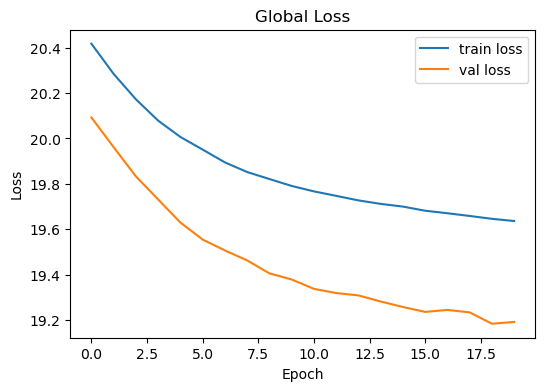

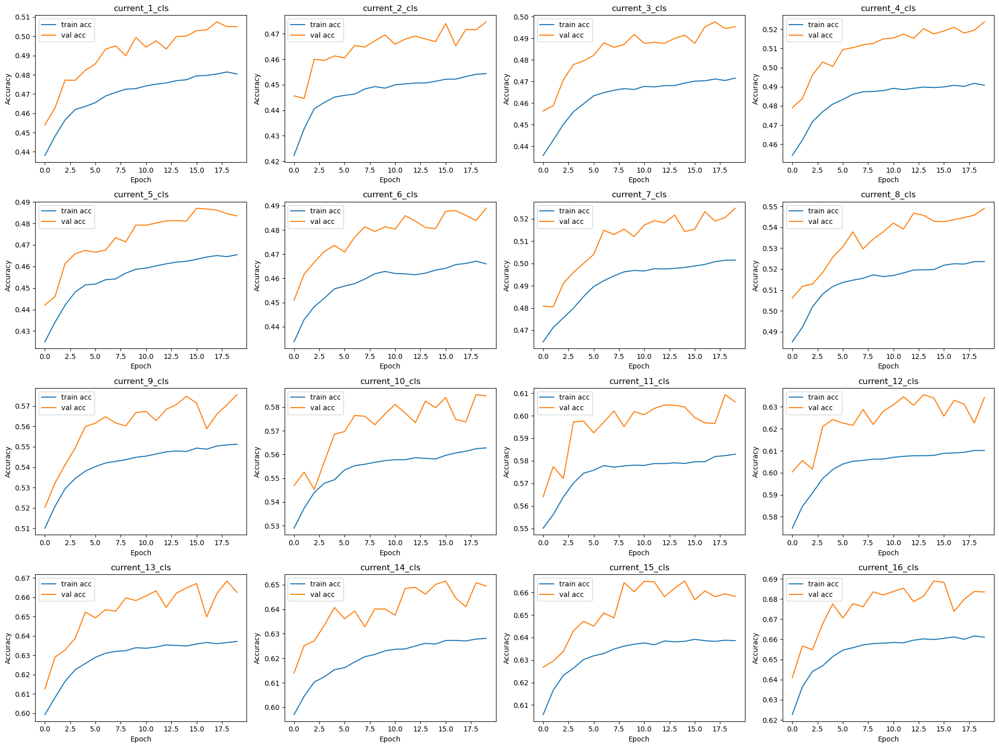

In [66]:
import matplotlib.pyplot as plt

# --- Global loss ---
plt.figure(figsize=(6,4))
plt.plot(history.history["loss"], label="train loss")
plt.plot(history.history["val_loss"], label="val loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Global Loss")
plt.legend()
plt.show()

# --- Per-coil accuracy ---
n = len(class_cols)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,15))  # 16 coils → 4x4 grid
axes = axes.ravel()

for i, cname in enumerate(class_cols):
    acc_key = f"{cname}_accuracy"
    val_acc_key = f"val_{cname}_accuracy"
    if acc_key in history.history:  # safeguard
        axes[i].plot(history.history[acc_key], label="train acc")
        axes[i].plot(history.history[val_acc_key], label="val acc")
        axes[i].set_title(cname)
        axes[i].set_xlabel("Epoch")
        axes[i].set_ylabel("Accuracy")
        axes[i].legend()

plt.tight_layout()
plt.show()


## Logistic Regression

In [40]:
# --- Physics-aware multinomial logistic regression (per-coil) ---
# Idea: Γ_row(X) is linear in X → s = (Γ_row(X) · W).
# This is equivalent to a linear classifier on interaction features Z = [X*Fx, X*Fy, ..., X*Tz].
# We keep intercept in LogisticRegression (bias term).

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# 1) Config
coil_target = "current_7"         # pick the coil
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]
thr = 5.0                         # classification threshold (A)

# 2) Labels: reverse=0, off=1, forward=2 (covers [-10,10])
y_cont = df[coil_target].astype(float).values
y_cls = np.where(y_cont < -thr, 0, np.where(y_cont > thr, 2, 1)).astype(int)

# 3) Interaction features Z = concat_i (X_feat * W[:, i])
Xf = df[feature_cols].astype(float).values
Wm = df[WRENCH_COLS].astype(float).values
Z_parts = [Xf * Wm[:, [i]] for i in range(Wm.shape[1])]
Z = np.hstack(Z_parts)  # shape: (n, 6 * n_features)

# 4) Split + scale
X_tr, X_te, y_tr, y_te = train_test_split(Z, y_cls, test_size=0.2, random_state=42, stratify=y_cls)
scaler = StandardScaler(with_mean=True, with_std=True)
X_tr_s = scaler.fit_transform(X_tr)
X_te_s = scaler.transform(X_te)

# 5) Multinomial logistic regression (physics-aware via Z)
clf = LogisticRegression(
    penalty="l2",
    C=1.0,
    class_weight="balanced",
    multi_class="multinomial",
    solver="saga",
    max_iter=2000,
    n_jobs=-1
)
clf.fit(X_tr_s, y_tr)

# 6) Evaluate
y_pred = clf.predict(X_te_s)
print(classification_report(y_te, y_pred, digits=4))
print(confusion_matrix(y_te, y_pred))


/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


KeyboardInterrupt: 

In [42]:
# GPU multinomial logistic regression with TF/Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# 1) Config
coil_target = "current_16"         # pick the coil
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]
thr = 5.0                         # classification threshold (A)

num_classes = 3  # reverse/off/forward

inp = keras.Input(shape=(X_tr_s.shape[1],), name="Z")  # your scaled interaction features
logits = layers.Dense(num_classes, activation=None, use_bias=True, name="logits")(inp)
probs = layers.Activation("softmax", name="probs")(logits)

model = keras.Model(inp, probs, name="gpu_logreg_softmax")
model.compile(optimizer=keras.optimizers.Adam(1e-2),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

model.fit(X_tr_s, y_tr, validation_data=(X_te_s, y_te),
          epochs=50, batch_size=4096, verbose=1)  # runs on GPU if TF-GPU is installed

# Predict / report
y_pred = model.predict(X_te_s, batch_size=8192, verbose=0).argmax(axis=1)


Epoch 1/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4546 - loss: 1.0495 - val_accuracy: 0.4550 - val_loss: 1.0393
Epoch 2/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4559 - loss: 1.0388 - val_accuracy: 0.4544 - val_loss: 1.0380
Epoch 3/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4558 - loss: 1.0390 - val_accuracy: 0.4535 - val_loss: 1.0404
Epoch 4/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4560 - loss: 1.0391 - val_accuracy: 0.4520 - val_loss: 1.0409
Epoch 5/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4561 - loss: 1.0392 - val_accuracy: 0.4579 - val_loss: 1.0400
Epoch 6/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4559 - loss: 1.0393 - val_accuracy: 0.4547 - val_loss: 1.0402
Epoch 7/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4567 - loss: 1.0394 - val_accuracy: 0.4560 - val_loss: 1.0408
Epoch 8/50
252/252 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.4562 - loss: 1.0394 - val_accuracy: 0.

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
              precision    recall  f1-score   support

           0     0.3968    0.2853    0.3319     81319
           1     0.5149    0.7027    0.5943     94737
           2     0.3896    0.3337    0.3595     81476

    accuracy                         0.4541    257532
   macro avg     0.4338    0.4406    0.4286    257532
weighted avg     0.4380    0.4541    0.4372    257532



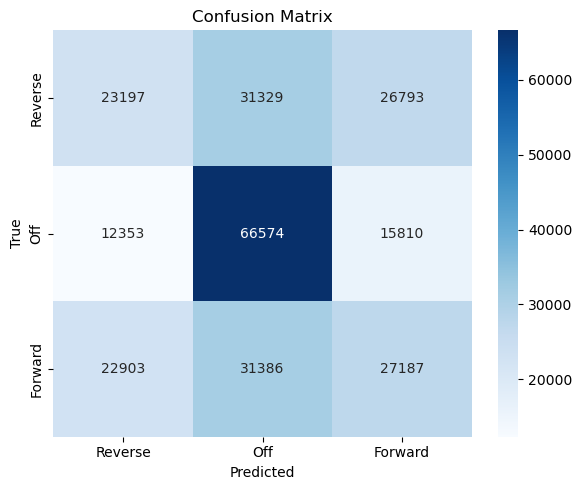

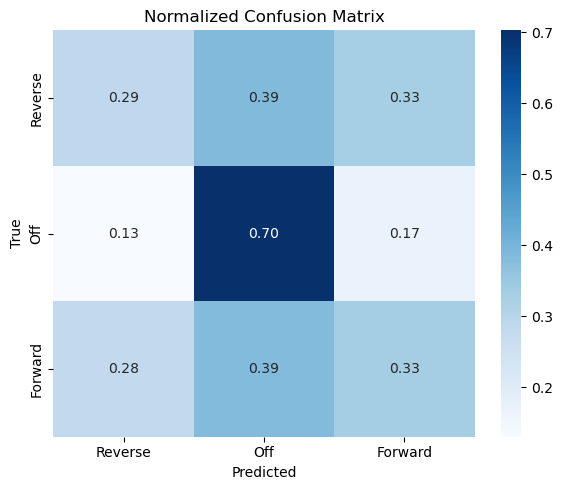

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# --- Predictions ---
y_pred = model.predict(X_te_s, batch_size=8192).argmax(axis=1)

# --- Classification report ---
print(classification_report(y_te, y_pred, digits=4))

# --- Confusion matrix ---
cm = confusion_matrix(y_te, y_pred)
labels = ["Reverse", "Off", "Forward"]

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

# --- Normalized confusion matrix ---
cm_norm = cm.astype("float") / cm.sum(axis=1)[:, None]
plt.figure(figsize=(6,5))
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix")
plt.tight_layout()
plt.show()


## Random Forest

In [44]:
# Random Forest (physics-aware): features × wrench → classes (reverse/off/forward)

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# --- Config ---
coil_target = "current_7"  # change as needed
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]
thr = 5.0  # A

# --- Labels: reverse=0, off=1, forward=2 ---
y_cont = df[coil_target].astype(float).values
y_cls = np.where(y_cont < -thr, 0, np.where(y_cont > thr, 2, 1)).astype(int)

# --- Physics-aware interaction features: Z = [X*Fx, X*Fy, ..., X*Tz] ---
Xf = df[feature_cols].astype(float).values
Wm = df[WRENCH_COLS].astype(float).values
Z = np.hstack([Xf * Wm[:, [i]] for i in range(Wm.shape[1])])  # shape: (n_samples, 6*n_features)

# --- Split ---
X_tr, X_te, y_tr, y_te = train_test_split(Z, y_cls, test_size=0.2, random_state=42, stratify=y_cls)

# --- Class weights (inverse frequency) ---
u, c = np.unique(y_tr, return_counts=True)
class_weight = {int(k): float(len(y_tr)/v) for k, v in zip(u, c)}

# --- Train Random Forest ---
rf = RandomForestClassifier(
    n_estimators=400,
    max_depth=12,
    min_samples_leaf=20,
    n_jobs=-1,
    class_weight=class_weight,  # or "balanced_subsample"
    random_state=42,
    verbose=1
)
rf.fit(X_tr, y_tr)

# --- Evaluate ---
y_pred = rf.predict(X_te)
print(classification_report(y_te, y_pred, digits=4))
print(confusion_matrix(y_te, y_pred))


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:  4.7min finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.6s


              precision    recall  f1-score   support

           0     0.6155    0.4999    0.5517     81319
           1     0.6059    0.7665    0.6768     94737
           2     0.6001    0.5276    0.5615     81476

    accuracy                         0.6068    257532
   macro avg     0.6072    0.5980    0.5967    257532
weighted avg     0.6071    0.6068    0.6008    257532

[[40655 23604 17060]
 [10531 72617 11589]
 [14864 23624 42988]]


[Parallel(n_jobs=16)]: Done 400 out of 400 | elapsed:    1.5s finished


              precision    recall  f1-score   support

           0     0.6155    0.4999    0.5517     81319
           1     0.6059    0.7665    0.6768     94737
           2     0.6001    0.5276    0.5615     81476

    accuracy                         0.6068    257532
   macro avg     0.6072    0.5980    0.5967    257532
weighted avg     0.6071    0.6068    0.6008    257532



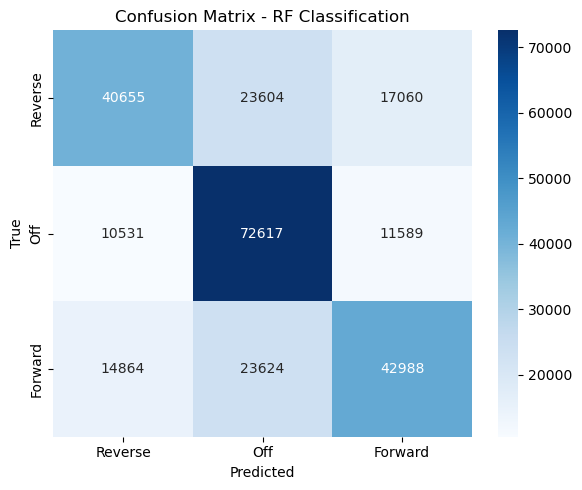

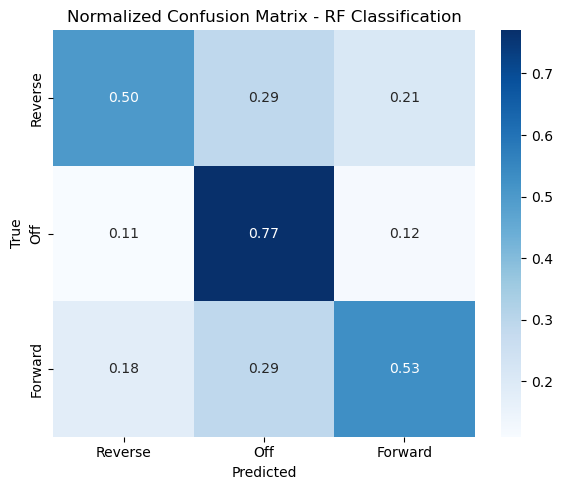

In [46]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# --- Report ---
print(classification_report(y_te, y_pred, digits=4))

# --- Confusion matrix ---
cm = confusion_matrix(y_te, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Reverse","Off","Forward"],
            yticklabels=["Reverse","Off","Forward"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - RF Classification")
plt.tight_layout()
plt.show()

cm_norm = confusion_matrix(y_te, y_pred, normalize='true')
plt.figure(figsize=(6,5))
sns.heatmap(np.round(cm_norm, 2), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=["Reverse","Off","Forward"],
            yticklabels=["Reverse","Off","Forward"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix - RF Classification")
plt.tight_layout()
plt.show()


## SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Inputs ---
# X_feat: features
# W: wrench matrix
# y_cat: categorical currents (-1, 0, 1)
threshold = 5.0

coil_name = "current_16"  # pick the coil you want
y_cat = I_class[coil_name]


# Prepare design matrix: gamma_row_params predicted directly from X_feat by a linear regressor before SVM
# But here for simplicity we just fit SVM directly on combined [X_feat, W] because SVM doesn’t know physics
X_full = np.hstack([X_feat.values, W.values])

# --- Train/test split ---
from sklearn.model_selection import train_test_split
X_tr, X_te, y_tr, y_te = train_test_split(X_full, y_cat.values, test_size=0.2, random_state=42)

# --- Train One-vs-Rest SVM ---
svm_clf = OneVsRestClassifier(SVC(kernel='rbf', C=1.0, gamma='scale'))
svm_clf.fit(X_tr, y_tr)

# --- Predictions ---
y_pred = svm_clf.predict(X_te)

# --- Report ---
print(classification_report(y_te, y_pred))

# --- Confusion Matrix ---
cm = confusion_matrix(y_te, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Reverse","Off","Forward"],
            yticklabels=["Reverse","Off","Forward"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - SVM Classification")
plt.show()

# --- Normalized Confusion Matrix ---
cm_norm = confusion_matrix(y_te, y_pred, normalize='true')
sns.heatmap(np.round(cm_norm, 2), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=["Reverse","Off","Forward"],
            yticklabels=["Reverse","Off","Forward"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix - SVM Classification")
plt.show()


## Neural Network

I0000 00:00:1755208808.269859  331415 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2285 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3050 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


Epoch 1/20


I0000 00:00:1755208809.433056  333029 service.cc:152] XLA service 0x7aeecc00bb40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1755208809.433072  333029 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2025-08-15 01:30:09.448791: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1755208809.536157  333029 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-08-15 01:30:10.558039: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_431', 112 bytes spill stores, 112 bytes spill loads

2025-08-15 01:30:10.672201: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusi

 153/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 999us/step - accuracy: 0.3758 - loss: 5.5914

I0000 00:00:1755208812.683992  333029 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2258/2264 ━━━━━━━━━━━━━━━━━━━━ 0s 940us/step - accuracy: 0.4212 - loss: 1.8278

2025-08-15 01:30:16.259257: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_429', 616 bytes spill stores, 616 bytes spill loads



2264/2264 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.4239 - loss: 1.2720 - val_accuracy: 0.4260 - val_loss: 1.0922
Epoch 2/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4380 - loss: 1.0723 - val_accuracy: 0.4493 - val_loss: 1.0467
Epoch 3/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4497 - loss: 1.0400 - val_accuracy: 0.4561 - val_loss: 1.0320
Epoch 4/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4579 - loss: 1.0272 - val_accuracy: 0.4641 - val_loss: 1.0194
Epoch 5/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4663 - loss: 1.0185 - val_accuracy: 0.4684 - val_loss: 1.0144
Epoch 6/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4695 - loss: 1.0139 - val_accuracy: 0.4710 - val_loss: 1.0107
Epoch 7/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4715 - loss: 1.0109 - val_accuracy: 0.4678 - val_loss: 1.0109
Epoch 8/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4728 - loss: 1.0082 - val_accura

/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

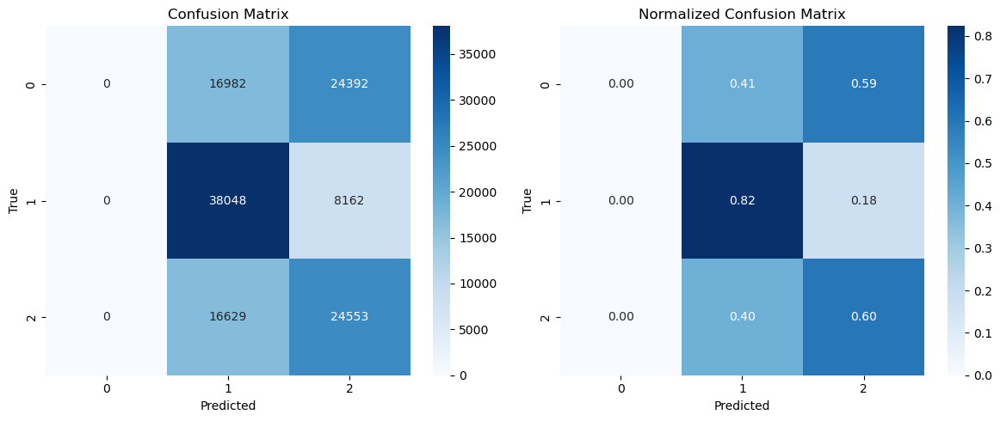

In [56]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# --- Model ---
def build_single_coil_classifier(n_features: int, n_classes=3):
    feat_in = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(6,), name="wrench")

    # Feature → gamma_row
    x = layers.Dense(64, activation="relu")(feat_in)
    x = layers.Dense(32, activation="relu")(x)
    gamma_row_flat = layers.Dense(6, activation="linear")(x)

    # Multiply gamma_row × wrench
    wrench_vec = layers.Reshape((6, 1))(wrench_in)
    gamma_row_mat = layers.Reshape((1, 6))(gamma_row_flat)
    current_pred = layers.Lambda(lambda t: tf.matmul(t[0], t[1]))([gamma_row_mat, wrench_vec])
    current_pred = layers.Reshape(())(current_pred)

    # Classification head
    out = layers.Dense(n_classes, activation="softmax")(layers.Reshape((1,))(current_pred))

    model = keras.Model(inputs=[feat_in, wrench_in], outputs=out)
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model

# --- Data prep ---
coil_name = "current_1"  # change for other coils
y_cat = I_class[coil_name].values

from sklearn.model_selection import train_test_split
X_tr, X_va, W_tr, W_va, y_tr, y_va = train_test_split(
    X_feat.values, W.values, y_cat,
    test_size=0.1, random_state=42, stratify=y_cat
)

# --- Train ---
model = build_single_coil_classifier(X_feat.shape[1], n_classes=3)
history = model.fit(
    [X_tr, W_tr], y_tr,
    validation_data=([X_va, W_va], y_va),
    epochs=20,
    batch_size=512,
    verbose=1
)

# --- Predict ---
y_pred_prob = model.predict([X_va, W_va], verbose=0)
y_pred = np.argmax(y_pred_prob, axis=1)

# --- Reports ---
print(classification_report(y_va, y_pred, digits=4))

cm = confusion_matrix(y_va, y_pred)
cm_norm = cm.astype(float) / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[0])
axes[0].set_title("Confusion Matrix")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues", ax=axes[1])
axes[1].set_title("Normalized Confusion Matrix")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()


/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000     41374
           1     0.4991    0.7104    0.5863     46210
           2     0.3924    0.6002    0.4745     41182

    accuracy                         0.4469    128766
   macro avg     0.2972    0.4369    0.3536    128766
weighted avg     0.3046    0.4469    0.3622    128766



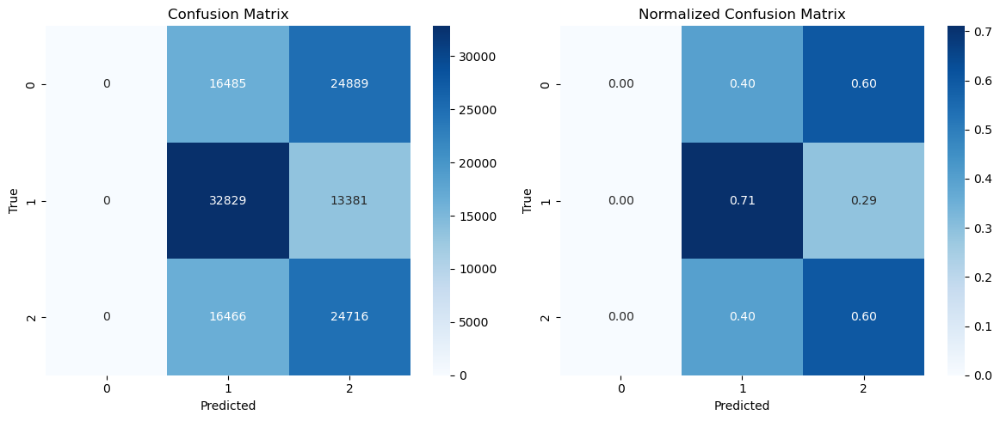

In [61]:
# --- Predict ---
y_pred_prob = model.predict([X_va, W_va], verbose=0)
y_pred = np.argmax(y_pred_prob, axis=1)

# --- Reports ---
print(classification_report(y_va, y_pred, digits=4))

cm = confusion_matrix(y_va, y_pred)
cm_norm = cm.astype(float) / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[0])
axes[0].set_title("Confusion Matrix")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues", ax=axes[1])
axes[1].set_title("Normalized Confusion Matrix")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━
┃ Layer (type)                            ┃ Output Shape                      ┃               Param # ┃ Connected t
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━
│ features (InputLayer)                   │ (None, 21)                        │                     0 │ -          
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_4 (Dense)                         │ (None, 64)                        │                 1,408 │ features[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_5 (Dense)                         │ (None, 32)                        │                 2,080 │ dense_4[0][
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_6 (Dense)                         │ (None, 6)                         │                   198 │ dense_5[0][
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ wrench (InputLayer)                     │ (None, 6)                         │                     0 │ -          
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ reshape_5 (Reshape)                     │ (None, 1, 6)                      │                     0 │ dense_6[0][
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ reshape_4 (Reshape)                     │ (None, 6, 1)                      │                     0 │ wrench[0][0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ lambda_1 (Lambda)                       │ (None, 1, 1)                      │                     0 │ reshape_5[0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ reshape_6 (Reshape)                     │ (None)                            │                     0 │ lambda_1[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ reshape_7 (Reshape)                     │ (None, 1)                         │                     0 │ reshape_6[0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_7 (Dense)                         │ (None, 3)                         │                     6 │ reshape_7[0
└─────────────────────────────────────────┴───────────────────────────────────┴───────────────────────┴────────────

 Total params: 11,078 (43.28 KB)

 Trainable params: 3,692 (14.42 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,386 (28.86 KB)

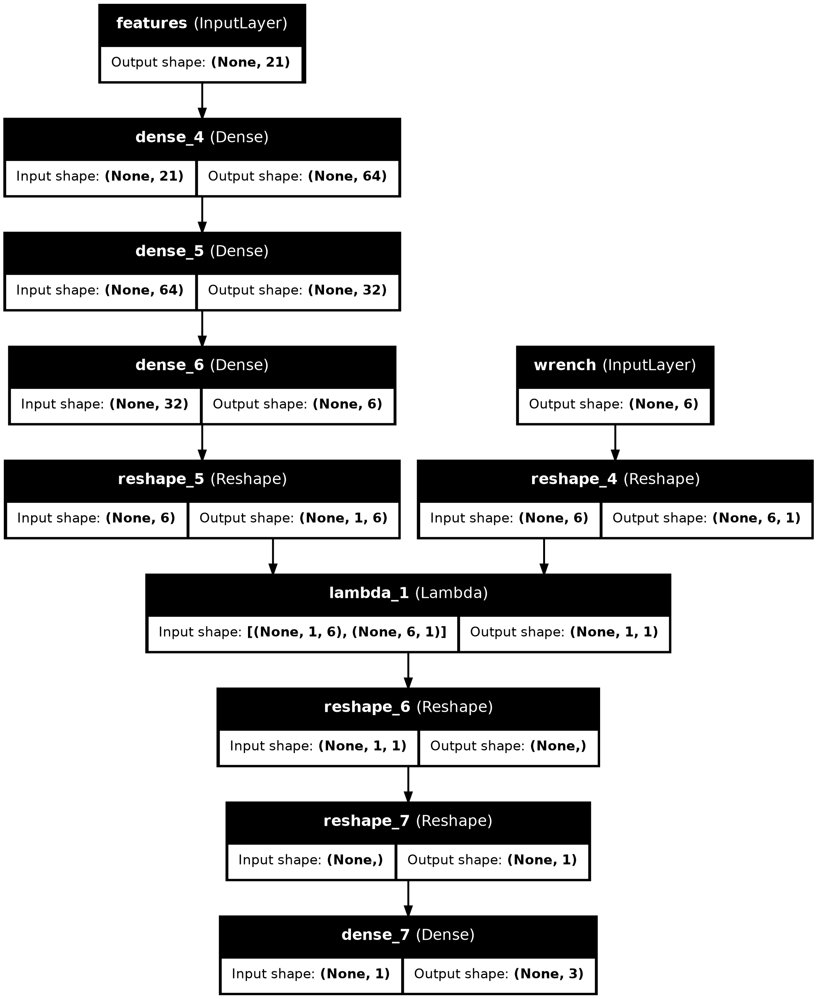

In [62]:
# After building the model as `model = build_single_coil_classifier_clean(n_features=X_tr_n.shape[1], n_classes=3)`

# 1) Console summary
model.summary(line_length=140, expand_nested=True)

# 2) Graph image (needs pydot + graphviz installed)
from tensorflow.keras.utils import plot_model
plot_model(
    model,
    to_file="coil_classifier_physics.png",
    show_shapes=True,
    show_layer_names=True,
    dpi=180,
    rankdir="TB"
)


In [69]:
# Drop-in replacement for your build function (physics-aware, sign-locked head)
def build_single_coil_classifier_clean(n_features: int, n_classes=3, wrench_dim=7, tau=1.0):
    from tensorflow import keras
    from tensorflow.keras import layers
    import tensorflow as tf

    feat_in   = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(wrench_dim,), name="wrench")  # 7 if you added bias, else 6

    x = layers.Dense(128, activation="relu")(feat_in)
    x = layers.Dense(64,  activation="relu")(x)

    # predict gamma coefficients (match wrench_dim)
    gamma_row = layers.Dense(wrench_dim, activation="linear", name="gamma_row")(x)

    # physics: dot(gamma_row, wrench)
    prod = layers.Multiply(name="hadamard")([gamma_row, wrench_in])           # (None, D)
    s = layers.Lambda(lambda t: tf.reduce_sum(t, axis=-1), name="dot_sum")(prod)  # (None,)
    s = layers.Reshape((1,), name="s_scalar")(s)

    # physics-aware logits: [-s/tau, -|s|/tau, +s/tau]  → softmax
    scale = 1.0 / float(tau)
    rev = layers.Lambda(lambda t: -scale * t,           name="logit_reverse")(s)
    off = layers.Lambda(lambda t: -scale * tf.abs(t),   name="logit_off")(s)
    fwd = layers.Lambda(lambda t:  scale * t,           name="logit_forward")(s)
    logits = layers.Concatenate(name="logits")([rev, off, fwd])
    out = layers.Activation("softmax", name="probs")(logits)

    model = keras.Model([feat_in, wrench_in], out, name="coil_cls_physics")
    model.compile(optimizer=keras.optimizers.Adam(1e-3),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model


In [70]:
import numpy as np
from sklearn.model_selection import train_test_split

# features & wrench
X = X_feat.values.astype("float32")
W6 = W.values.astype("float32")

# normalize on train only
X_tr, X_va, W_tr, W_va, y_tr, y_va = train_test_split(
    X, W6, I_class[coil_name].values.astype("int32"),
    test_size=0.1, random_state=42, stratify=I_class[coil_name].values
)

eps=1e-8
Xm, Xs = X_tr.mean(0), X_tr.std(0)+eps
Wm, Ws = W_tr.mean(0), W_tr.std(0)+eps

X_tr_n = (X_tr - Xm)/Xs
X_va_n = (X_va - Xm)/Xs
W_tr_n = (W_tr - Wm)/Ws
W_va_n = (W_va - Wm)/Ws

# add bias term = 1.0
W_tr_n = np.hstack([W_tr_n, np.ones((len(W_tr_n),1), dtype=np.float32)])
W_va_n = np.hstack([W_va_n, np.ones((len(W_va_n),1), dtype=np.float32)])


Epoch 1/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.3486 - loss: 1.0758 - val_accuracy: 0.3719 - val_loss: 1.0432
Epoch 2/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.3888 - loss: 1.0231 - val_accuracy: 0.4013 - val_loss: 1.0058
Epoch 3/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4116 - loss: 0.9882 - val_accuracy: 0.4176 - val_loss: 0.9781
Epoch 4/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4224 - loss: 0.9658 - val_accuracy: 0.4248 - val_loss: 0.9588
Epoch 5/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4301 - loss: 0.9514 - val_accuracy: 0.4315 - val_loss: 0.9448
Epoch 6/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4354 - loss: 0.9406 - val_accuracy: 0.4343 - val_loss: 0.9386
Epoch 7/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4381 - loss: 0.9339 - val_accuracy: 0.4365 - val_loss: 0.9303
Epoch 8/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4401 - loss: 0.9288 - 

/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/home/alireza-linux/.local/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

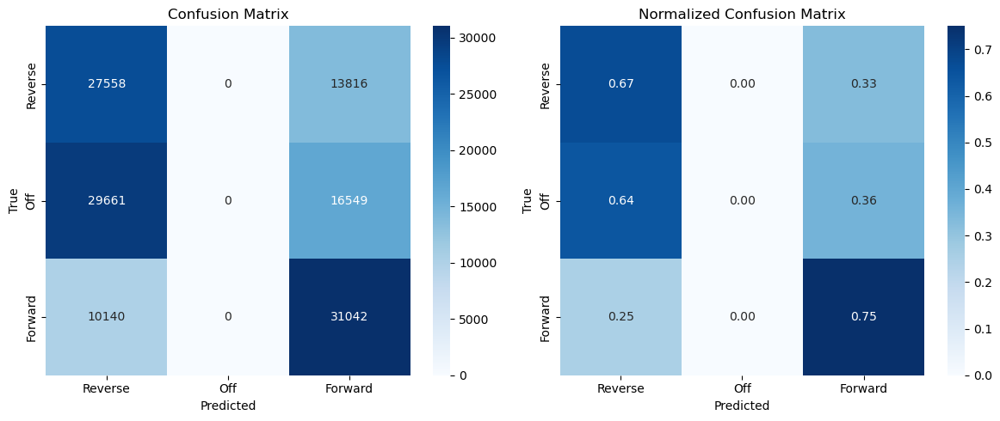

In [71]:
model = build_single_coil_classifier_clean(n_features=X_tr_n.shape[1], n_classes=3)

hist = model.fit(
    [X_tr_n, W_tr_n], y_tr,
    validation_data=([X_va_n, W_va_n], y_va),
    epochs=25, batch_size=512, verbose=1
)

# predictions + reports
import numpy as np, seaborn as sns, matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict([X_va_n, W_va_n], batch_size=4096, verbose=0).argmax(axis=1)

# class distribution — catch "never predicts 0" fast
vals, counts = np.unique(y_pred, return_counts=True)
print("Predicted class counts:", dict(zip(vals, counts)))

print(classification_report(y_va, y_pred, digits=4))

cm = confusion_matrix(y_va, y_pred)
cmn = confusion_matrix(y_va, y_pred, normalize='true')

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Reverse","Off","Forward"],
            yticklabels=["Reverse","Off","Forward"])
plt.title("Confusion Matrix"); plt.xlabel("Predicted"); plt.ylabel("True")

plt.subplot(1,2,2)
sns.heatmap(np.round(cmn,2), annot=True, fmt=".2f", cmap="Blues",
            xticklabels=["Reverse","Off","Forward"],
            yticklabels=["Reverse","Off","Forward"])
plt.title("Normalized Confusion Matrix"); plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout(); plt.show()


In [72]:
# labels -> one-hot
from tensorflow.keras.utils import to_categorical
Y_tr = to_categorical(y_tr.astype(int), num_classes=3)
Y_va = to_categorical(y_va.astype(int), num_classes=3)

In [73]:
# compile (use categorical CE now)
model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)


In [74]:
# train with one-hot targets
history = model.fit(
    [X_tr_n, W_tr_n], Y_tr,
    validation_data=([X_va_n, W_va_n], Y_va),
    epochs=25,
    batch_size=512,
    verbose=1
)


Epoch 1/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.4553 - loss: 0.8963 - val_accuracy: 0.4547 - val_loss: 0.9006
Epoch 2/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4557 - loss: 0.8956 - val_accuracy: 0.4552 - val_loss: 0.8981
Epoch 3/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4562 - loss: 0.8950 - val_accuracy: 0.4535 - val_loss: 0.9003
Epoch 4/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4563 - loss: 0.8943 - val_accuracy: 0.4550 - val_loss: 0.8972
Epoch 5/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4568 - loss: 0.8939 - val_accuracy: 0.4564 - val_loss: 0.8966
Epoch 6/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4571 - loss: 0.8934 - val_accuracy: 0.4552 - val_loss: 0.8963
Epoch 7/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4568 - loss: 0.8929 - val_accuracy: 0.4558 - val_loss: 0.8954
Epoch 8/25
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.4570 - loss: 0.8924 - 

In [75]:
# predict → class ids
probs  = model.predict([X_va_n, W_va_n], batch_size=4096, verbose=0)
y_pred = probs.argmax(axis=1)


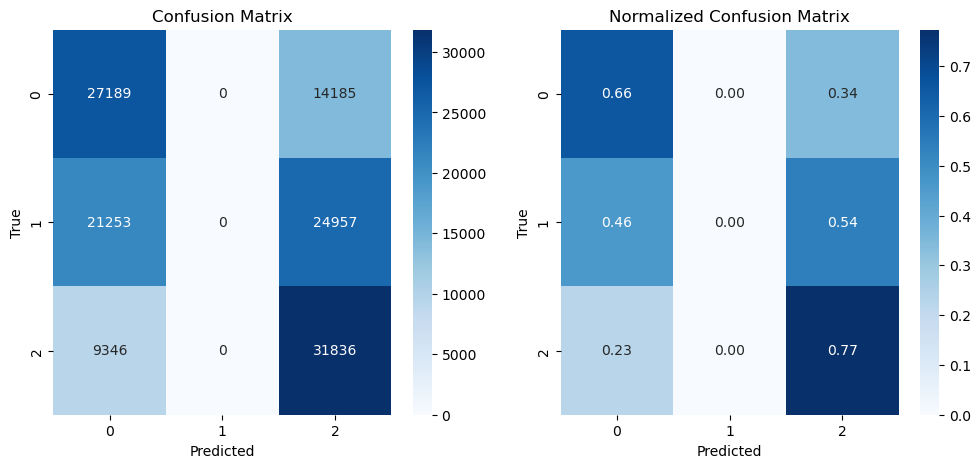

In [76]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# true labels from one-hot back to integers
y_true = np.argmax(Y_va, axis=1)

cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[0])
axes[0].set_title("Confusion Matrix")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues", ax=axes[1])
axes[1].set_title("Normalized Confusion Matrix")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.show()


# Model Definition

In [98]:
# TensorFlow surrogate + permutation importance for features → currents
# Assumes X_feat (DataFrame of features) and I (DataFrame of 16 currents) already exist.

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# --- Prep ---
FEATURE_NAMES = list(X_feat.columns)
X = X_feat.values.astype(np.float32)
Y = I.values.astype(np.float32)

# --- Model builder: small, fast MLP with in-model normalization ---
def build_surrogate(input_dim, output_dim):
    norm = layers.Normalization()
    norm.adapt(X)  # uses current X; move outside if you want to reuse
    inp = keras.Input(shape=(input_dim,))
    x = norm(inp)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dense(64, activation="relu")(x)
    out = layers.Dense(output_dim, activation="linear")(x)
    model = keras.Model(inp, out)
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss="mse")
    return model

# --- Train (quick defaults; tune later) ---
def train_surrogate(model, X, Y, epochs=20, batch_size=512, val_split=0.1):
    history = model.fit(X, Y, epochs=epochs, batch_size=batch_size, validation_split=val_split, verbose=1)
    return history

# --- Eval helper: mean MSE across outputs ---
def mse_loss(model, X, Y, batch_size=4096):
    preds = model.predict(X, batch_size=batch_size, verbose=0)
    return float(np.mean((preds - Y) ** 2))

# --- Permutation importance ---
def permutation_importance(model, X, Y, feature_names, n_repeats=5, rng_seed=42, batch_size=4096):
    rng = np.random.default_rng(rng_seed)
    base = mse_loss(model, X, Y, batch_size=batch_size)
    importances = np.zeros(len(feature_names), dtype=np.float64)

    X_work = X.copy()
    for j in range(len(feature_names)):
        deltas = []
        for _ in range(n_repeats):
            col = X_work[:, j].copy()
            rng.shuffle(X_work[:, j])             # permute one feature
            m = mse_loss(model, X_work, Y, batch_size=batch_size)
            deltas.append(m - base)
            X_work[:, j] = col                    # restore
        importances[j] = np.mean(deltas)

    imp_df = pd.DataFrame({"feature": feature_names, "perm_importance": importances})
    imp_df.sort_values("perm_importance", ascending=False, inplace=True)
    imp_df.reset_index(drop=True, inplace=True)
    return imp_df, base




In [51]:
model = build_surrogate(X.shape[1], Y.shape[1])
_ = train_surrogate(model, X, Y, epochs=20)
imp_df, base_mse = permutation_importance(model, X, Y, FEATURE_NAMES, n_repeats=5)
print("Baseline MSE:", base_mse)
print(imp_df.head(15))


Epoch 1/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 52.0252 - val_loss: 55.1333
Epoch 2/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 920us/step - loss: 51.3532 - val_loss: 54.8015
Epoch 3/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 925us/step - loss: 51.0739 - val_loss: 54.6180
Epoch 4/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 926us/step - loss: 50.9117 - val_loss: 54.5261
Epoch 5/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 928us/step - loss: 50.8116 - val_loss: 54.4648
Epoch 6/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 897us/step - loss: 50.7457 - val_loss: 54.4131
Epoch 7/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 935us/step - loss: 50.6926 - val_loss: 54.4349
Epoch 8/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 923us/step - loss: 50.6505 - val_loss: 54.3543
Epoch 9/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 910us/step - loss: 50.6167 - val_loss: 54.3554
Epoch 10/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 939us/step - loss: 50.5870 - val_loss: 54.3341
Epoch 11/20
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 908us/step - loss: 50.5601 - val_lo

Model: "gamma_inv_wrench_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━
┃ Layer (type)                            ┃ Output Shape                      ┃               Param # ┃ Connected t
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━
│ features (InputLayer)                   │ (None, 21)                        │                     0 │ -          
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_10 (Dense)                        │ (None, 128)                       │                 2,816 │ features[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_11 (Dense)                        │ (None, 64)                        │                 8,256 │ dense_10[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ gamma_flat (Dense)                      │ (None, 96)                        │                 6,240 │ dense_11[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ wrench (InputLayer)                     │ (None, 6)                         │                     0 │ -          
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ Gamma_inv (Reshape)                     │ (None, 16, 6)                     │                     0 │ gamma_flat[
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ wrench_vec (Reshape)                    │ (None, 6, 1)                      │                     0 │ wrench[0][0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ matmul (Lambda)                         │ (None, 16, 1)                     │                     0 │ Gamma_inv[0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ currents (Reshape)                      │ (None, 16)                        │                     0 │ matmul[0][0
└─────────────────────────────────────────┴───────────────────────────────────┴───────────────────────┴────────────

 Total params: 17,312 (67.62 KB)

 Trainable params: 17,312 (67.62 KB)

 Non-trainable params: 0 (0.00 B)

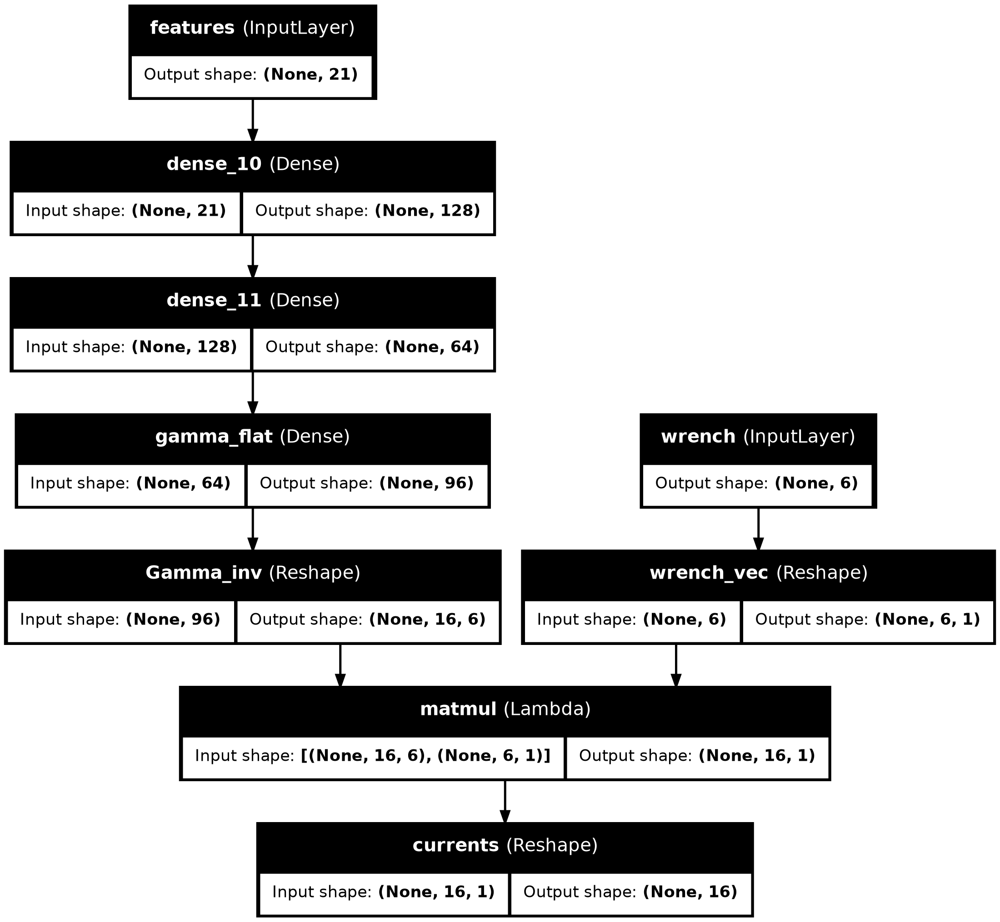

In [54]:
# Build + inspect model structure
model = build_gamma_inv_model(n_features=X_feat.shape[1])

# 1) Console summary (layers, shapes, params)
model.summary(line_length=140, expand_nested=True)

# 2) Graph image (requires pydot + graphviz installed)
from tensorflow.keras.utils import plot_model
plot_model(
    model,
    to_file="gamma_inv_model.png",
    show_shapes=True,
    show_layer_names=True,
    dpi=180,
    rankdir="TB"
)


In [100]:
# Fit the physics-aware model (features → Γ⁻¹ → × wrench → currents)

import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras

# 0) Numpy arrays (float32)
X_np = X_feat.values.astype(np.float32)
W_np = W[WRENCH_COLS].values.astype(np.float32)   # order matters
Y_np = I.values.astype(np.float32)

# 1) Train/val split (keep pairs aligned)
X_tr, X_va, W_tr, W_va, Y_tr, Y_va = train_test_split(
    X_np, W_np, Y_np, test_size=0.1, random_state=42
)

# 2) Build model
model = build_gamma_inv_model(n_features=X_np.shape[1])

# 3) Callbacks + fit (shows progress)
cbs = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-5, verbose=1),
]
history = model.fit(
    [X_tr, W_tr], Y_tr,
    validation_data=([X_va, W_va], Y_va),
    epochs=50,
    batch_size=512,
    verbose=1,
    callbacks=cbs
)


Epoch 1/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 53.0949 - val_loss: 52.7278 - learning_rate: 0.0010
Epoch 2/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 963us/step - loss: 52.7527 - val_loss: 52.7106 - learning_rate: 0.0010
Epoch 3/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 993us/step - loss: 52.7468 - val_loss: 52.7377 - learning_rate: 0.0010
Epoch 4/50
2248/2264 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - loss: 52.7318
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 970us/step - loss: 52.7430 - val_loss: 52.7159 - learning_rate: 0.0010
Epoch 5/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - loss: 52.7298 - val_loss: 52.7141 - learning_rate: 5.0000e-04
Epoch 6/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 998us/step - loss: 52.7284 - val_loss: 52.6982 - learning_rate: 5.0000e-04
Epoch 7/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 977us/step - loss: 52.7279 - val_loss: 52.6986 - learning_rate: 5.0000e-04
Epoch 8/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━

KeyboardInterrupt: 

2025-08-14 17:57:52.028007: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_26', 28 bytes spill stores, 28 bytes spill loads

2025-08-14 17:57:52.058661: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_26', 124 bytes spill stores, 124 bytes spill loads

2025-08-14 17:57:52.691969: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_19', 12 bytes spill stores, 12 bytes spill loads

2025-08-14 17:57:52.821105: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_19', 132 bytes spill stores, 132 bytes spill loads

2025-08-14 17:57:53.330854: I external/local

Test MSE (overall): 52.77633285522461
Test MSE per current (1..16): [60.08917  65.209206 62.492992 57.429333 62.067085 65.056435 59.990154
 53.816032 50.694252 50.31039  47.625244 44.664364 42.366886 42.438385
 41.093193 39.05743 ]


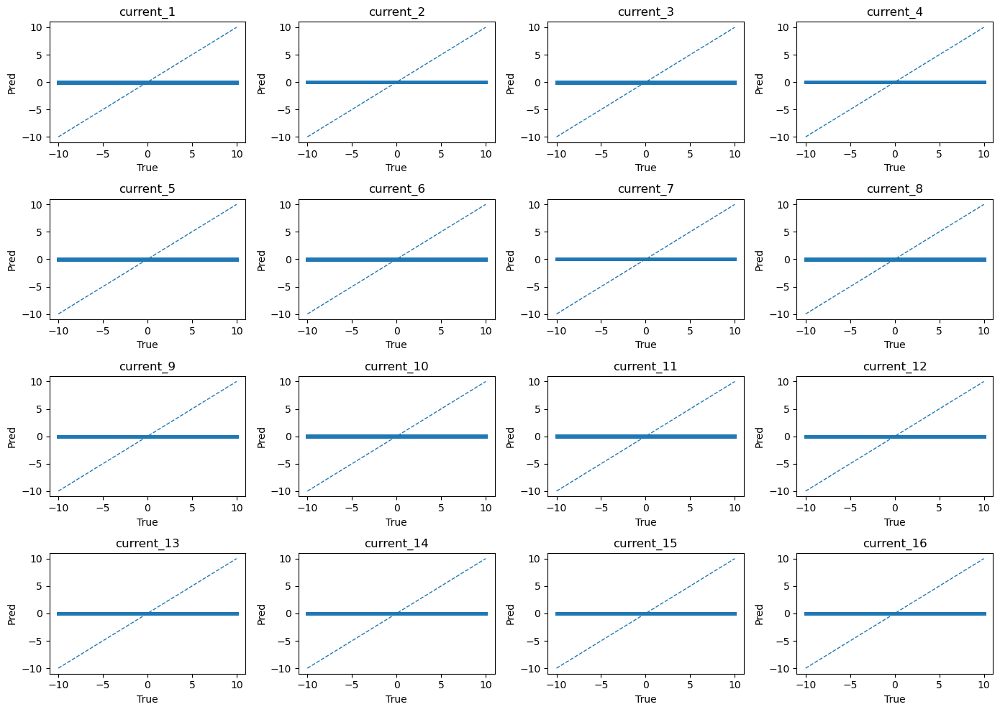

In [ ]:
# Predict on a held-out test split and plot results

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# 1) Make a disjoint test split from the full arrays (no retrain)
X_te_split, X_te, W_te_split, W_te, Y_te_split, Y_te = train_test_split(
    X_np, W_np, Y_np, test_size=0.10, random_state=7
)

# 2) Predict
Y_pred = model.predict([X_te, W_te], batch_size=4096, verbose=0)

# 3) Quick metrics
mse_overall = np.mean((Y_pred - Y_te) ** 2)
mse_per_current = np.mean((Y_pred - Y_te) ** 2, axis=0)
print("Test MSE (overall):", float(mse_overall))
print("Test MSE per current (1..16):", np.round(mse_per_current, 6))

# 4) Parity plots (y_pred vs y_true) for all 16 currents
n_out = Y_te.shape[1]
cols = 4
rows = int(np.ceil(n_out / cols))
fig, axes = plt.subplots(rows, cols, figsize=(14, 10))
axes = axes.ravel()

minv = np.minimum(Y_te.min(), Y_pred.min())
maxv = np.maximum(Y_te.max(), Y_pred.max())

for i in range(n_out):
    ax = axes[i]
    ax.scatter(Y_te[:, i], Y_pred[:, i], s=6, alpha=0.6)
    ax.plot([minv, maxv], [minv, maxv], linestyle="--", linewidth=1)
    ax.set_title(f"current_{i+1}")
    ax.set_xlabel("True")
    ax.set_ylabel("Pred")

# Hide any unused subplots
for j in range(n_out, rows * cols):
    fig.delaxes(axes[j])

fig.tight_layout()
plt.show()


### REgression test

In [101]:
def build_linear_gamma_inv_model(n_features: int):
    import tensorflow as tf
    from tensorflow import keras
    from tensorflow.keras import layers

    feat_in = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(6,), name="wrench")

    # Linear regression head (no hidden layers)
    gamma_flat = layers.Dense(16 * 6, activation="linear", name="gamma_flat")(feat_in)
    gamma = layers.Reshape((16, 6), name="Gamma_inv")(gamma_flat)

    # Physics step: multiply Γ⁻¹ by wrench
    wrench_vec = layers.Reshape((6, 1), name="wrench_vec")(wrench_in)
    currents_3d = layers.Lambda(lambda t: tf.matmul(t[0], t[1]), name="matmul")([gamma, wrench_vec])
    currents = layers.Reshape((16,), name="currents")(currents_3d)

    model = keras.Model(inputs=[feat_in, wrench_in], outputs=currents, name="linear_gamma_inv_model")
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss="mse")
    return model

# Example usage:
model = build_linear_gamma_inv_model(X_np.shape[1])
model.fit([X_tr, W_tr], Y_tr, validation_data=([X_va, W_va], Y_va), epochs=50, batch_size=512, verbose=1)


Epoch 1/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 58.7250 - val_loss: 52.8202
Epoch 2/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 877us/step - loss: 52.8534 - val_loss: 52.8348
Epoch 3/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 879us/step - loss: 52.8581 - val_loss: 52.8104
Epoch 4/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 887us/step - loss: 52.8560 - val_loss: 52.8738
Epoch 5/50
 924/2264 ━━━━━━━━━━━━━━━━━━━━ 1s 764us/step - loss: 52.8295

KeyboardInterrupt: 

/home/alireza-linux/.local/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [18:34:33] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  bst.update(dtrain, iteration=i, fobj=obj)
/home/alireza-linux/.local/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [18:34:33] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "predictor" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/tmp/ipykernel_32476/155189183.py:39: UserWarning: [18:34:35] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  scores = model.get_booster().get_score(importance_type="gain")
/home/alireza-linux/.local/lib/python3.12/site-packages/xgb


Top 15 features by mean gain across all currents:
               current_1    current_2    current_3     current_4    current_5  \
angle_1_cos  9227.342773  3958.745605  7312.374023  11974.037109  4577.690918   
angle_1_sin  3001.683838  5423.379883  5622.176758   3570.340576  4379.612793   
angle_2_cos  3481.883057  1589.193604  7316.379395   6157.527344  4567.917969   
angle_2_sin  1060.293579  2600.418457  3919.321289   2025.769775  4705.348145   
cos_w1_s135  8873.539062  1505.034058  3097.901855   3291.717285  1898.320435   
angle_3_cos  3859.207520  3118.235840  2861.015869   2978.646484  2998.513672   
cos_w1_s45   2322.678223  1449.155273  3251.983398   3623.431641  4333.874023   
sin_w1_s45   1158.078979  3711.910889  2073.741943   1096.911743  2153.693604   
sin_w1_s135  2402.998535  1940.892212  1100.024048   1271.551147  1152.959473   
angle_3_sin  1558.882568  2137.379150  2007.006714   1648.984497  1992.949341   
X             782.993835  1137.330444   862.967285   1036.

/tmp/ipykernel_32476/155189183.py:39: UserWarning: [18:35:18] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  scores = model.get_booster().get_score(importance_type="gain")


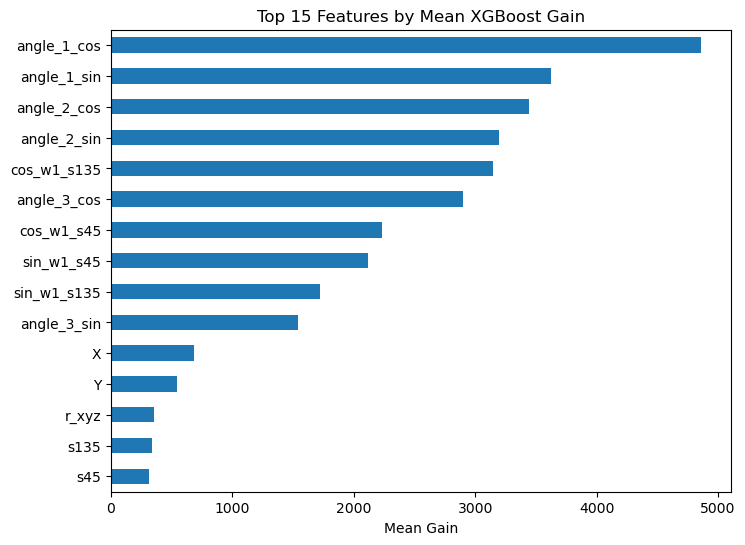

In [67]:
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
import re

# --- Prepare column lists ---
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]

current_cols = sorted(
    [c for c in df.columns if c.startswith("current_")],
    key=lambda x: int(re.search(r"\d+", x).group())
)

feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

X_feat = df[feature_cols]
I = df[current_cols]

# --- XGBoost importance loop ---
xgb_importances = pd.DataFrame(0.0, index=feature_cols, columns=current_cols)

for curr_col in current_cols:
    model = xgb.XGBRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=4,
        subsample=0.8,
        colsample_bytree=0.8,
        tree_method="gpu_hist",        # GPU train
        predictor="gpu_predictor",     # GPU predict
        random_state=42,
        eval_metric="rmse"             # For early stopping
    )
    model.fit(
        X_feat, I[curr_col],
        eval_set=[(X_feat, I[curr_col])],
        verbose=False
    )
    scores = model.get_booster().get_score(importance_type="gain")
    for feat, val in scores.items():
        xgb_importances.loc[feat, curr_col] = val

# --- Aggregate and display ---
xgb_importances['mean_gain'] = xgb_importances.mean(axis=1)
xgb_importances.sort_values('mean_gain', ascending=False, inplace=True)

print("\nTop 15 features by mean gain across all currents:")
print(xgb_importances.head(15))

# --- Plot ---
plt.figure(figsize=(8, 6))
xgb_importances['mean_gain'].head(15).plot(kind='barh')
plt.gca().invert_yaxis()
plt.title("Top 15 Features by Mean XGBoost Gain")
plt.xlabel("Mean Gain")
plt.show()


### One coil prediction

In [102]:
# --- Choose the coil ---
coil_target = "current_7"  # change this to the coil you want

# --- Define column sets ---
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

# --- Build input and target arrays ---
X_feat = df[feature_cols].astype("float32")             # model inputs (pose/features)
W = df[WRENCH_COLS].astype("float32")                   # wrench vectors
y_target = df[coil_target].astype("float32")            # one coil's current

print(f"Target coil: {coil_target}")
print(f"Features: {len(feature_cols)} cols")
print(f"Sample shape: X_feat={X_feat.shape}, W={W.shape}, y_target={y_target.shape}")


Target coil: current_7
Features: 21 cols
Sample shape: X_feat=(1287658, 21), W=(1287658, 6), y_target=(1287658,)


In [103]:
def build_single_coil_gamma_inv_model(n_features: int):
    import tensorflow as tf
    from tensorflow import keras
    from tensorflow.keras import layers

    feat_in = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(6,), name="wrench")

    # Simple dense head: features → (1x6) coefficients
    x = layers.Dense(64, activation="relu")(feat_in)
    x = layers.Dense(32, activation="relu")(x)
    gamma_row_flat = layers.Dense(6, activation="linear", name="gamma_row")(x)  # (None, 6)

    # Multiply by wrench (6x1)
    wrench_vec = layers.Reshape((6, 1), name="wrench_vec")(wrench_in)            # (None, 6, 1)
    gamma_row_mat = layers.Reshape((1, 6), name="gamma_row_mat")(gamma_row_flat) # (None, 1, 6)
    current_pred = layers.Lambda(lambda t: tf.matmul(t[0], t[1]), name="matmul")([gamma_row_mat, wrench_vec])
    current_pred = layers.Reshape((), name="current_scalar")(current_pred)       # (None,)

    model = keras.Model(inputs=[feat_in, wrench_in], outputs=current_pred, name="single_coil_gamma_inv")
    model.compile(optimizer=keras.optimizers.Adam(1e-3), loss="mse")
    return model


In [104]:
from sklearn.model_selection import train_test_split
from tensorflow import keras
import numpy as np

# --- Choose target coil ---
coil_target = "current_16"  # change to whichever coil you want

# --- Prepare inputs/target ---
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

X_feat = df[feature_cols].astype("float32")
W = df[WRENCH_COLS].astype("float32")
y_target = df[coil_target].astype("float32")

# --- Train/validation split ---
X_tr, X_va, W_tr, W_va, y_tr, y_va = train_test_split(
    X_feat.values, W.values, y_target.values,
    test_size=0.1, random_state=42
)

# --- Build model ---
model = build_single_coil_gamma_inv_model(n_features=X_feat.shape[1])

# --- Callbacks ---
cbs = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-3, verbose=1)
]

# --- Train ---
history = model.fit(
    [X_tr, W_tr], y_tr,
    validation_data=([X_va, W_va], y_va),
    epochs=50,
    batch_size=512,
    verbose=1,
    callbacks=cbs
)


Epoch 1/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 41.2983 - val_loss: 39.4695 - learning_rate: 0.0010
Epoch 2/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 952us/step - loss: 39.2489 - val_loss: 39.2927 - learning_rate: 0.0010
Epoch 3/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 39.1964 - val_loss: 39.2563 - learning_rate: 0.0010
Epoch 4/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 972us/step - loss: 39.1645 - val_loss: 39.2589 - learning_rate: 0.0010
Epoch 5/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 954us/step - loss: 39.1389 - val_loss: 39.2547 - learning_rate: 0.0010
Epoch 6/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 950us/step - loss: 39.1247 - val_loss: 39.2178 - learning_rate: 0.0010
Epoch 7/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 925us/step - loss: 39.1181 - val_loss: 39.2298 - learning_rate: 0.0010
Epoch 8/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 937us/step - loss: 39.1123 - val_loss: 39.2259 - learning_rate: 0.0010
Epoch 9/50
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 940us/step - loss: 39.1057 - 

Model: "single_coil_gamma_inv"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━
┃ Layer (type)                            ┃ Output Shape                      ┃               Param # ┃ Connected t
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━
│ features (InputLayer)                   │ (None, 21)                        │                     0 │ -          
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_20 (Dense)                        │ (None, 64)                        │                 1,408 │ features[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ dense_21 (Dense)                        │ (None, 32)                        │                 2,080 │ dense_20[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ gamma_row (Dense)                       │ (None, 6)                         │                   198 │ dense_21[0]
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ wrench (InputLayer)                     │ (None, 6)                         │                     0 │ -          
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ gamma_row_mat (Reshape)                 │ (None, 1, 6)                      │                     0 │ gamma_row[0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ wrench_vec (Reshape)                    │ (None, 6, 1)                      │                     0 │ wrench[0][0
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ matmul (Lambda)                         │ (None, 1, 1)                      │                     0 │ gamma_row_m
│                                         │                                   │                       │ wrench_vec[
├─────────────────────────────────────────┼───────────────────────────────────┼───────────────────────┼────────────
│ current_scalar (Reshape)                │ (None)                            │                     0 │ matmul[0][0
└─────────────────────────────────────────┴───────────────────────────────────┴───────────────────────┴────────────

 Total params: 11,060 (43.21 KB)

 Trainable params: 3,686 (14.40 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,374 (28.81 KB)

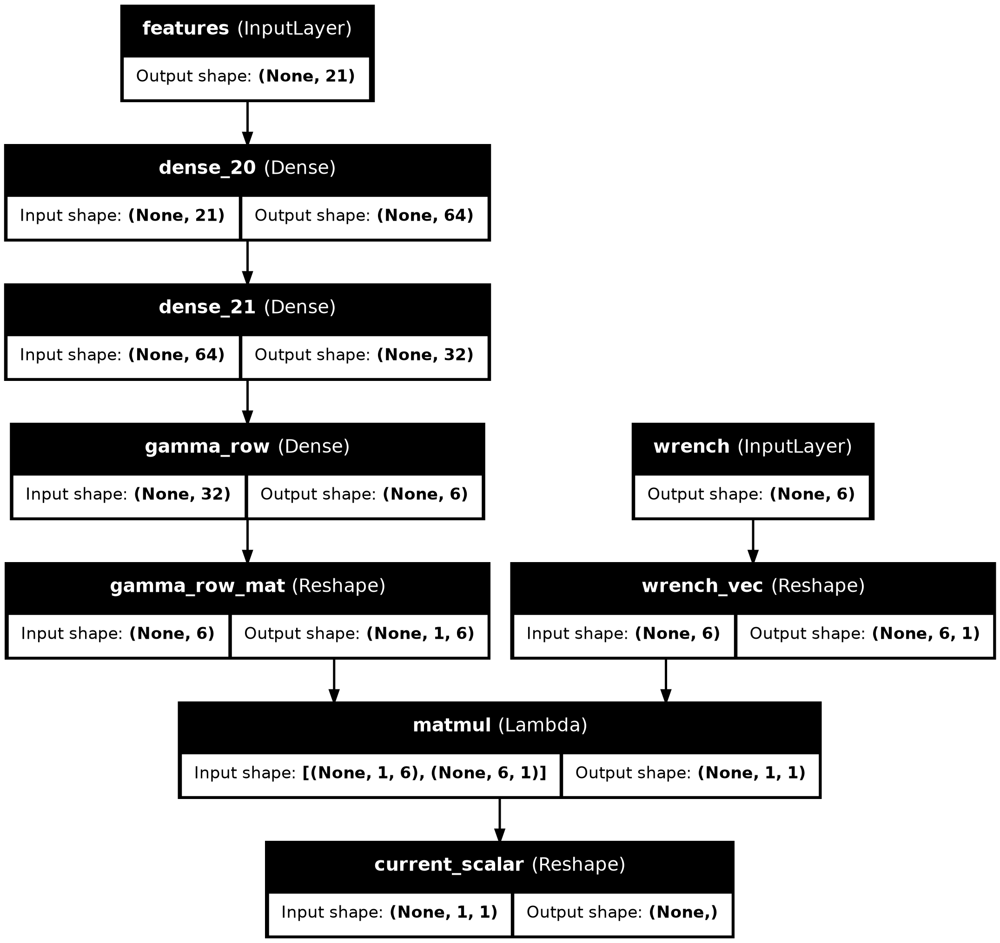

In [75]:
# 1) Console summary (layers, shapes, params)
model.summary(line_length=140, expand_nested=True)

# 2) Graph image (requires pydot + graphviz installed)
from tensorflow.keras.utils import plot_model
plot_model(
    model,
    to_file="gamma_inv_model.png",
    show_shapes=True,
    show_layer_names=True,
    dpi=180,
    rankdir="TB"
)


In [82]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np

class Sine(layers.Layer):
    def __init__(self, w0=1.0, **kwargs):
        super().__init__(**kwargs)
        self.w0 = w0
    def call(self, inputs):
        return tf.sin(self.w0 * inputs)

def build_single_coil_siren_model(n_features: int, w0=30.0):
    feat_in = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(6,), name="wrench")

    # First SIREN layer with special init
    init_first = keras.initializers.RandomUniform(
        minval=-1/n_features, maxval=1/n_features
    )
    x = layers.Dense(64, kernel_initializer=init_first)(feat_in)
    x = Sine(w0=w0)(x)

    # Hidden SIREN layers
    for _ in range(4):
        x = layers.Dense(64, kernel_initializer="lecun_normal")(x)
        x = Sine(w0=1.0)(x)

    # Output: 6 coefficients for this coil's row
    gamma_row_flat = layers.Dense(6, activation="linear", name="gamma_row")(x)

    # Physics multiply
    wrench_vec = layers.Reshape((6, 1), name="wrench_vec")(wrench_in)
    gamma_row_mat = layers.Reshape((1, 6), name="gamma_row_mat")(gamma_row_flat)
    current_pred = layers.Lambda(lambda t: tf.matmul(t[0], t[1]), name="matmul")([gamma_row_mat, wrench_vec])
    current_pred = layers.Reshape((), name="current_scalar")(current_pred)

    model = keras.Model(inputs=[feat_in, wrench_in], outputs=current_pred, name="single_coil_siren")
    model.compile(optimizer=keras.optimizers.Adam(1e-4), loss="mse")  # Lower LR for SIREN
    return model


In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow import keras

# --- Choose target coil ---
coil_target = "current_16"  # change this to whichever coil you want

# --- Prepare inputs/target ---
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

X_feat = df[feature_cols].astype("float32")
W = df[WRENCH_COLS].astype("float32")
y_target = df[coil_target].astype("float32")

# --- Train/validation split ---
X_tr, X_va, W_tr, W_va, y_tr, y_va = train_test_split(
    X_feat.values, W.values, y_target.values,
    test_size=0.1, random_state=42
)

# --- Build SIREN model ---
model = build_single_coil_siren_model(n_features=X_feat.shape[1], w0=30.0)

# --- Callbacks ---
cbs = [
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=2, min_lr=1e-6, verbose=1)
]

# --- Train ---
history = model.fit(
    [X_tr, W_tr], y_tr,
    validation_data=([X_va, W_va], y_va),
    epochs=400,            # SIREN sometimes needs more epochs
    batch_size=512,
    verbose=1,
    callbacks=cbs
)


Epoch 1/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 46.2157 - val_loss: 40.0440 - learning_rate: 1.0000e-04
Epoch 2/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.8428 - val_loss: 39.8267 - learning_rate: 1.0000e-04
Epoch 3/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.5672 - val_loss: 39.5671 - learning_rate: 1.0000e-04
Epoch 4/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.4381 - val_loss: 39.3495 - learning_rate: 1.0000e-04
Epoch 5/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.3609 - val_loss: 39.3015 - learning_rate: 1.0000e-04
Epoch 6/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.2999 - val_loss: 39.2392 - learning_rate: 1.0000e-04
Epoch 7/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.2600 - val_loss: 39.1833 - learning_rate: 1.0000e-04
Epoch 8/400
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 39.2225 - val_loss: 39.1946 - learning_rate: 1.0000e-04
Epoch 9/400
2262/2264 ━━━━━━━━━━━━━━━━━━━━ 0s 1m

Validation MSE: 34.609981


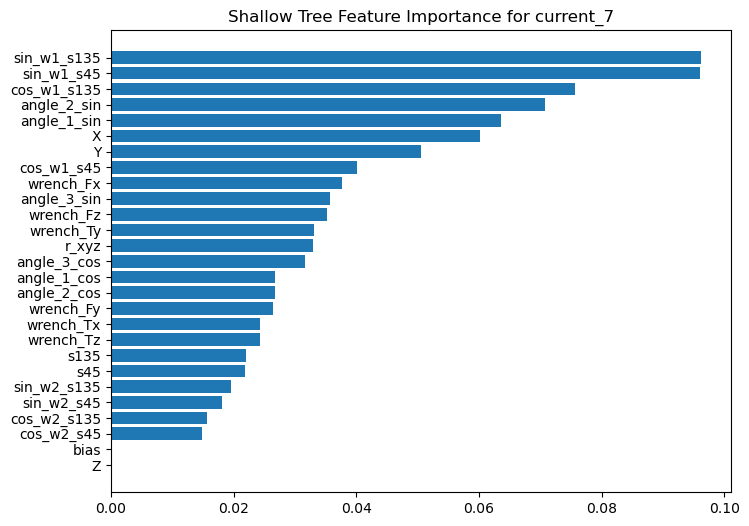

In [90]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

# --- Choose coil ---
coil_target = "current_7"  # pick your coil

# --- Prepare data ---
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

# Combine features + wrench
X_all = np.hstack([df[feature_cols].values, df[WRENCH_COLS].values])
y_target = df[coil_target].values

# --- Split ---
X_tr, X_va, y_tr, y_va = train_test_split(X_all, y_target, test_size=0.1, random_state=42)

# --- Shallow tree ---
tree = DecisionTreeRegressor(
    max_depth=1024,        # shallow
    min_samples_leaf=3,
    random_state=42
)
tree.fit(X_tr, y_tr)

# --- Evaluate ---
y_pred = tree.predict(X_va)
mse_val = mean_squared_error(y_va, y_pred)
print(f"Validation MSE: {mse_val:.6f}")

# --- Optional: Feature importance ---
import matplotlib.pyplot as plt
importances = tree.feature_importances_
all_feature_names = feature_cols + WRENCH_COLS
sorted_idx = np.argsort(importances)[::-1]

plt.figure(figsize=(8, 6))
plt.barh([all_feature_names[i] for i in sorted_idx], importances[sorted_idx])
plt.gca().invert_yaxis()
plt.title(f"Shallow Tree Feature Importance for {coil_target}")
plt.show()


In [92]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
import numpy as np

# --- Choose coil ---
coil_target = "current_7"

# --- Prepare data ---
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

X_feat = df[feature_cols].values
W_mat = df[WRENCH_COLS].values
curr = df[coil_target].values.reshape(-1, 1)

# --- Solve for per-sample 1×6 gamma_row via least squares ---
# W_mat: (n_samples, 6), curr: (n_samples, 1)
# gamma_row: (n_samples, 6)
gamma_rows = []
for i in range(len(W_mat)):
    w = W_mat[i].reshape(6, 1)
    # pseudo-inverse multiplication to solve gamma_row * w = current
    coeffs, _, _, _ = np.linalg.lstsq(w.T, curr[i], rcond=None)
    gamma_rows.append(coeffs.flatten())
gamma_rows = np.array(gamma_rows)

# --- Split ---
X_tr, X_va, G_tr, G_va, W_tr, W_va, y_tr, y_va = train_test_split(
    X_feat, gamma_rows, W_mat, curr, test_size=0.1, random_state=42
)

# --- Multi-output regression tree ---
tree = DecisionTreeRegressor(max_depth=1024, min_samples_leaf=3, random_state=42)
tree.fit(X_tr, G_tr)

# --- Predict currents via physics multiply ---
G_pred = tree.predict(X_va)                        # (n_samples, 6)
y_pred = np.einsum('ij,ij->i', G_pred, W_va)        # dot product row-wise

# --- Evaluate ---
from sklearn.metrics import mean_squared_error
mse_val = mean_squared_error(y_va, y_pred)
print(f"Validation MSE: {mse_val:.6f}")


Validation MSE: 470.139321


In [105]:
# W norm and y distribution checks
import numpy as np

W_np = W.values.astype(np.float32)
y_np = y_target.values.astype(np.float32) if hasattr(y_target, "values") else y_target.astype(np.float32)

w_norm = np.linalg.norm(W_np, axis=1)
print(
    "W norm: min/median/max = ",
    float(w_norm.min()), float(np.median(w_norm)), float(w_norm.max()),
    "| frac(|W|<1e-3):", float((w_norm < 1e-3).mean())
)
print(
    "y stats: mean/std/min/max = ",
    float(y_np.mean()), float(y_np.std()), float(y_np.min()), float(y_np.max())
)


W norm: min/median/max =  1.0 29.034086227416992 74.95047760009766 | frac(|W|<1e-3): 0.0
y stats: mean/std/min/max =  -0.004390711896121502 6.260849952697754 -10.0 10.0


sdfghjk

In [106]:
# 1) Normalize features, wrench, and target; add wrench bias
from sklearn.model_selection import train_test_split
import numpy as np

# Feature/Wrench/Target arrays
X = df[feature_cols].values.astype("float32")
W6 = df[["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]].values.astype("float32")
y = df[coil_target].values.astype("float32")

# Standardization
X_mean, X_std = X.mean(0), X.std(0) + 1e-8
W_mean, W_std = W6.mean(0), W6.std(0) + 1e-8
y_mean, y_std = y.mean(), y.std() + 1e-8

Xn = (X - X_mean) / X_std
Wn6 = (W6 - W_mean) / W_std
Wn = np.hstack([Wn6, np.ones((len(W6), 1), dtype=np.float32)])  # bias term
yn = (y - y_mean) / y_std

X_tr, X_va, W_tr, W_va, y_tr, y_va = train_test_split(Xn, Wn, yn, test_size=0.1, random_state=42)


In [107]:
# 2) SIREN with correct init + 7-d wrench (bias)
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np

class Sine(layers.Layer):
    def __init__(self, w0=1.0, **kwargs):
        super().__init__(**kwargs); self.w0 = w0
    def call(self, x): return tf.sin(self.w0 * x)

def siren_init_first(n_in):
    return keras.initializers.RandomUniform(minval=-1.0/n_in, maxval=1.0/n_in)

def siren_init(n_in, w0=1.0):
    b = np.sqrt(6 / n_in) / w0
    return keras.initializers.RandomUniform(minval=-b, maxval=b)

def build_single_coil_siren_model(n_features: int, hidden=64, depth=3, w0=30.0):
    feat_in   = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(7,), name="wrench")   # 6 normalized + bias

    x = layers.Dense(hidden, kernel_initializer=siren_init_first(n_features))(feat_in)
    x = Sine(w0=w0)(x)
    for _ in range(depth):
        x = layers.Dense(hidden, kernel_initializer=siren_init(hidden, w0=1.0))(x)
        x = Sine(w0=1.0)(x)

    gamma_row_flat = layers.Dense(7, activation="linear", name="gamma_row")(x)  # 7 coeffs (incl. bias)
    wrench_vec     = layers.Reshape((7, 1), name="wrench_vec")(wrench_in)
    gamma_row_mat  = layers.Reshape((1, 7), name="gamma_row_mat")(gamma_row_flat)
    current_pred   = layers.Lambda(lambda t: tf.matmul(t[0], t[1]), name="matmul")([gamma_row_mat, wrench_vec])
    current_pred   = layers.Reshape((), name="current_scalar")(current_pred)

    model = keras.Model([feat_in, wrench_in], current_pred, name="single_coil_siren_bias")
    model.compile(optimizer=keras.optimizers.Adam(5e-4), loss="mse")  # slightly higher LR
    return model


In [108]:
# 3) Train (no early stopping). Remember: predictions are normalized; de-normalize later.
model = build_single_coil_siren_model(n_features=X_tr.shape[1], hidden=64, depth=3, w0=30.0)
history = model.fit([X_tr, W_tr], y_tr, validation_data=([X_va, W_va], y_va),
                    epochs=150, batch_size=512, verbose=1)


Epoch 1/150


2025-08-14 19:28:53.356472: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_288', 8 bytes spill stores, 8 bytes spill loads

2025-08-14 19:28:53.800703: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_288', 8 bytes spill stores, 8 bytes spill loads

2025-08-14 19:28:54.264560: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_433', 504 bytes spill stores, 512 bytes spill loads

2025-08-14 19:28:54.285134: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_288', 308 bytes spill stores, 188 bytes spill loads

2025-08-14 19:28:54.601532: I external/local

2236/2264 ━━━━━━━━━━━━━━━━━━━━ 0s 948us/step - loss: 1.5576

2025-08-14 19:28:59.152472: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_433', 460 bytes spill stores, 476 bytes spill loads

2025-08-14 19:28:59.426169: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_288', 660 bytes spill stores, 396 bytes spill loads



2264/2264 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5529  

2025-08-14 19:29:03.066208: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_54', 660 bytes spill stores, 396 bytes spill loads



2264/2264 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - loss: 1.1732 - val_loss: 1.0171
Epoch 2/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1.0095 - val_loss: 1.0102
Epoch 3/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.9937 - val_loss: 0.9721
Epoch 4/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.9433 - val_loss: 0.9235
Epoch 5/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.9047 - val_loss: 0.8847
Epoch 6/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.8709 - val_loss: 0.8627
Epoch 7/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.8497 - val_loss: 0.8441
Epoch 8/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.8278 - val_loss: 0.8227
Epoch 9/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.8079 - val_loss: 0.8052
Epoch 10/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.7907 - val_loss: 0.7862
Epoch 11/150
2264/2264 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 0.7710 - val_loss: 0.7690
Epoch 12/150
2264/2264 ━━━━━━━

In [109]:
# 4) Eval with de-normalization
y_pred_n = model.predict([X_va, W_va], batch_size=1024, verbose=0).ravel()
y_pred   = y_pred_n * y_std + y_mean
y_true   = y_va * y_std + y_mean

from sklearn.metrics import mean_squared_error
print("Val MSE:", mean_squared_error(y_true, y_pred))


2025-08-14 19:35:23.329898: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_48', 8 bytes spill stores, 8 bytes spill loads

2025-08-14 19:35:23.443869: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_48', 8 bytes spill stores, 8 bytes spill loads

2025-08-14 19:35:24.504245: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_48', 308 bytes spill stores, 188 bytes spill loads

2025-08-14 19:35:25.387764: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24', 4 bytes spill stores, 4 bytes spill loads

2025-08-14 19:35:26.506470: I external/local_xla/xla

Val MSE: 24.970903396606445


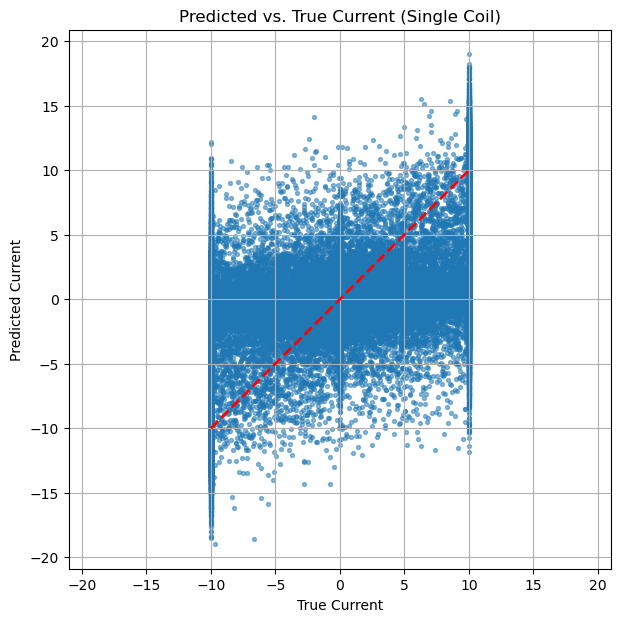

In [110]:
import matplotlib.pyplot as plt

# --- Predict ---
y_pred_n = model.predict([X_va, W_va], batch_size=1024, verbose=0).ravel()
y_pred   = y_pred_n * y_std + y_mean   # de-normalize
y_true   = y_va * y_std + y_mean       # de-normalize

# --- Plot ---
plt.figure(figsize=(7,7))
plt.scatter(y_true, y_pred, s=8, alpha=0.5)
plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
plt.xlabel("True Current")
plt.ylabel("Predicted Current")
plt.title("Predicted vs. True Current (Single Coil)")
plt.grid(True)
plt.axis("equal")
plt.show()


In [111]:
# --- 0) Split into train/val/test FIRST (disjoint) ---
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.metrics import mean_squared_error

WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
coil_target = "current_16"  # set your coil

feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + [c for c in df.columns if c.startswith("current_")])]
X_all = df[feature_cols].values.astype("float32")
W_all = df[WRENCH_COLS].values.astype("float32")
y_all = df[coil_target].values.astype("float32")

# shuffle once, then split
rng = np.random.default_rng(42)
idx = rng.permutation(len(X_all))
X_all, W_all, y_all = X_all[idx], W_all[idx], y_all[idx]

X_tmp, X_te, W_tmp, W_te, y_tmp, y_te = train_test_split(X_all, W_all, y_all, test_size=0.15, random_state=42)
X_tr,  X_va, W_tr,  W_va, y_tr,  y_va  = train_test_split(X_tmp, W_tmp, y_tmp, test_size=0.1765, random_state=42)  # 0.1765*0.85≈0.15

# --- 1) Fit normalization on TRAIN ONLY ---
eps = 1e-8
X_mean, X_std = X_tr.mean(0), X_tr.std(0) + eps
W_mean, W_std = W_tr.mean(0), W_tr.std(0) + eps
y_mean, y_std = y_tr.mean(), y_tr.std() + eps

def norm_X(x): return (x - X_mean) / X_std
def norm_W(w): return (w - W_mean) / W_std
def norm_y(y): return (y - y_mean) / y_std
def denorm_y(y): return y * y_std + y_mean

X_tr_n, X_va_n, X_te_n = norm_X(X_tr), norm_X(X_va), norm_X(X_te)
W_tr_n, W_va_n, W_te_n = norm_W(W_tr), norm_W(W_va), norm_W(W_te)

# --- 2) Add wrench bias (must be present everywhere) ---
W_tr_n = np.hstack([W_tr_n, np.ones((len(W_tr_n), 1), dtype=np.float32)])
W_va_n = np.hstack([W_va_n, np.ones((len(W_va_n), 1), dtype=np.float32)])
W_te_n = np.hstack([W_te_n, np.ones((len(W_te_n), 1), dtype=np.float32)])

y_tr_n, y_va_n, y_te_n = norm_y(y_tr), norm_y(y_va), norm_y(y_te)

# --- 3) Build & train (your SIREN or linear head); example: linear head for speed ---
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf

def build_single_coil_linear_bias(n_features):
    feat_in   = keras.Input(shape=(n_features,), name="features")
    wrench_in = keras.Input(shape=(7,), name="wrench")  # 6 normed + bias
    # simple linear head -> 7 coeffs
    gamma_row = layers.Dense(7, activation="linear", name="gamma_row")(feat_in)
    I_pred = layers.Lambda(lambda t: tf.reduce_sum(t[0]*t[1], axis=-1), name="dot")([gamma_row, wrench_in])
    m = keras.Model([feat_in, wrench_in], I_pred)
    m.compile(optimizer=keras.optimizers.Adam(5e-4), loss="mse")
    return m

model = build_single_coil_linear_bias(X_tr_n.shape[1])
model.fit([X_tr_n, W_tr_n], y_tr_n,
          validation_data=([X_va_n, W_va_n], y_va_n),
          epochs=80, batch_size=512, verbose=1)

# --- 4) Evaluate consistently: normalized & raw for both val and test ---
def eval_block(Xn, Wn, y_raw, y_norm, tag):
    y_pred_n = model.predict([Xn, Wn], batch_size=2048, verbose=0).ravel()
    y_pred   = denorm_y(y_pred_n)
    mse_norm = float(mean_squared_error(y_norm, y_pred_n))
    mse_raw  = float(mean_squared_error(y_raw,  y_pred))
    print(f"{tag} MSE (normalized): {mse_norm:.6f} | {tag} MSE (raw A^2): {mse_raw:.6f}")
    return mse_norm, mse_raw

_ = eval_block(X_va_n, W_va_n, y_va, y_va_n, "VAL")
_ = eval_block(X_te_n, W_te_n, y_te, y_te_n, "TEST")


Epoch 1/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 2.8796 - val_loss: 1.0695
Epoch 2/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 918us/step - loss: 1.0257 - val_loss: 1.0070
Epoch 3/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 941us/step - loss: 1.0038 - val_loss: 1.0022
Epoch 4/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 945us/step - loss: 1.0013 - val_loss: 1.0011
Epoch 5/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 951us/step - loss: 1.0007 - val_loss: 1.0006
Epoch 6/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 965us/step - loss: 1.0007 - val_loss: 1.0004
Epoch 7/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 960us/step - loss: 1.0006 - val_loss: 1.0015
Epoch 8/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 932us/step - loss: 1.0006 - val_loss: 1.0005
Epoch 9/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 902us/step - loss: 1.0006 - val_loss: 0.9995
Epoch 10/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 913us/step - loss: 1.0005 - val_loss: 1.0006
Epoch 11/80
1761/1761 ━━━━━━━━━━━━━━━━━━━━ 2s 922us/step - loss: 1.0006 - val_loss: 0.9997
Epoch 12/8

In [113]:
import matplotlib.pyplot as plt

# Predict
y_pred = model.predict([X_test, W_test], batch_size=512)

# Scatter plot: predicted vs actual
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.5, s=10)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Current")
plt.ylabel("Predicted Current")
plt.title("Predicted vs Actual Current")
plt.grid(True)
plt.show()


NameError: name 'X_test' is not defined

In [115]:
# Optional: quick gradient probe (expect non-zero norms)
with tf.GradientTape() as tape:
    yhat = model([X_tr[:7], W_tr[:7]], training=True)
    loss = tf.reduce_mean((yhat - y_tr[:7])**2)
grads = tape.gradient(loss, model.trainable_weights)
print([float(tf.norm(g)) if g is not None else 0.0 for g in grads[-6:]])


ValueError: Input 1 of layer "functional_2" is incompatible with the layer: expected shape=(None, 7), found shape=(7, 6)

In [116]:
# Step 1 — Label currents into {reverse=-1, off=0, on=+1}
def make_state_labels(y, t_off=1.0, t_on=5.0):
    """
    y: 1D array of currents [A]
    t_off: |y| < t_off -> off
    t_on:  y >= t_on -> on, y <= -t_on -> reverse
    middle band (t_off..t_on) is mapped by sign; tweak if you want to drop it.
    """
    import numpy as np
    y = y.astype(float)
    labels = np.zeros_like(y, dtype=int)
    labels[y >=  t_on]  = +1
    labels[y <= -t_on]  = -1
    mid_pos = (y >=  t_off) & (y <  t_on)
    mid_neg = (y <= -t_off) & (y > -t_on)
    labels[mid_pos] = +1
    labels[mid_neg] = -1
    return labels  # -1, 0, +1


In [117]:
# Step 2 — Train a shallow tree classifier (features + wrench → state)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

coil_target = "current_7"  # pick your coil

WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

X = np.hstack([df[feature_cols].values, df[WRENCH_COLS].values]).astype("float32")
y_reg = df[coil_target].values.astype("float32")
y_cls = make_state_labels(y_reg, t_off=1.0, t_on=5.0)

X_tr, X_te, y_tr, y_te = train_test_split(X, y_cls, test_size=0.2, random_state=42, stratify=y_cls)

# class weights to handle imbalance
unique, counts = np.unique(y_tr, return_counts=True)
cw = {int(k): float(len(y_tr)/c) for k, c in zip(unique, counts)}

clf = RandomForestClassifier(
    n_estimators=200,
    max_depth=8,
    min_samples_leaf=20,
    n_jobs=-1,
    class_weight=cw,
    random_state=42
)
clf.fit(X_tr, y_tr)

print(classification_report(y_te, clf.predict(X_te), digits=4))
print(confusion_matrix(y_te, clf.predict(X_te)))


              precision    recall  f1-score   support

          -1     0.5594    0.4738    0.5130     96570
           0     0.5754    0.7974    0.6684     64157
           1     0.5578    0.5003    0.5275     96805

    accuracy                         0.5644    257532
   macro avg     0.5642    0.5905    0.5696    257532
weighted avg     0.5628    0.5644    0.5572    257532

[[45754 18786 32030]
 [ 6641 51158  6358]
 [29402 18972 48431]]


kasezldknxgfjlklfdxgcn

In [ ]:
# 1) Labels: {-2, -1, 0, +1, +2}
def make_multistate_labels(y, off=1.0, mid=4.0, high=8.0):
    """
    off: |y| < off -> 0
    mild: off ≤ |y| < mid -> ±1
    strong: mid ≤ |y| < high -> ±2
    clamp any |y| ≥ high to ±2
    """
    import numpy as np
    y = y.astype(float)
    a = np.abs(y)
    lbl = np.zeros_like(y, dtype=int)
    lbl[(a >= off) & (a < mid) & (y > 0)] = +1
    lbl[(a >= off) & (a < mid) & (y < 0)] = -1
    lbl[(a >= mid) & (y > 0)] = +2
    lbl[(a >= mid) & (y < 0)] = -2
    return lbl


In [119]:
# 2) Prepare data + labels (same features as before)
coil_target = "current_7"
WRENCH_COLS = ["wrench_Fx","wrench_Fy","wrench_Fz","wrench_Tx","wrench_Ty","wrench_Tz"]
current_cols = [c for c in df.columns if c.startswith("current_")]
feature_cols = [c for c in df.columns if c not in set(WRENCH_COLS + current_cols)]

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

X = np.hstack([df[feature_cols].values, df[WRENCH_COLS].values]).astype("float32")
y_reg = df[coil_target].values.astype("float32")
y_cls = make_multistate_labels(y_reg, off=1.0, mid=4.0, high=8.0)

X_tr, X_te, y_tr, y_te = train_test_split(X, y_cls, test_size=0.2, random_state=42, stratify=y_cls)

# class weights (inverse frequency)
u, c = np.unique(y_tr, return_counts=True)
class_weight = {int(k): float(len(y_tr) / v) for k, v in zip(u, c)}


In [121]:
# 3) Train shallow-ish RF classifier
clf = RandomForestClassifier(
    n_estimators=300,
    max_depth=9,
    min_samples_leaf=20,
    n_jobs=-1,
    class_weight=class_weight,
    random_state=42,
    verbose=1

)
clf.fit(X_tr, y_tr)

print(classification_report(y_te, clf.predict(X_te), digits=4))
print(confusion_matrix(y_te, clf.predict(X_te)))


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   54.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.5min finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.1s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.4s
[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.7s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    0.1s


              precision    recall  f1-score   support

          -2     0.6491    0.3601    0.4632     84560
          -1     0.0951    0.2558    0.1387     12010
           0     0.5950    0.7869    0.6776     64157
           1     0.0922    0.2325    0.1320     12096
           2     0.5998    0.4459    0.5115     84709

    accuracy                         0.4838    257532
   macro avg     0.4062    0.4162    0.3846    257532
weighted avg     0.5674    0.4838    0.5018    257532



[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:    0.4s


[[30450 11162 13851 10175 18922]
 [ 1308  3072  3329  2578  1723]
 [ 1926  4975 50485  4251  2520]
 [ 1138  2764  3347  2812  2035]
 [12089 10320 13837 10695 37768]]


[Parallel(n_jobs=16)]: Done 300 out of 300 | elapsed:    0.7s finished
